In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import to_rgba
import matplotlib.image as mpimg
from PIL import Image
import numpy as np

plt.rcParams['font.sans-serif'] = ['SimHei'] 
plt.rcParams['axes.unicode_minus'] = False 

In [2]:
if os.path.exists('data_airfoils'):
    print("Folder exists.")
else:
    print("Folder does not exist.")

Folder exists.


In [3]:
'''
def dat_to_txt(dat_file_path, txt_file_path):
    # 读取 .dat 文件内容
    with open(dat_file_path, 'r') as dat_file:
        content = dat_file.read()
    
    # 将内容写入 .txt 文件
    with open(txt_file_path, 'w') as txt_file:
        txt_file.write(content)

def batch_convert_dat_to_txt(folder_path):
    # 遍历文件夹中的所有文件
    for filename in os.listdir(folder_path):
        if filename.endswith('.dat'):
            dat_file_path = os.path.join(folder_path, filename)
            # 生成对应的 .txt 文件路径
            txt_file_path = os.path.join(folder_path, filename[:-4] + '.txt')
            # 转换文件
            dat_to_txt(dat_file_path, txt_file_path)
            print(f'Converted {dat_file_path} to {txt_file_path}')


folder_path = 'data_airfoils'
batch_convert_dat_to_txt(folder_path)
'''

"\ndef dat_to_txt(dat_file_path, txt_file_path):\n    # 读取 .dat 文件内容\n    with open(dat_file_path, 'r') as dat_file:\n        content = dat_file.read()\n    \n    # 将内容写入 .txt 文件\n    with open(txt_file_path, 'w') as txt_file:\n        txt_file.write(content)\n\ndef batch_convert_dat_to_txt(folder_path):\n    # 遍历文件夹中的所有文件\n    for filename in os.listdir(folder_path):\n        if filename.endswith('.dat'):\n            dat_file_path = os.path.join(folder_path, filename)\n            # 生成对应的 .txt 文件路径\n            txt_file_path = os.path.join(folder_path, filename[:-4] + '.txt')\n            # 转换文件\n            dat_to_txt(dat_file_path, txt_file_path)\n            print(f'Converted {dat_file_path} to {txt_file_path}')\n\n\nfolder_path = 'data_airfoils'\nbatch_convert_dat_to_txt(folder_path)\n"

In [4]:
num_txt = 0
num_dat = 0
for file in os.listdir('data_airfoils'):
    if file.endswith('.txt'):
        num_txt += 1
    if file.endswith('.dat'):
        num_dat += 1
print(num_txt)
print(num_dat)


1565
0


In [5]:
file_path = []
for filename in os.listdir('data_airfoils'):
    file_path.append('data_airfoils/' + filename)
print(file_path)

['data_airfoils/2032c.txt', 'data_airfoils/a18.txt', 'data_airfoils/a18sm.txt', 'data_airfoils/a63a108c.txt', 'data_airfoils/ag03.txt', 'data_airfoils/ag04.txt', 'data_airfoils/ag08.txt', 'data_airfoils/ag09.txt', 'data_airfoils/ag10.txt', 'data_airfoils/ag11.txt', 'data_airfoils/ag12.txt', 'data_airfoils/ag13.txt', 'data_airfoils/ag14.txt', 'data_airfoils/ag16.txt', 'data_airfoils/ag17.txt', 'data_airfoils/ag18.txt', 'data_airfoils/ag19.txt', 'data_airfoils/ag24.txt', 'data_airfoils/ag25.txt', 'data_airfoils/ag26.txt', 'data_airfoils/ag27.txt', 'data_airfoils/ag35.txt', 'data_airfoils/ag36.txt', 'data_airfoils/ag37.txt', 'data_airfoils/ag38.txt', 'data_airfoils/ag44ct02r.txt', 'data_airfoils/ag455ct02r.txt', 'data_airfoils/ag45c03.txt', 'data_airfoils/ag45ct02r.txt', 'data_airfoils/ag46c03.txt', 'data_airfoils/ag46ct02r.txt', 'data_airfoils/ag47c03.txt', 'data_airfoils/ag47ct02r.txt', 'data_airfoils/ah21-7.txt', 'data_airfoils/ah21-9.txt', 'data_airfoils/ah63k127.txt', 'data_airfoils/

In [6]:
#file_path输入为字符串非列表
def DataShapeSet(file_path):    
    file_path_mid = file_path.replace('data_airfoils/','airfoils_img/')
    img_path = file_path_mid.replace('.txt','.png')
    data_airfoils = []
    # 读取文件内容
    with open(file_path, 'r', encoding='utf-8') as file:
        lines = file.readlines()
    # 删除空行
    non_empty_lines = [line for line in lines if line.strip() != '']
    # 将结果写回文件
    with open(file_path, 'w', encoding='utf-8') as file:
        file.writelines(non_empty_lines)

        
    with open(file_path, 'r') as file:
        for line in file:
            try:
                # 尝试将每一行的数据转换为浮点数
                data_airfoils.append(list(map(float, line.split())))
            except ValueError:
                # 如果转换失败，则跳过这一行
                continue
    
    x = [row[0] for row in data_airfoils]
    x = np.array(x)
    y = [row[1] for row in data_airfoils]
    y = np.array(y)

    #设置起始点
    if 1.1 > x[0] > 0.9:
        x[0] = 1.0
        x[-1] = 1.0
    if -0.1 < x[0] < 0.1:
        x[0] = 0.0
        x[-1] = 0.0
    y[0] = y[-1]
    y[-1] = 0.0

    '''
        for i in range(len(x)):
            x[i] = sum(x)/len(x)
    '''
    y = (y - np.average(abs(y)))/(np.max(y) - np.min(y))
    '''
        x_up = np.array([x[i] for i in range(len(x)) if y[i] >= 0]) #上翼面坐标点
        y_up = np.array([y[i] for i in range(len(y)) if y[i] >= 0])
        x_down = np.array([x[i] for i in range(len(x)) if y[i] < 0]) # 下翼面坐标点
        y_down = np.array([y[i] for i in range(len(y)) if y[i] < 0])
    '''
    fig, ax = plt.subplots(figsize = (256/100, 256/100))
    fig.patch.set_facecolor((1, 1, 1))
    ax.axis('off')
    ax.grid(False)
    ax.plot(x, y,color=(0, 0, 1))
    ax.set_ylim(-1, 1) 
    plt.savefig(img_path, pad_inches=0)
    plt.show()

    return img_path

In [7]:
def SaveGrayImg(img_path):
    # 打开图像
    img = Image.open(img_path)
    # 将图像转换为RGB模式
    img = img.convert('RGB')
    # 将图像转换为numpy数组
    img_array = np.array(img)
    # 定义蓝色和白色的RGB值
    blue = np.array([0, 0, 1])
    white = np.array([255, 255, 255])
    # 计算每个像素与蓝色和白色的欧氏距离
    dist_blue = np.linalg.norm(img_array - blue, axis=2)
    dist_white = np.linalg.norm(img_array - white, axis=2)
    # 将接近蓝色的像素设为1，接近白色的像素设为0
    img_array[dist_blue < dist_white] = 255
    img_array[dist_blue >= dist_white] = 0
    # 将numpy数组转换回图像
    img = Image.fromarray(img_array)
    # 保存结果
    img.save(img_path)

data_airfoils/2032c.txt


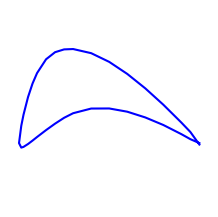

airfoils_img/2032c.png
data_airfoils/a18.txt


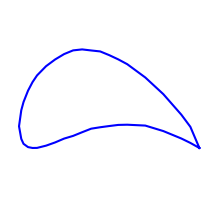

airfoils_img/a18.png
data_airfoils/a18sm.txt


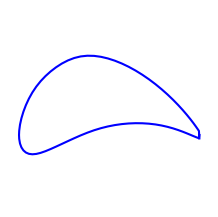

airfoils_img/a18sm.png
data_airfoils/a63a108c.txt


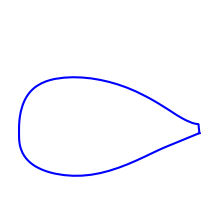

airfoils_img/a63a108c.png
data_airfoils/ag03.txt


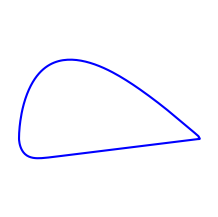

airfoils_img/ag03.png
data_airfoils/ag04.txt


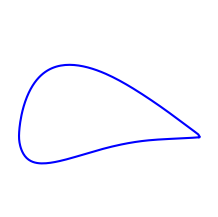

airfoils_img/ag04.png
data_airfoils/ag08.txt


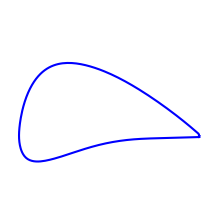

airfoils_img/ag08.png
data_airfoils/ag09.txt


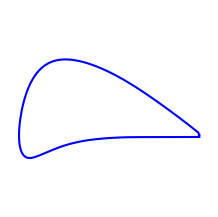

airfoils_img/ag09.png
data_airfoils/ag10.txt


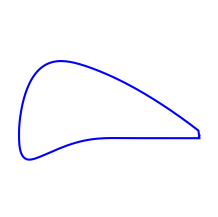

airfoils_img/ag10.png
data_airfoils/ag11.txt


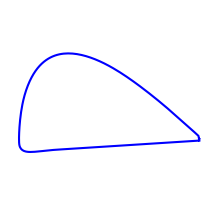

airfoils_img/ag11.png
data_airfoils/ag12.txt


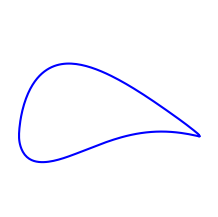

airfoils_img/ag12.png
data_airfoils/ag13.txt


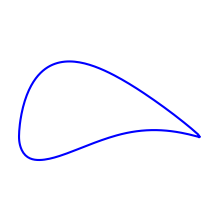

airfoils_img/ag13.png
data_airfoils/ag14.txt


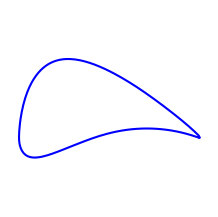

airfoils_img/ag14.png
data_airfoils/ag16.txt


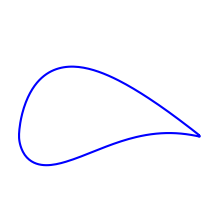

airfoils_img/ag16.png
data_airfoils/ag17.txt


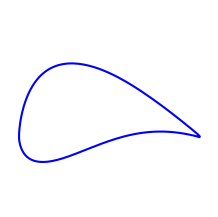

airfoils_img/ag17.png
data_airfoils/ag18.txt


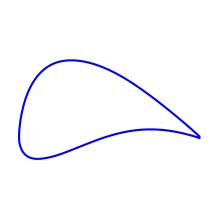

airfoils_img/ag18.png
data_airfoils/ag19.txt


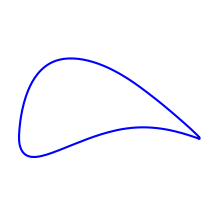

airfoils_img/ag19.png
data_airfoils/ag24.txt


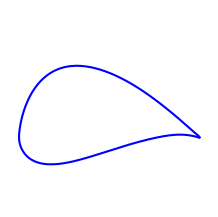

airfoils_img/ag24.png
data_airfoils/ag25.txt


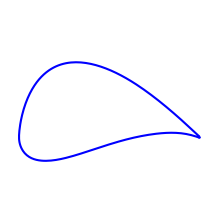

airfoils_img/ag25.png
data_airfoils/ag26.txt


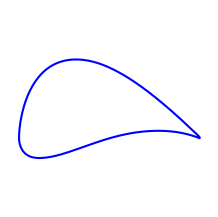

airfoils_img/ag26.png
data_airfoils/ag27.txt


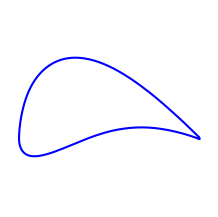

airfoils_img/ag27.png
data_airfoils/ag35.txt


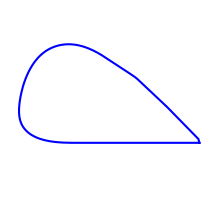

airfoils_img/ag35.png
data_airfoils/ag36.txt


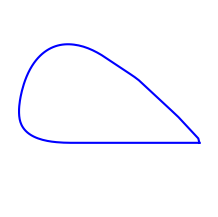

airfoils_img/ag36.png
data_airfoils/ag37.txt


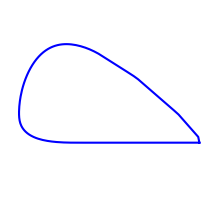

airfoils_img/ag37.png
data_airfoils/ag38.txt


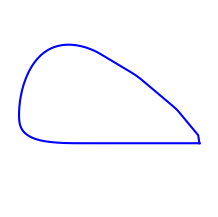

airfoils_img/ag38.png
data_airfoils/ag44ct02r.txt


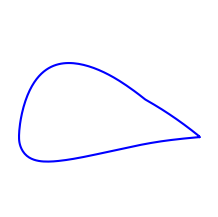

airfoils_img/ag44ct02r.png
data_airfoils/ag455ct02r.txt


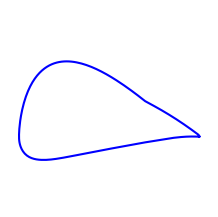

airfoils_img/ag455ct02r.png
data_airfoils/ag45c03.txt


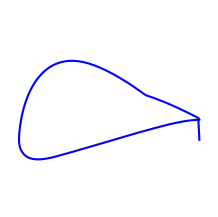

airfoils_img/ag45c03.png
data_airfoils/ag45ct02r.txt


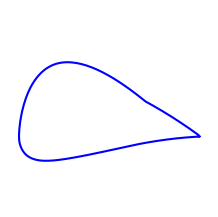

airfoils_img/ag45ct02r.png
data_airfoils/ag46c03.txt


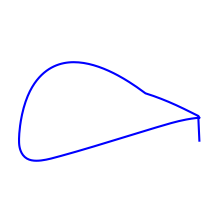

airfoils_img/ag46c03.png
data_airfoils/ag46ct02r.txt


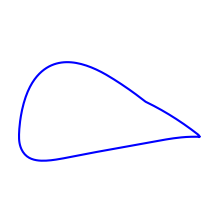

airfoils_img/ag46ct02r.png
data_airfoils/ag47c03.txt


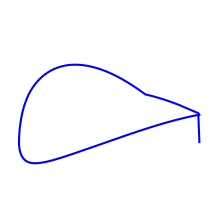

airfoils_img/ag47c03.png
data_airfoils/ag47ct02r.txt


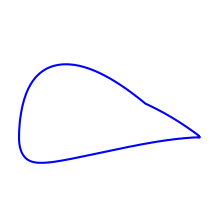

airfoils_img/ag47ct02r.png
data_airfoils/ah21-7.txt


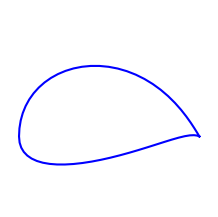

airfoils_img/ah21-7.png
data_airfoils/ah21-9.txt


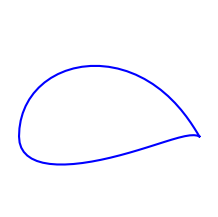

airfoils_img/ah21-9.png
data_airfoils/ah63k127.txt


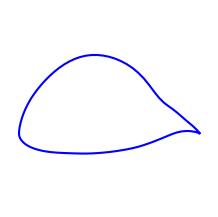

airfoils_img/ah63k127.png
data_airfoils/ah6407.txt


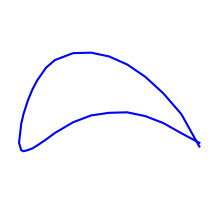

airfoils_img/ah6407.png
data_airfoils/ah7476.txt


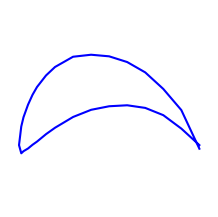

airfoils_img/ah7476.png
data_airfoils/ah79100a.txt


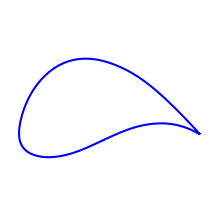

airfoils_img/ah79100a.png
data_airfoils/ah79100b.txt


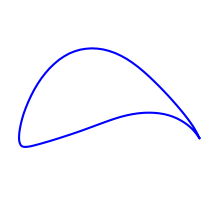

airfoils_img/ah79100b.png
data_airfoils/ah79100c.txt


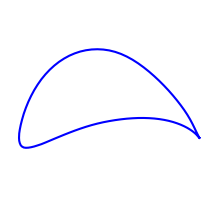

airfoils_img/ah79100c.png
data_airfoils/ah79k132.txt


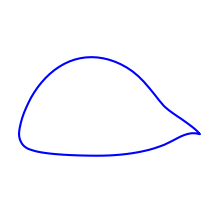

airfoils_img/ah79k132.png
data_airfoils/ah79k135.txt


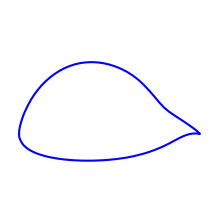

airfoils_img/ah79k135.png
data_airfoils/ah79k143.txt


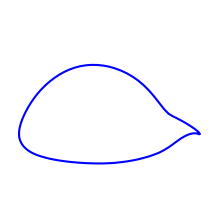

airfoils_img/ah79k143.png
data_airfoils/ah80129.txt


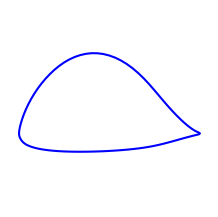

airfoils_img/ah80129.png
data_airfoils/ah80136.txt


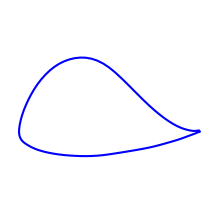

airfoils_img/ah80136.png
data_airfoils/ah80140.txt


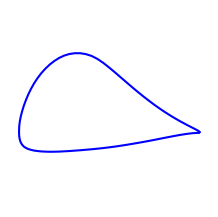

airfoils_img/ah80140.png
data_airfoils/ah81131.txt


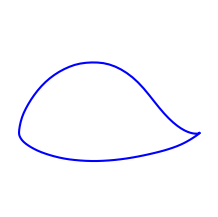

airfoils_img/ah81131.png
data_airfoils/ah81k144.txt


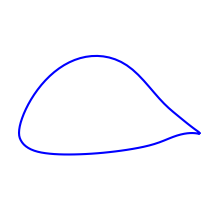

airfoils_img/ah81k144.png
data_airfoils/ah81k144wfKlappe.txt


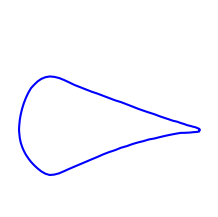

airfoils_img/ah81k144wfKlappe.png
data_airfoils/ah82150a.txt


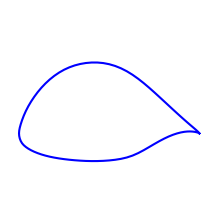

airfoils_img/ah82150a.png
data_airfoils/ah82150f.txt


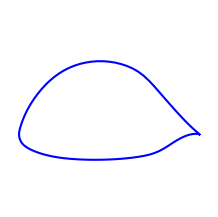

airfoils_img/ah82150f.png
data_airfoils/ah83150q.txt


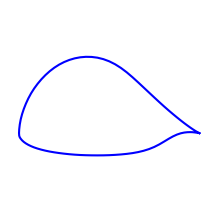

airfoils_img/ah83150q.png
data_airfoils/ah83159.txt


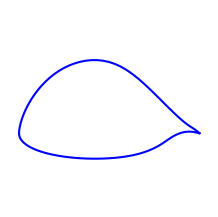

airfoils_img/ah83159.png
data_airfoils/ah85l120.txt


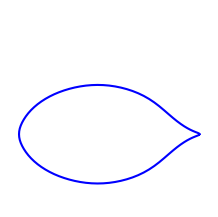

airfoils_img/ah85l120.png
data_airfoils/ah88k130.txt


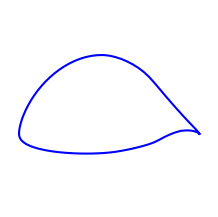

airfoils_img/ah88k130.png
data_airfoils/ah88k136.txt


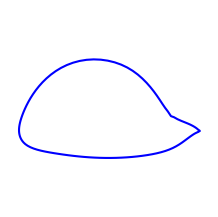

airfoils_img/ah88k136.png
data_airfoils/ah93156.txt


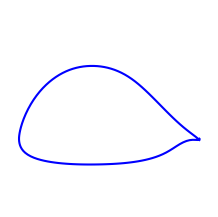

airfoils_img/ah93156.png
data_airfoils/ah93157.txt


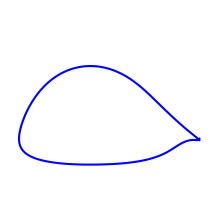

airfoils_img/ah93157.png
data_airfoils/ah93k130.txt


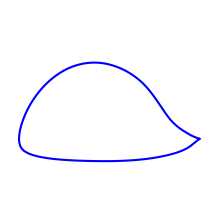

airfoils_img/ah93k130.png
data_airfoils/ah93k131.txt


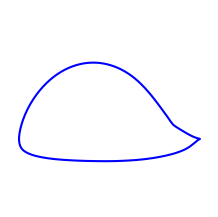

airfoils_img/ah93k131.png
data_airfoils/ah93k132.txt


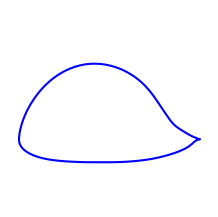

airfoils_img/ah93k132.png
data_airfoils/ah93w145.txt


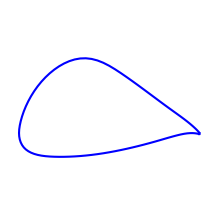

airfoils_img/ah93w145.png
data_airfoils/ah93w174.txt


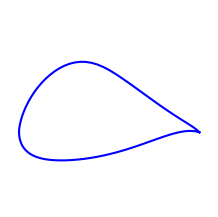

airfoils_img/ah93w174.png
data_airfoils/ah93w215.txt


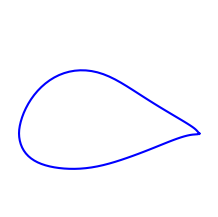

airfoils_img/ah93w215.png
data_airfoils/ah93w257.txt


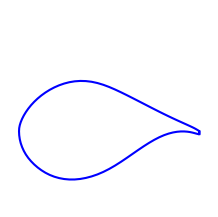

airfoils_img/ah93w257.png
data_airfoils/ah93w300.txt


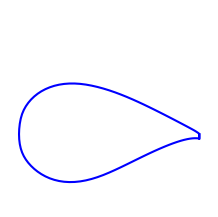

airfoils_img/ah93w300.png
data_airfoils/ah93w480b.txt


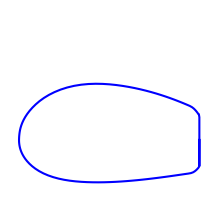

airfoils_img/ah93w480b.png
data_airfoils/ah94145.txt


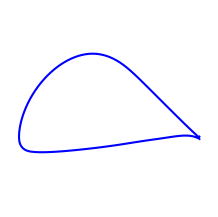

airfoils_img/ah94145.png
data_airfoils/ah94156.txt


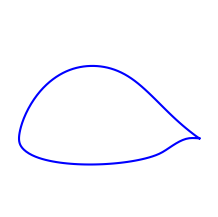

airfoils_img/ah94156.png
data_airfoils/ah94w301.txt


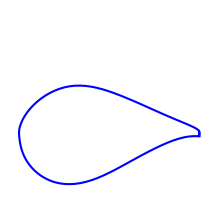

airfoils_img/ah94w301.png
data_airfoils/ah95160.txt


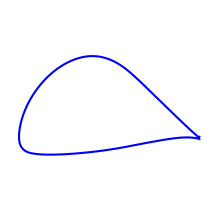

airfoils_img/ah95160.png
data_airfoils/ames01.txt


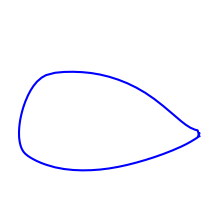

airfoils_img/ames01.png
data_airfoils/ames02.txt


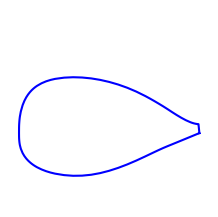

airfoils_img/ames02.png
data_airfoils/ames03.txt


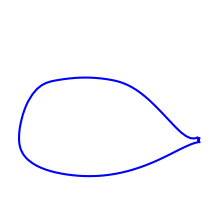

airfoils_img/ames03.png
data_airfoils/amsoil1.txt


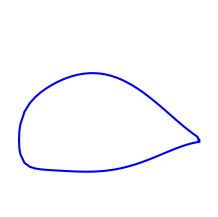

airfoils_img/amsoil1.png
data_airfoils/amsoil2.txt


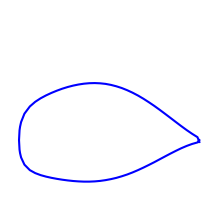

airfoils_img/amsoil2.png
data_airfoils/apex16.txt


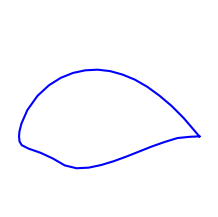

airfoils_img/apex16.png
data_airfoils/aquilasm.txt


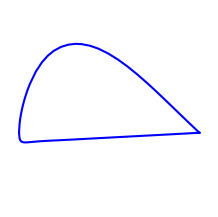

airfoils_img/aquilasm.png
data_airfoils/arad10.txt


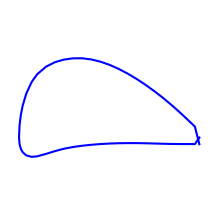

airfoils_img/arad10.png
data_airfoils/arad13.txt


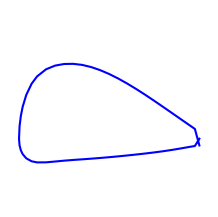

airfoils_img/arad13.png
data_airfoils/arad20.txt


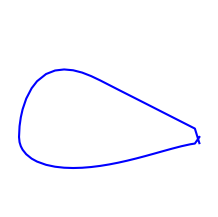

airfoils_img/arad20.png
data_airfoils/arad6.txt


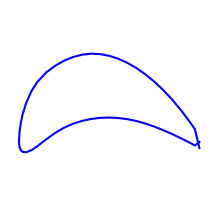

airfoils_img/arad6.png
data_airfoils/as5045.txt


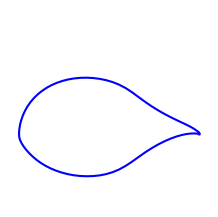

airfoils_img/as5045.png
data_airfoils/as5046.txt


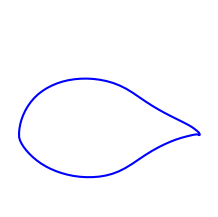

airfoils_img/as5046.png
data_airfoils/as5048.txt


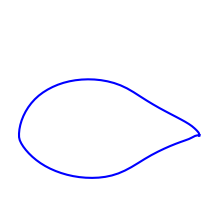

airfoils_img/as5048.png
data_airfoils/atr72sm.txt


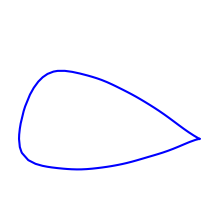

airfoils_img/atr72sm.png
data_airfoils/august160.txt


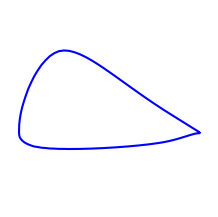

airfoils_img/august160.png
data_airfoils/avistar.txt


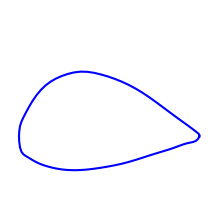

airfoils_img/avistar.png
data_airfoils/b29root.txt


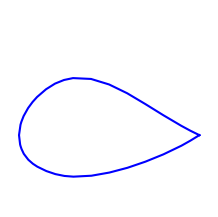

airfoils_img/b29root.png
data_airfoils/b29tip.txt


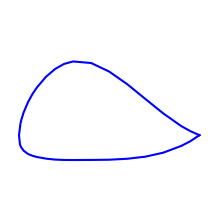

airfoils_img/b29tip.png
data_airfoils/b540ols.txt


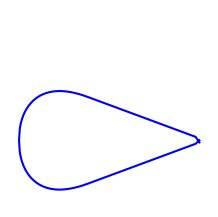

airfoils_img/b540ols.png
data_airfoils/b707a.txt


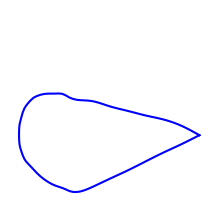

airfoils_img/b707a.png
data_airfoils/b707b.txt


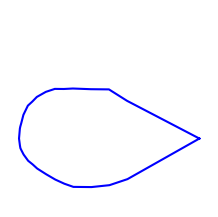

airfoils_img/b707b.png
data_airfoils/b707c.txt


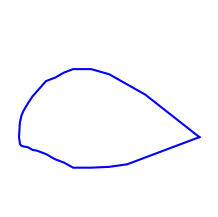

airfoils_img/b707c.png
data_airfoils/b707d.txt


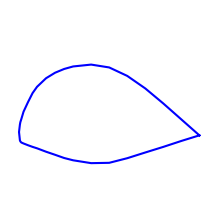

airfoils_img/b707d.png
data_airfoils/b707e.txt


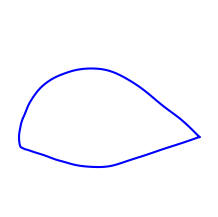

airfoils_img/b707e.png
data_airfoils/b737a.txt


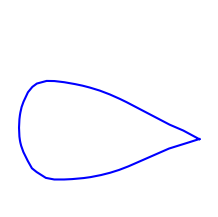

airfoils_img/b737a.png
data_airfoils/b737b.txt


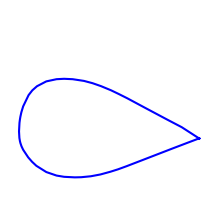

airfoils_img/b737b.png
data_airfoils/b737c.txt


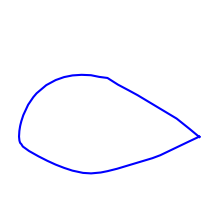

airfoils_img/b737c.png
data_airfoils/b737d.txt


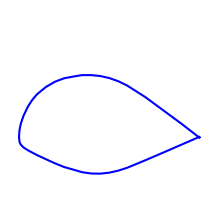

airfoils_img/b737d.png
data_airfoils/bacj.txt


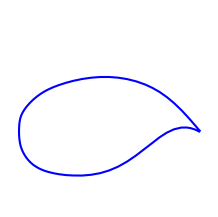

airfoils_img/bacj.png
data_airfoils/bacxxx.txt


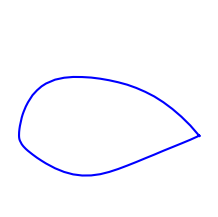

airfoils_img/bacxxx.png
data_airfoils/bambino6.txt


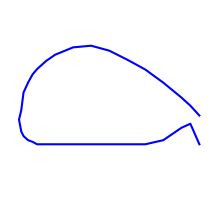

airfoils_img/bambino6.png
data_airfoils/be50.txt


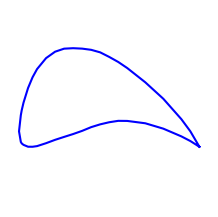

airfoils_img/be50.png
data_airfoils/be50sm.txt


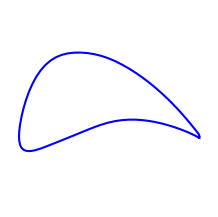

airfoils_img/be50sm.png
data_airfoils/boe103.txt


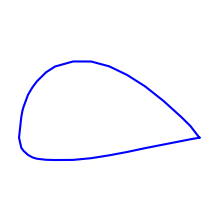

airfoils_img/boe103.png
data_airfoils/boe106.txt


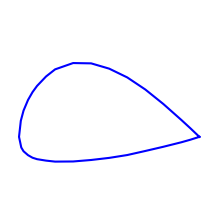

airfoils_img/boe106.png
data_airfoils/bqm34.txt


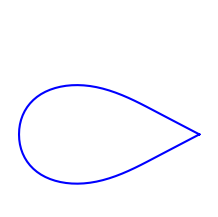

airfoils_img/bqm34.png
data_airfoils/bw3.txt


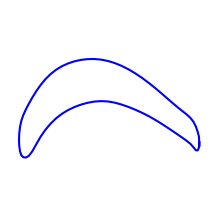

airfoils_img/bw3.png
data_airfoils/c141a.txt


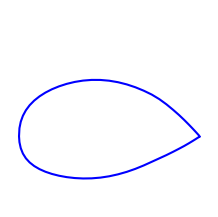

airfoils_img/c141a.png
data_airfoils/c141b.txt


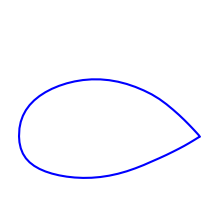

airfoils_img/c141b.png
data_airfoils/c141c.txt


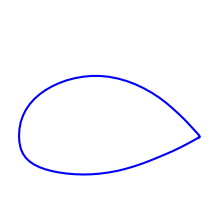

airfoils_img/c141c.png
data_airfoils/c141d.txt


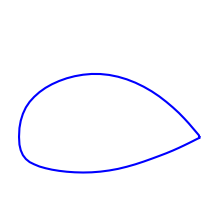

airfoils_img/c141d.png
data_airfoils/c141e.txt


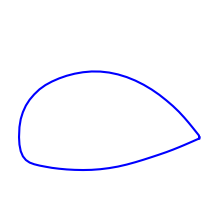

airfoils_img/c141e.png
data_airfoils/c141f.txt


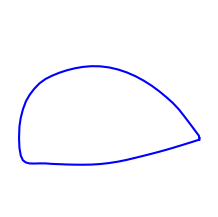

airfoils_img/c141f.png
data_airfoils/c5a.txt


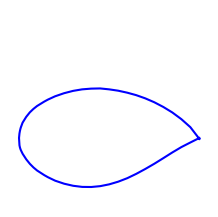

airfoils_img/c5a.png
data_airfoils/c5b.txt


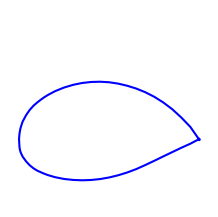

airfoils_img/c5b.png
data_airfoils/c5c.txt


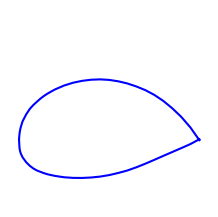

airfoils_img/c5c.png
data_airfoils/c5d.txt


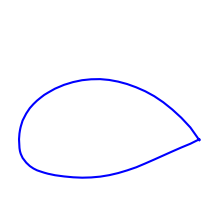

airfoils_img/c5d.png
data_airfoils/c5e.txt


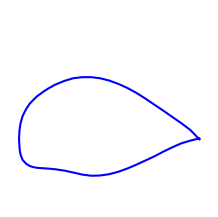

airfoils_img/c5e.png
data_airfoils/cap21c.txt


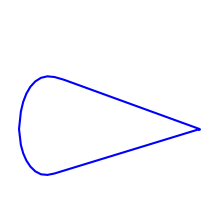

airfoils_img/cap21c.png
data_airfoils/cast102.txt


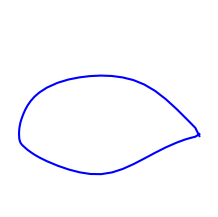

airfoils_img/cast102.png
data_airfoils/ch10sm.txt


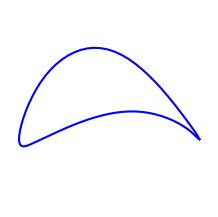

airfoils_img/ch10sm.png
data_airfoils/chen.txt


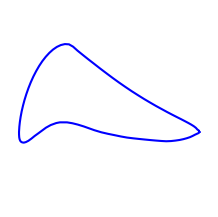

airfoils_img/chen.png
data_airfoils/clarkk.txt


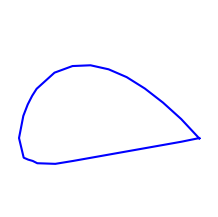

airfoils_img/clarkk.png
data_airfoils/clarkv.txt


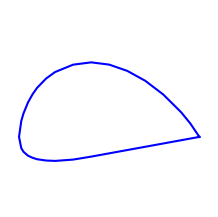

airfoils_img/clarkv.png
data_airfoils/clarkw.txt


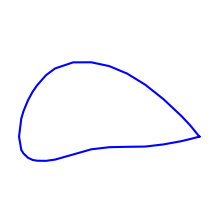

airfoils_img/clarkw.png
data_airfoils/clarkx.txt


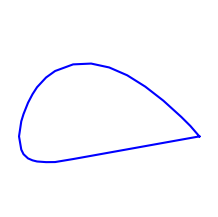

airfoils_img/clarkx.png
data_airfoils/clarky.txt


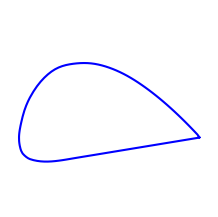

airfoils_img/clarky.png
data_airfoils/clarkyh.txt


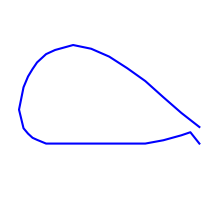

airfoils_img/clarkyh.png
data_airfoils/clarkys.txt


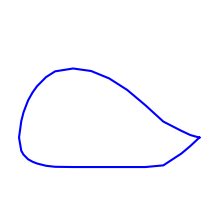

airfoils_img/clarkys.png
data_airfoils/clarkysm.txt


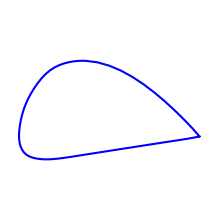

airfoils_img/clarkysm.png
data_airfoils/clarkz.txt


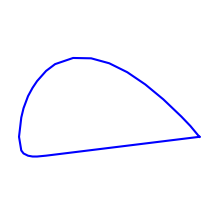

airfoils_img/clarkz.png
data_airfoils/clarym15.txt


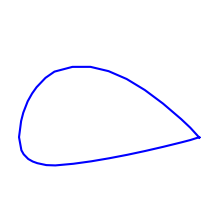

airfoils_img/clarym15.png
data_airfoils/clarym18.txt


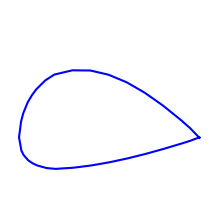

airfoils_img/clarym18.png
data_airfoils/coanda1.txt


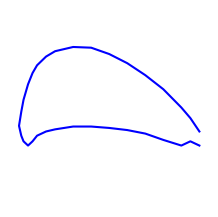

airfoils_img/coanda1.png
data_airfoils/coanda2.txt


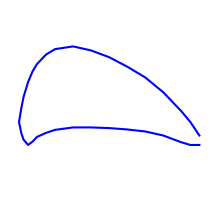

airfoils_img/coanda2.png
data_airfoils/coanda3.txt


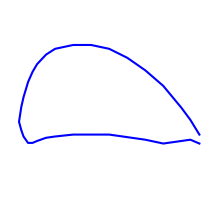

airfoils_img/coanda3.png
data_airfoils/cootie.txt


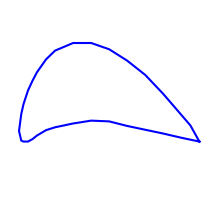

airfoils_img/cootie.png
data_airfoils/cr001sm.txt


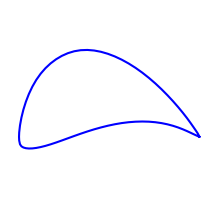

airfoils_img/cr001sm.png
data_airfoils/cr1.txt


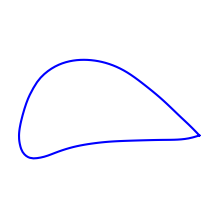

airfoils_img/cr1.png
data_airfoils/curtisc72.txt


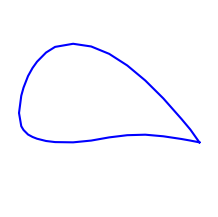

airfoils_img/curtisc72.png
data_airfoils/dae11.txt


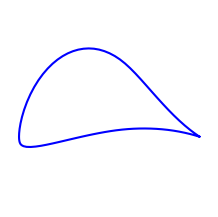

airfoils_img/dae11.png
data_airfoils/dae21.txt


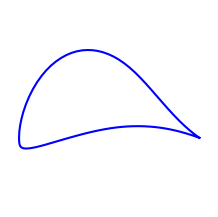

airfoils_img/dae21.png
data_airfoils/dae31.txt


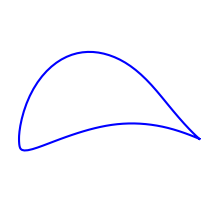

airfoils_img/dae31.png
data_airfoils/dae51.txt


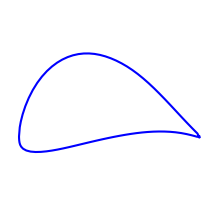

airfoils_img/dae51.png
data_airfoils/davis.txt


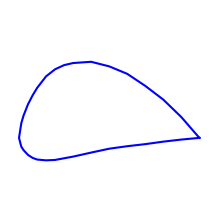

airfoils_img/davis.png
data_airfoils/davissm.txt


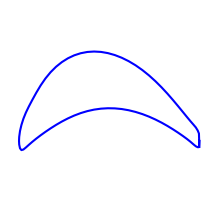

airfoils_img/davissm.png
data_airfoils/davis_corrected.txt


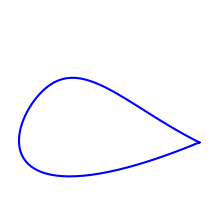

airfoils_img/davis_corrected.png
data_airfoils/daytonwright6.txt


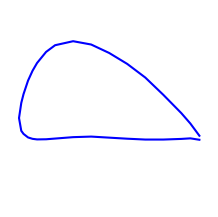

airfoils_img/daytonwright6.png
data_airfoils/daytonwrightt1.txt


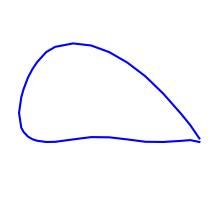

airfoils_img/daytonwrightt1.png
data_airfoils/dbln526.txt


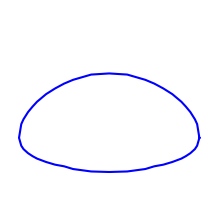

airfoils_img/dbln526.png
data_airfoils/defcnd1.txt


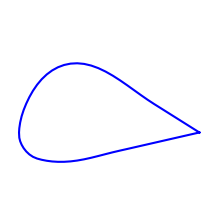

airfoils_img/defcnd1.png
data_airfoils/defcnd2.txt


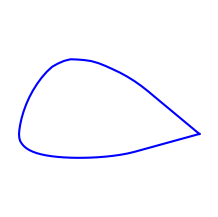

airfoils_img/defcnd2.png
data_airfoils/defcnd3.txt


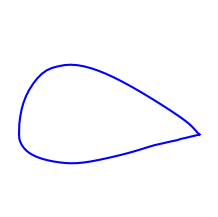

airfoils_img/defcnd3.png
data_airfoils/df101.txt


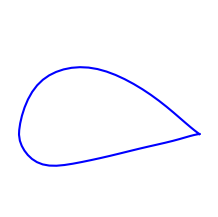

airfoils_img/df101.png
data_airfoils/df102.txt


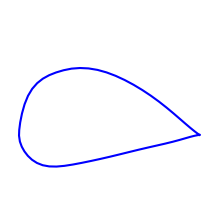

airfoils_img/df102.png
data_airfoils/dfvlrr4.txt


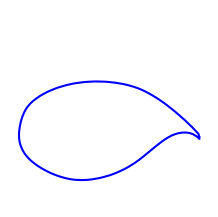

airfoils_img/dfvlrr4.png
data_airfoils/dga1138.txt


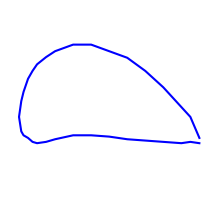

airfoils_img/dga1138.png
data_airfoils/dga1182.txt


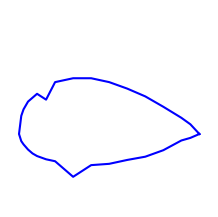

airfoils_img/dga1182.png
data_airfoils/dh4009sm.txt


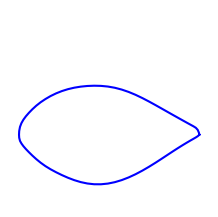

airfoils_img/dh4009sm.png
data_airfoils/doa5.txt


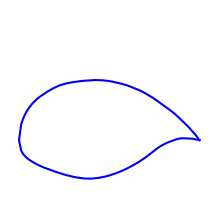

airfoils_img/doa5.png
data_airfoils/dormoy.txt


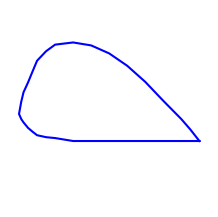

airfoils_img/dormoy.png
data_airfoils/drgnfly.txt


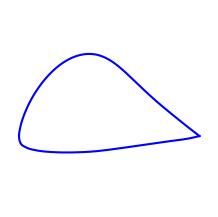

airfoils_img/drgnfly.png
data_airfoils/dsma523a.txt


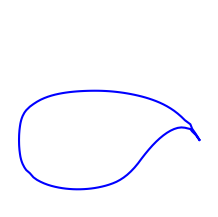

airfoils_img/dsma523a.png
data_airfoils/dsma523b.txt


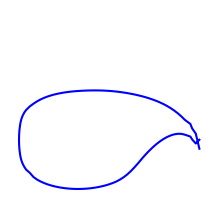

airfoils_img/dsma523b.png
data_airfoils/du8608418.txt


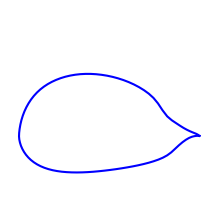

airfoils_img/du8608418.png
data_airfoils/du861372.txt


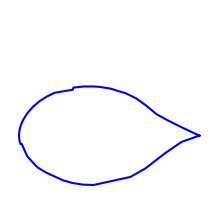

airfoils_img/du861372.png
data_airfoils/e1098.txt


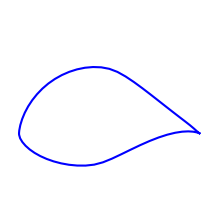

airfoils_img/e1098.png
data_airfoils/e1200.txt


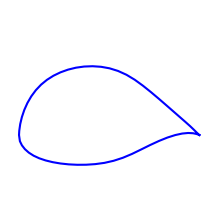

airfoils_img/e1200.png
data_airfoils/e1210.txt


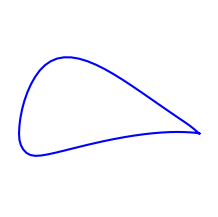

airfoils_img/e1210.png
data_airfoils/e1211.txt


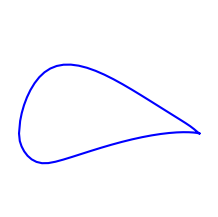

airfoils_img/e1211.png
data_airfoils/e1212.txt


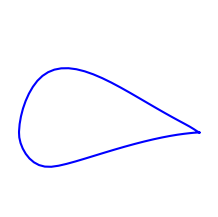

airfoils_img/e1212.png
data_airfoils/e1212mod.txt


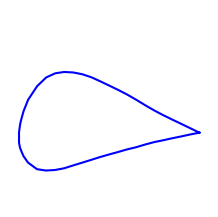

airfoils_img/e1212mod.png
data_airfoils/e1213.txt


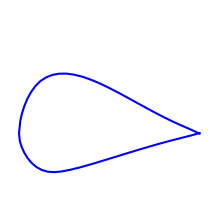

airfoils_img/e1213.png
data_airfoils/e1214.txt


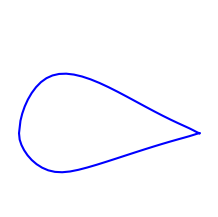

airfoils_img/e1214.png
data_airfoils/e1230.txt


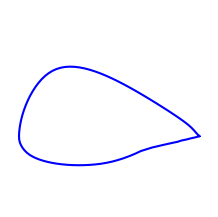

airfoils_img/e1230.png
data_airfoils/e1233.txt


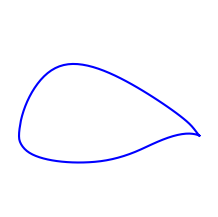

airfoils_img/e1233.png
data_airfoils/e168.txt


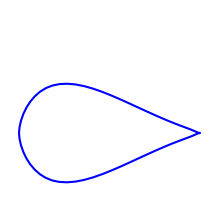

airfoils_img/e168.png
data_airfoils/e169.txt


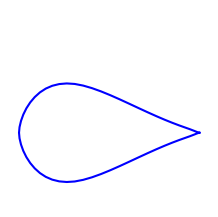

airfoils_img/e169.png
data_airfoils/e171.txt


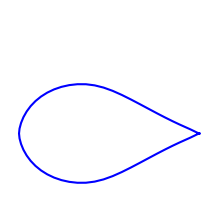

airfoils_img/e171.png
data_airfoils/e174.txt


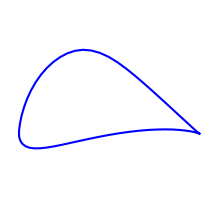

airfoils_img/e174.png
data_airfoils/e176.txt


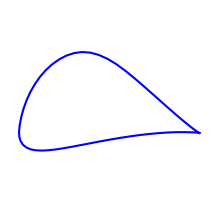

airfoils_img/e176.png
data_airfoils/e178.txt


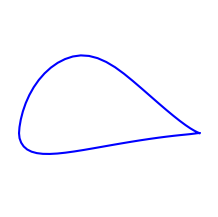

airfoils_img/e178.png
data_airfoils/e180.txt


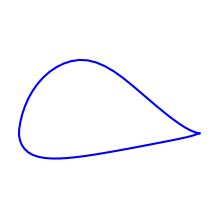

airfoils_img/e180.png
data_airfoils/e182.txt


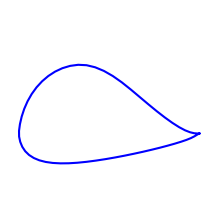

airfoils_img/e182.png
data_airfoils/e184.txt


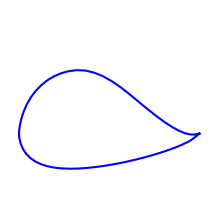

airfoils_img/e184.png
data_airfoils/e186.txt


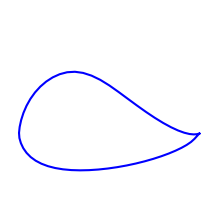

airfoils_img/e186.png
data_airfoils/e193.txt


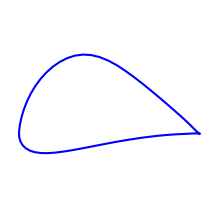

airfoils_img/e193.png
data_airfoils/e195.txt


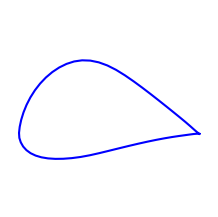

airfoils_img/e195.png
data_airfoils/e197.txt


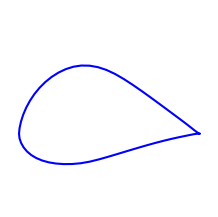

airfoils_img/e197.png
data_airfoils/e201.txt


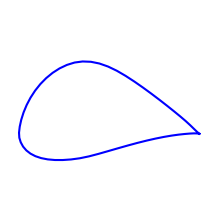

airfoils_img/e201.png
data_airfoils/e203.txt


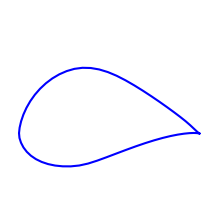

airfoils_img/e203.png
data_airfoils/e205.txt


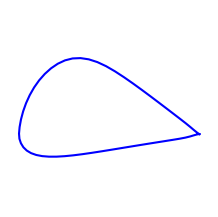

airfoils_img/e205.png
data_airfoils/e207.txt


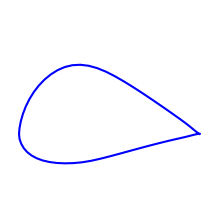

airfoils_img/e207.png
data_airfoils/e209.txt


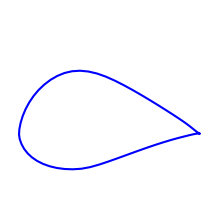

airfoils_img/e209.png
data_airfoils/e210.txt


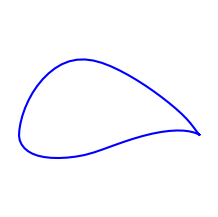

airfoils_img/e210.png
data_airfoils/e211.txt


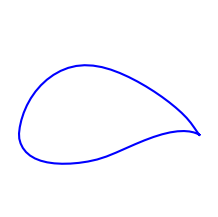

airfoils_img/e211.png
data_airfoils/e212.txt


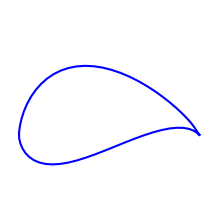

airfoils_img/e212.png
data_airfoils/e214.txt


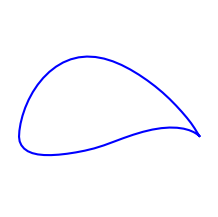

airfoils_img/e214.png
data_airfoils/e216.txt


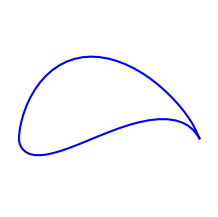

airfoils_img/e216.png
data_airfoils/e220.txt


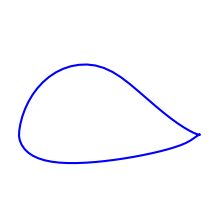

airfoils_img/e220.png
data_airfoils/e221.txt


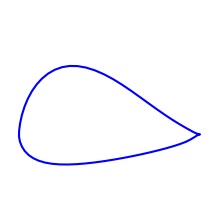

airfoils_img/e221.png
data_airfoils/e222.txt


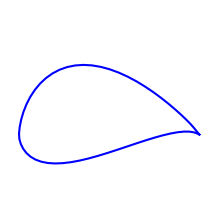

airfoils_img/e222.png
data_airfoils/e224.txt


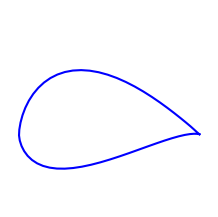

airfoils_img/e224.png
data_airfoils/e226.txt


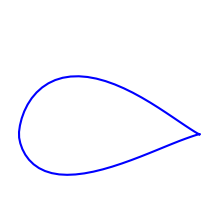

airfoils_img/e226.png
data_airfoils/e228.txt


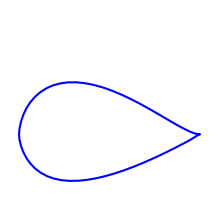

airfoils_img/e228.png
data_airfoils/e230.txt


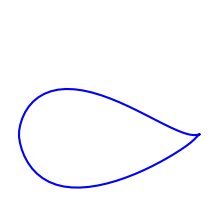

airfoils_img/e230.png
data_airfoils/e231.txt


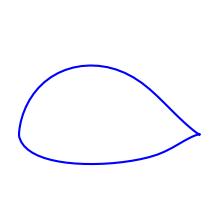

airfoils_img/e231.png
data_airfoils/e266.txt


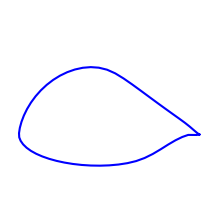

airfoils_img/e266.png
data_airfoils/e297.txt


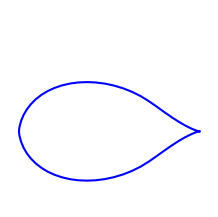

airfoils_img/e297.png
data_airfoils/e325.txt


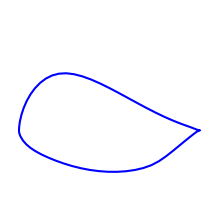

airfoils_img/e325.png
data_airfoils/e326.txt


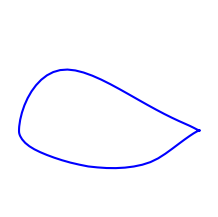

airfoils_img/e326.png
data_airfoils/e327.txt


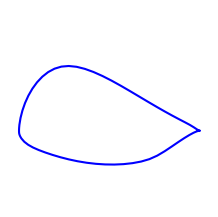

airfoils_img/e327.png
data_airfoils/e328.txt


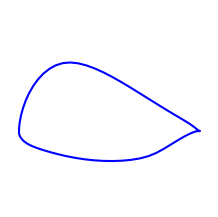

airfoils_img/e328.png
data_airfoils/e329.txt


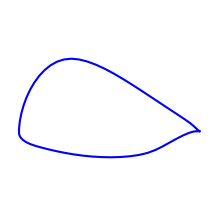

airfoils_img/e329.png
data_airfoils/e330.txt


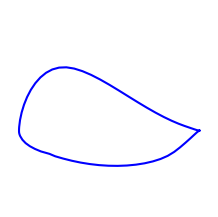

airfoils_img/e330.png
data_airfoils/e331.txt


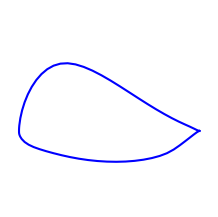

airfoils_img/e331.png
data_airfoils/e332.txt


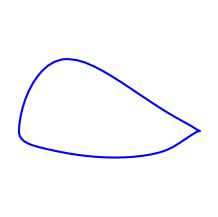

airfoils_img/e332.png
data_airfoils/e333.txt


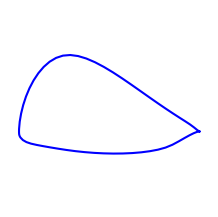

airfoils_img/e333.png
data_airfoils/e334.txt


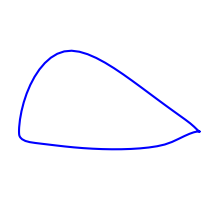

airfoils_img/e334.png
data_airfoils/e335.txt


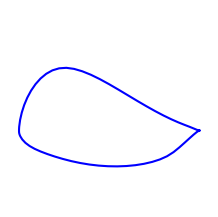

airfoils_img/e335.png
data_airfoils/e336.txt


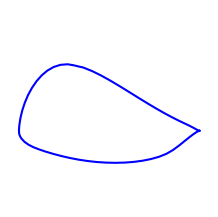

airfoils_img/e336.png
data_airfoils/e337.txt


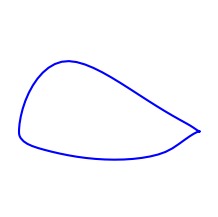

airfoils_img/e337.png
data_airfoils/e338.txt


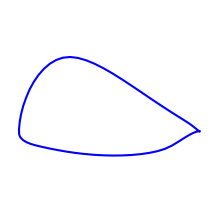

airfoils_img/e338.png
data_airfoils/e339.txt


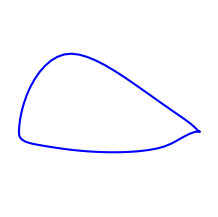

airfoils_img/e339.png
data_airfoils/e340.txt


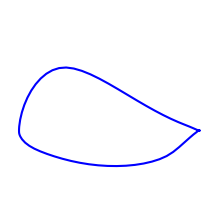

airfoils_img/e340.png
data_airfoils/e341.txt


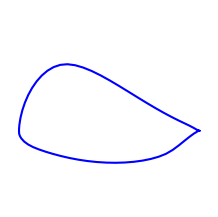

airfoils_img/e341.png
data_airfoils/e342.txt


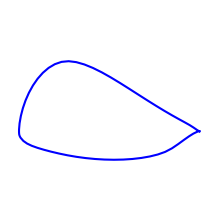

airfoils_img/e342.png
data_airfoils/e343.txt


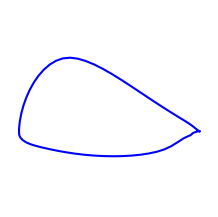

airfoils_img/e343.png
data_airfoils/e344.txt


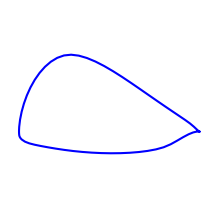

airfoils_img/e344.png
data_airfoils/e360.txt


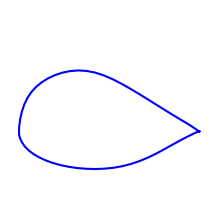

airfoils_img/e360.png
data_airfoils/e361.txt


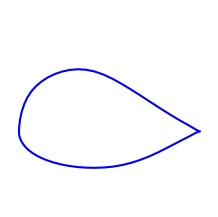

airfoils_img/e361.png
data_airfoils/e374.txt


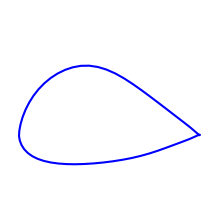

airfoils_img/e374.png
data_airfoils/e376.txt


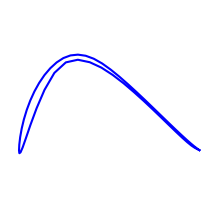

airfoils_img/e376.png
data_airfoils/e377.txt


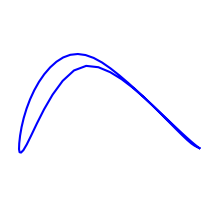

airfoils_img/e377.png
data_airfoils/e377m.txt


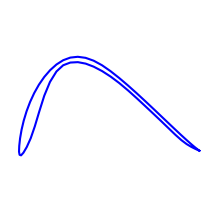

airfoils_img/e377m.png
data_airfoils/e378.txt


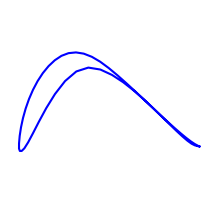

airfoils_img/e378.png
data_airfoils/e379.txt


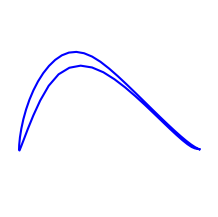

airfoils_img/e379.png
data_airfoils/e385.txt


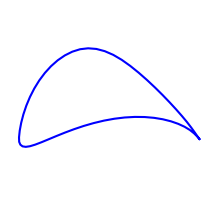

airfoils_img/e385.png
data_airfoils/e387.txt


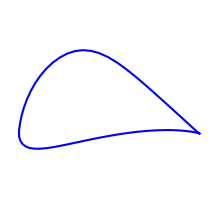

airfoils_img/e387.png
data_airfoils/e392.txt


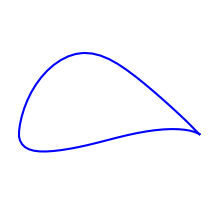

airfoils_img/e392.png
data_airfoils/e393.txt


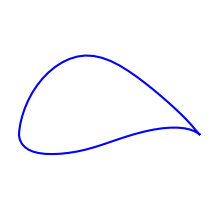

airfoils_img/e393.png
data_airfoils/e395.txt


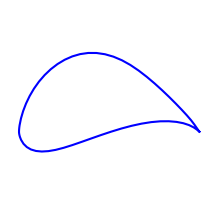

airfoils_img/e395.png
data_airfoils/e396.txt


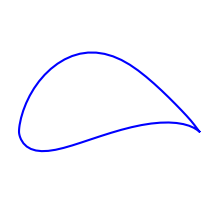

airfoils_img/e396.png
data_airfoils/e397.txt


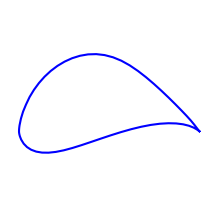

airfoils_img/e397.png
data_airfoils/e398.txt


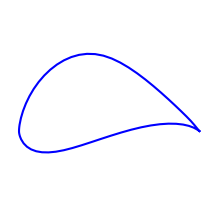

airfoils_img/e398.png
data_airfoils/e399.txt


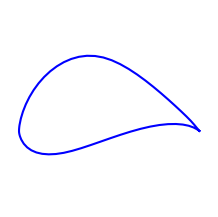

airfoils_img/e399.png
data_airfoils/e403.txt


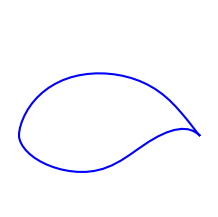

airfoils_img/e403.png
data_airfoils/e407.txt


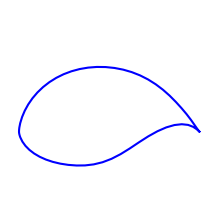

airfoils_img/e407.png
data_airfoils/e417.txt


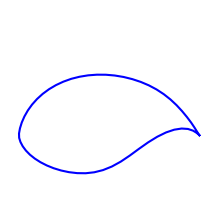

airfoils_img/e417.png
data_airfoils/e420.txt


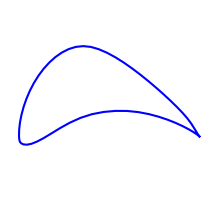

airfoils_img/e420.png
data_airfoils/e421.txt


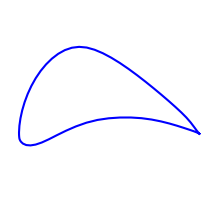

airfoils_img/e421.png
data_airfoils/e422.txt


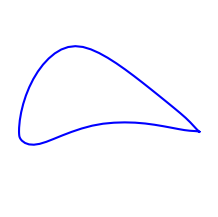

airfoils_img/e422.png
data_airfoils/e423.txt


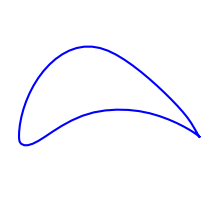

airfoils_img/e423.png
data_airfoils/e426.txt


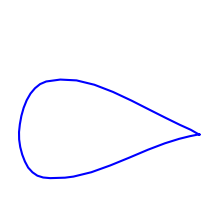

airfoils_img/e426.png
data_airfoils/e428.txt


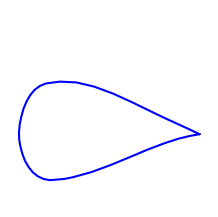

airfoils_img/e428.png
data_airfoils/e431.txt


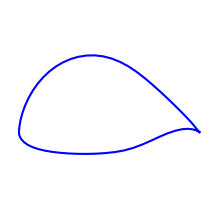

airfoils_img/e431.png
data_airfoils/e432.txt


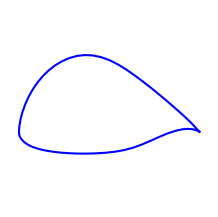

airfoils_img/e432.png
data_airfoils/e433.txt


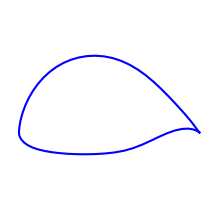

airfoils_img/e433.png
data_airfoils/e434.txt


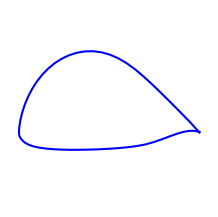

airfoils_img/e434.png
data_airfoils/e435.txt


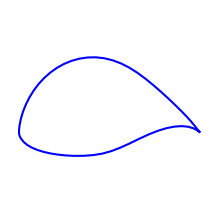

airfoils_img/e435.png
data_airfoils/e471.txt


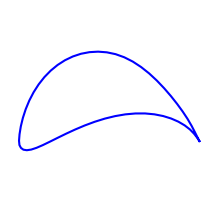

airfoils_img/e471.png
data_airfoils/e472.txt


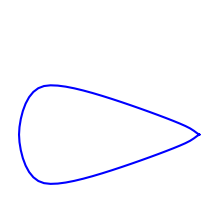

airfoils_img/e472.png
data_airfoils/e473.txt


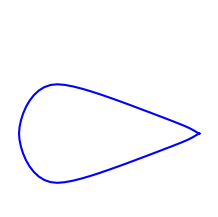

airfoils_img/e473.png
data_airfoils/e474.txt


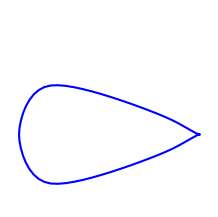

airfoils_img/e474.png
data_airfoils/e475.txt


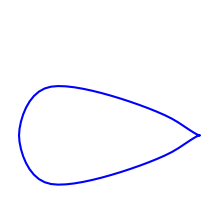

airfoils_img/e475.png
data_airfoils/e476.txt


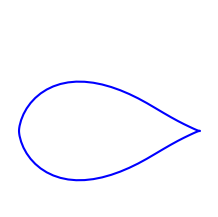

airfoils_img/e476.png
data_airfoils/e477.txt


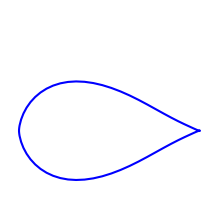

airfoils_img/e477.png
data_airfoils/e478.txt


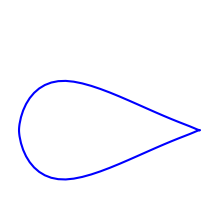

airfoils_img/e478.png
data_airfoils/e479.txt


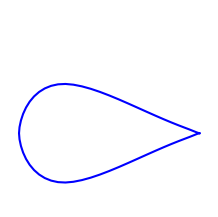

airfoils_img/e479.png
data_airfoils/e485.txt


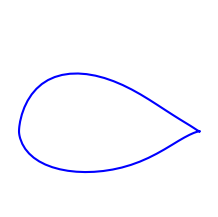

airfoils_img/e485.png
data_airfoils/e49.txt


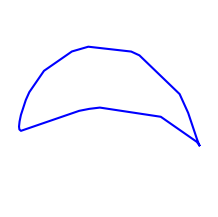

airfoils_img/e49.png
data_airfoils/e502.txt


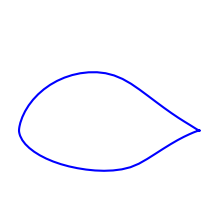

airfoils_img/e502.png
data_airfoils/e520.txt


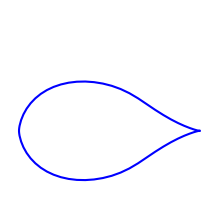

airfoils_img/e520.png
data_airfoils/e521.txt


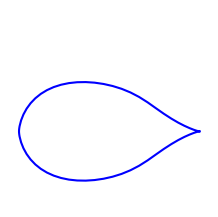

airfoils_img/e521.png
data_airfoils/e540.txt


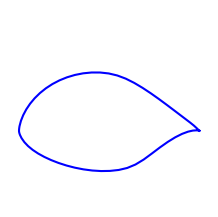

airfoils_img/e540.png
data_airfoils/e541.txt


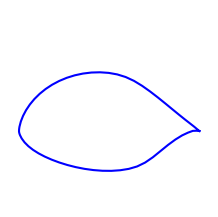

airfoils_img/e541.png
data_airfoils/e542.txt


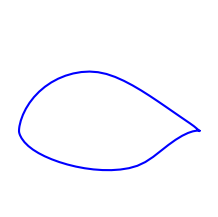

airfoils_img/e542.png
data_airfoils/e543.txt


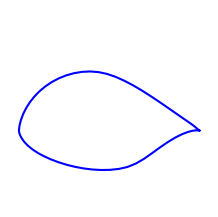

airfoils_img/e543.png
data_airfoils/e544.txt


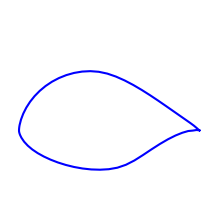

airfoils_img/e544.png
data_airfoils/e545.txt


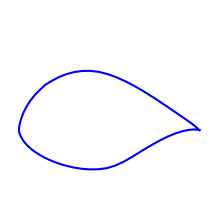

airfoils_img/e545.png
data_airfoils/e546.txt


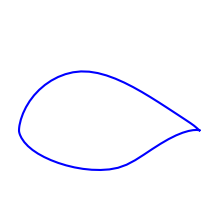

airfoils_img/e546.png
data_airfoils/e547.txt


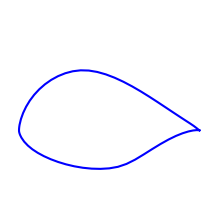

airfoils_img/e547.png
data_airfoils/e548.txt


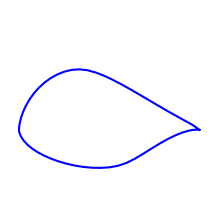

airfoils_img/e548.png
data_airfoils/e549.txt


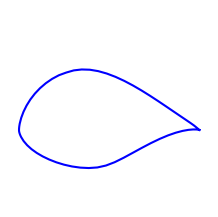

airfoils_img/e549.png
data_airfoils/e550.txt


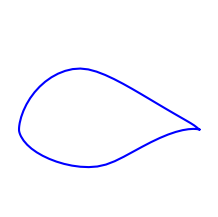

airfoils_img/e550.png
data_airfoils/e551.txt


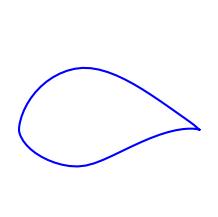

airfoils_img/e551.png
data_airfoils/e552.txt


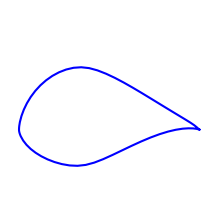

airfoils_img/e552.png
data_airfoils/e553.txt


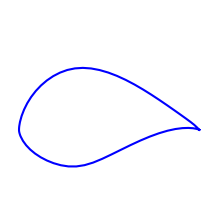

airfoils_img/e553.png
data_airfoils/e554.txt


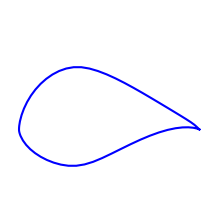

airfoils_img/e554.png
data_airfoils/e555.txt


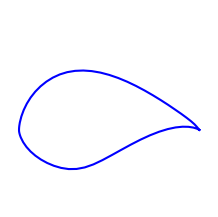

airfoils_img/e555.png
data_airfoils/e556.txt


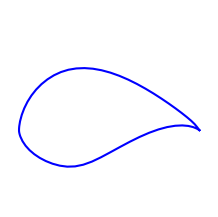

airfoils_img/e556.png
data_airfoils/e557.txt


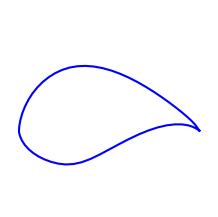

airfoils_img/e557.png
data_airfoils/e558.txt


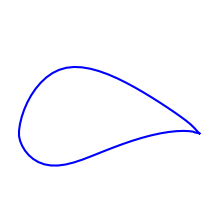

airfoils_img/e558.png
data_airfoils/e559.txt


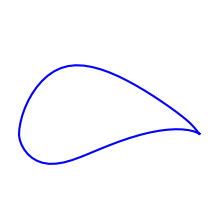

airfoils_img/e559.png
data_airfoils/e560.txt


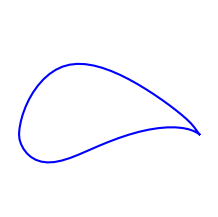

airfoils_img/e560.png
data_airfoils/e561.txt


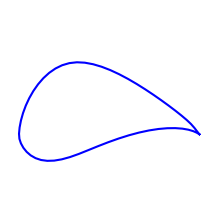

airfoils_img/e561.png
data_airfoils/e562.txt


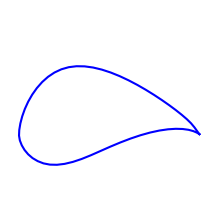

airfoils_img/e562.png
data_airfoils/e58.txt


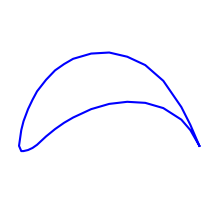

airfoils_img/e58.png
data_airfoils/e580.txt


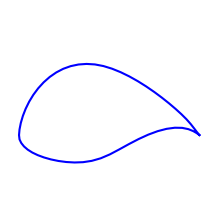

airfoils_img/e580.png
data_airfoils/e582.txt


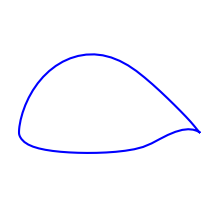

airfoils_img/e582.png
data_airfoils/e583.txt


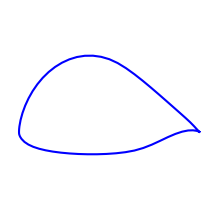

airfoils_img/e583.png
data_airfoils/e584.txt


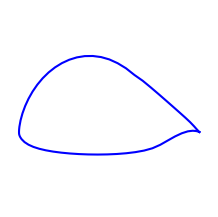

airfoils_img/e584.png
data_airfoils/e585.txt


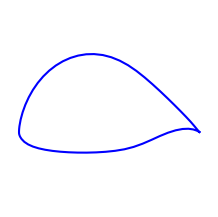

airfoils_img/e585.png
data_airfoils/e587.txt


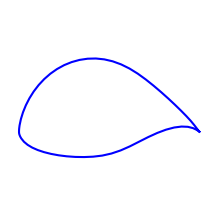

airfoils_img/e587.png
data_airfoils/e59.txt


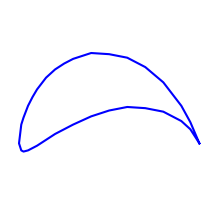

airfoils_img/e59.png
data_airfoils/e591.txt


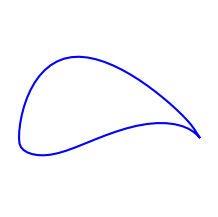

airfoils_img/e591.png
data_airfoils/e593.txt


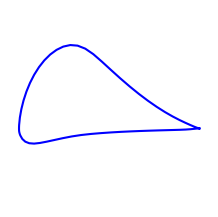

airfoils_img/e593.png
data_airfoils/e598.txt


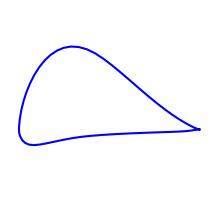

airfoils_img/e598.png
data_airfoils/e603.txt


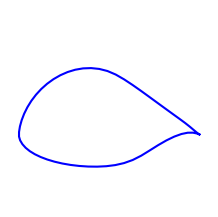

airfoils_img/e603.png
data_airfoils/e604.txt


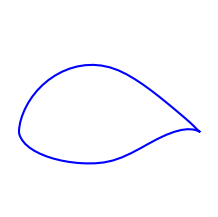

airfoils_img/e604.png
data_airfoils/e61.txt


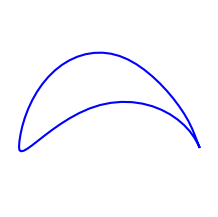

airfoils_img/e61.png
data_airfoils/e62.txt


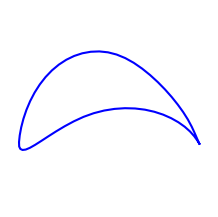

airfoils_img/e62.png
data_airfoils/e625.txt


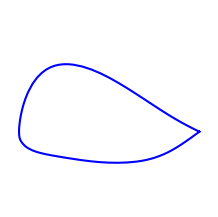

airfoils_img/e625.png
data_airfoils/e63.txt


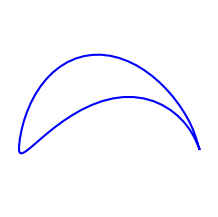

airfoils_img/e63.png
data_airfoils/e635.txt


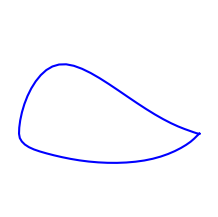

airfoils_img/e635.png
data_airfoils/e636.txt


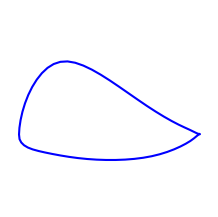

airfoils_img/e636.png
data_airfoils/e637.txt


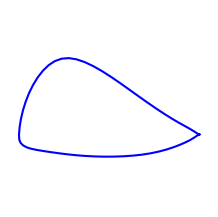

airfoils_img/e637.png
data_airfoils/e638.txt


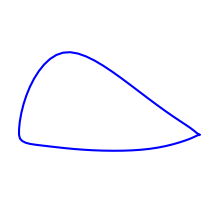

airfoils_img/e638.png
data_airfoils/e639.txt


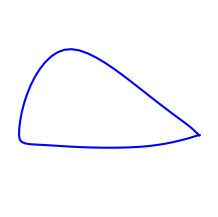

airfoils_img/e639.png
data_airfoils/e64.txt


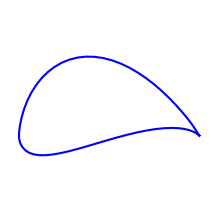

airfoils_img/e64.png
data_airfoils/e642.txt


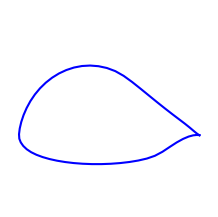

airfoils_img/e642.png
data_airfoils/e654.txt


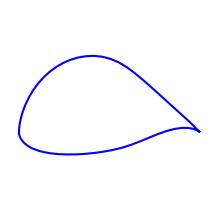

airfoils_img/e654.png
data_airfoils/e655.txt


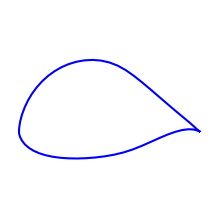

airfoils_img/e655.png
data_airfoils/e656.txt


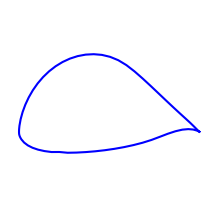

airfoils_img/e656.png
data_airfoils/e657.txt


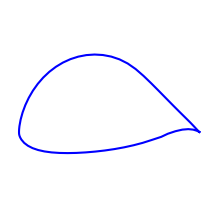

airfoils_img/e657.png
data_airfoils/e66.txt


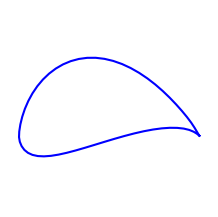

airfoils_img/e66.png
data_airfoils/e662.txt


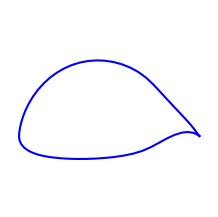

airfoils_img/e662.png
data_airfoils/e664.txt


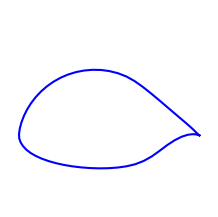

airfoils_img/e664.png
data_airfoils/e664ex.txt


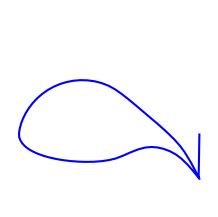

airfoils_img/e664ex.png
data_airfoils/e668.txt


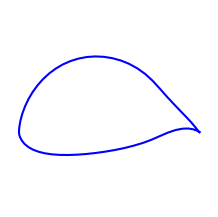

airfoils_img/e668.png
data_airfoils/e67.txt


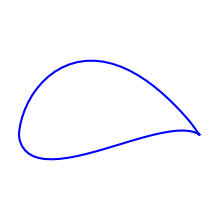

airfoils_img/e67.png
data_airfoils/e678.txt


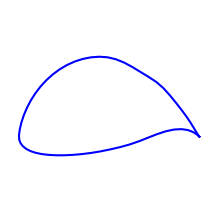

airfoils_img/e678.png
data_airfoils/e68.txt


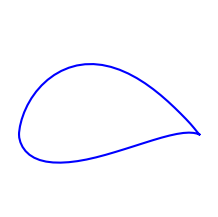

airfoils_img/e68.png
data_airfoils/e682.txt


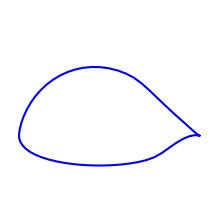

airfoils_img/e682.png
data_airfoils/e694.txt


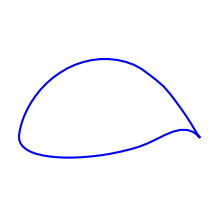

airfoils_img/e694.png
data_airfoils/e71.txt


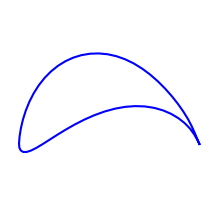

airfoils_img/e71.png
data_airfoils/e715.txt


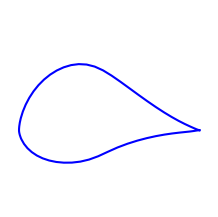

airfoils_img/e715.png
data_airfoils/e748.txt


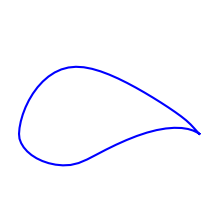

airfoils_img/e748.png
data_airfoils/e793.txt


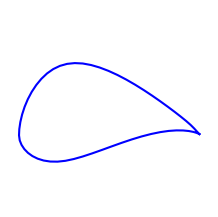

airfoils_img/e793.png
data_airfoils/e817.txt


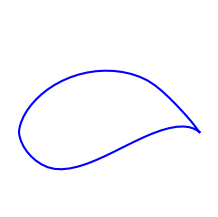

airfoils_img/e817.png
data_airfoils/e818.txt


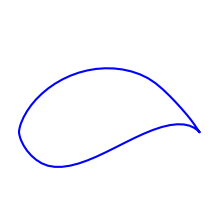

airfoils_img/e818.png
data_airfoils/e836.txt


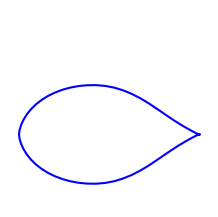

airfoils_img/e836.png
data_airfoils/e837.txt


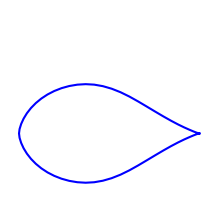

airfoils_img/e837.png
data_airfoils/e838.txt


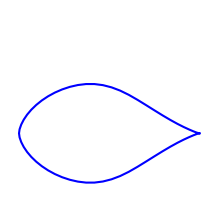

airfoils_img/e838.png
data_airfoils/e850.txt


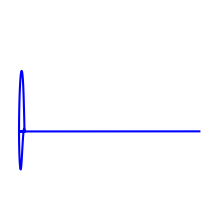

airfoils_img/e850.png
data_airfoils/e851.txt


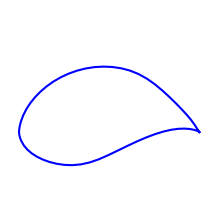

airfoils_img/e851.png
data_airfoils/e852.txt


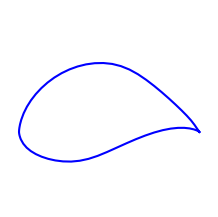

airfoils_img/e852.png
data_airfoils/e853.txt


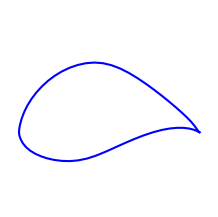

airfoils_img/e853.png
data_airfoils/e854.txt


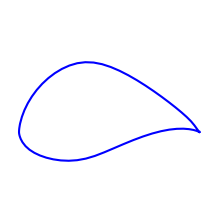

airfoils_img/e854.png
data_airfoils/e855.txt


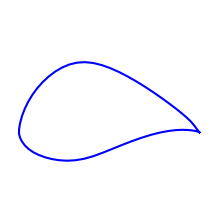

airfoils_img/e855.png
data_airfoils/e856.txt


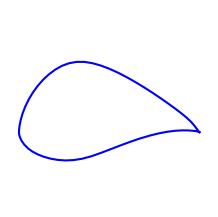

airfoils_img/e856.png
data_airfoils/e857.txt


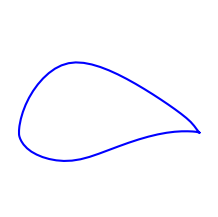

airfoils_img/e857.png
data_airfoils/e858.txt


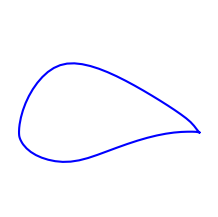

airfoils_img/e858.png
data_airfoils/e862.txt


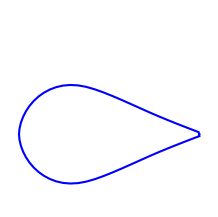

airfoils_img/e862.png
data_airfoils/e863.txt


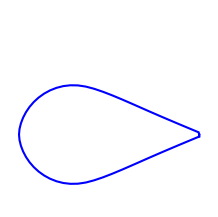

airfoils_img/e863.png
data_airfoils/e864.txt


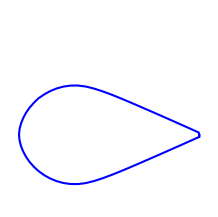

airfoils_img/e864.png
data_airfoils/e874.txt


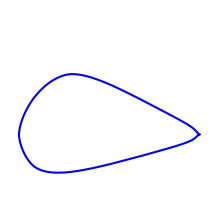

airfoils_img/e874.png
data_airfoils/e904.txt


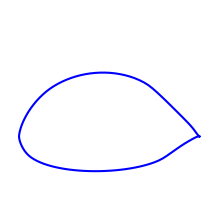

airfoils_img/e904.png
data_airfoils/e908.txt


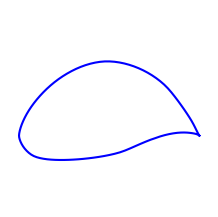

airfoils_img/e908.png
data_airfoils/ea61009.txt


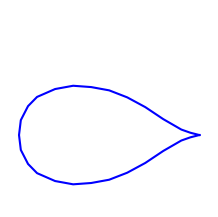

airfoils_img/ea61009.png
data_airfoils/ea61012.txt


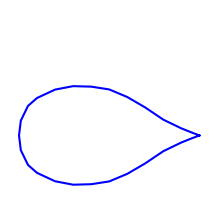

airfoils_img/ea61012.png
data_airfoils/ea81006.txt


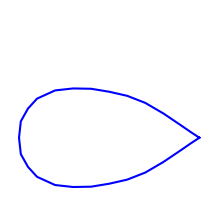

airfoils_img/ea81006.png
data_airfoils/ebambino7.txt


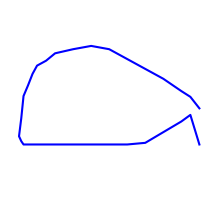

airfoils_img/ebambino7.png
data_airfoils/ec863914.txt


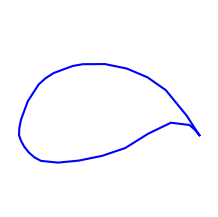

airfoils_img/ec863914.png
data_airfoils/eh0009.txt


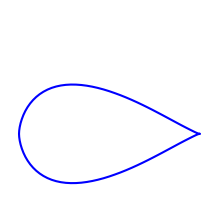

airfoils_img/eh0009.png
data_airfoils/eh1070.txt


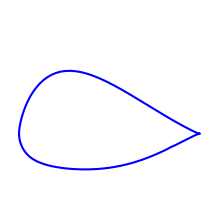

airfoils_img/eh1070.png
data_airfoils/eh1090.txt


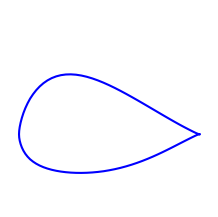

airfoils_img/eh1090.png
data_airfoils/eh1590.txt


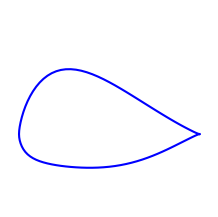

airfoils_img/eh1590.png
data_airfoils/eh2010.txt


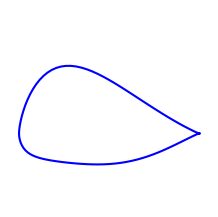

airfoils_img/eh2010.png
data_airfoils/eh2012.txt


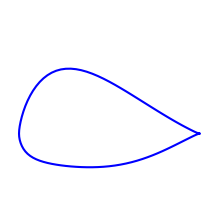

airfoils_img/eh2012.png
data_airfoils/eh2070.txt


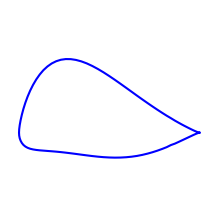

airfoils_img/eh2070.png
data_airfoils/eh2510.txt


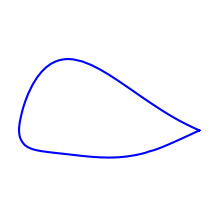

airfoils_img/eh2510.png
data_airfoils/eh3012.txt


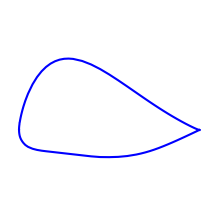

airfoils_img/eh3012.png
data_airfoils/eiffel10.txt


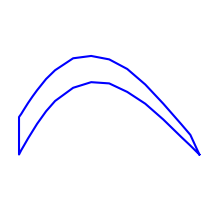

airfoils_img/eiffel10.png
data_airfoils/eiffel371.txt


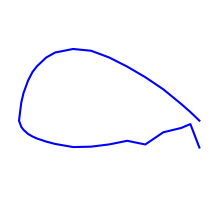

airfoils_img/eiffel371.png
data_airfoils/eiffel385.txt


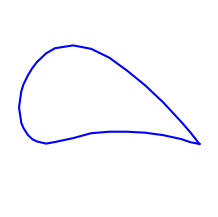

airfoils_img/eiffel385.png
data_airfoils/eiffel428.txt


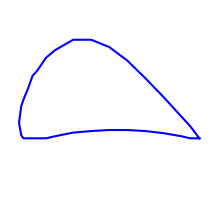

airfoils_img/eiffel428.png
data_airfoils/eiffel430.txt


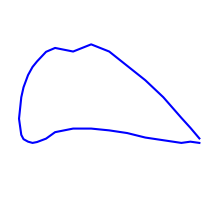

airfoils_img/eiffel430.png
data_airfoils/esa40.txt


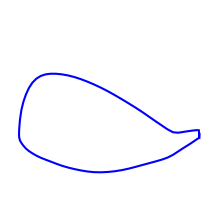

airfoils_img/esa40.png
data_airfoils/falcon.txt


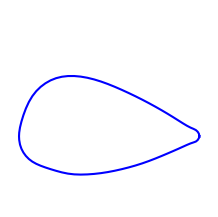

airfoils_img/falcon.png
data_airfoils/fauvel.txt


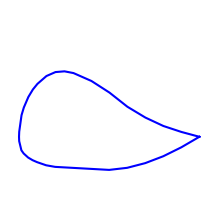

airfoils_img/fauvel.png
data_airfoils/fg1.txt


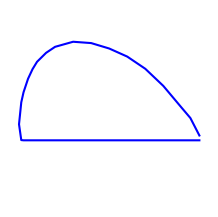

airfoils_img/fg1.png
data_airfoils/fg2.txt


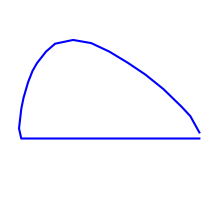

airfoils_img/fg2.png
data_airfoils/fg3.txt


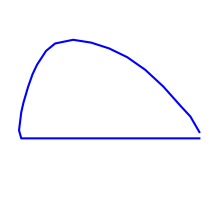

airfoils_img/fg3.png
data_airfoils/fg4.txt


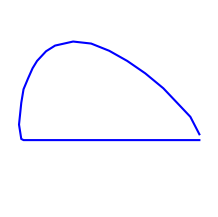

airfoils_img/fg4.png
data_airfoils/fx049915.txt


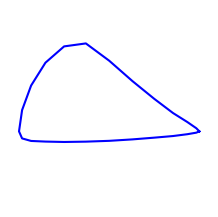

airfoils_img/fx049915.png
data_airfoils/fx05188.txt


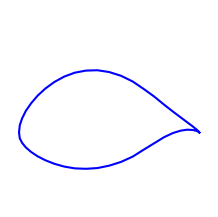

airfoils_img/fx05188.png
data_airfoils/fx05191.txt


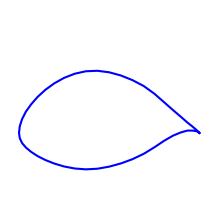

airfoils_img/fx05191.png
data_airfoils/fx057816.txt


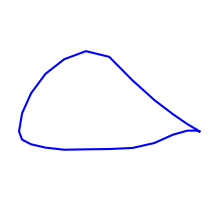

airfoils_img/fx057816.png
data_airfoils/fx05h126.txt


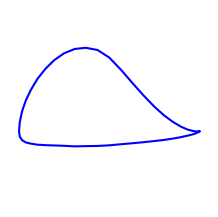

airfoils_img/fx05h126.png
data_airfoils/fx082512.txt


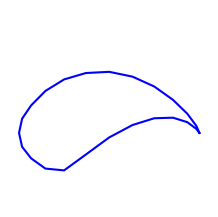

airfoils_img/fx082512.png
data_airfoils/fx08s176.txt


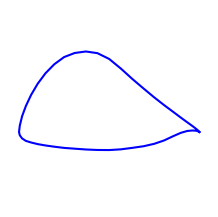

airfoils_img/fx08s176.png
data_airfoils/fx2.txt


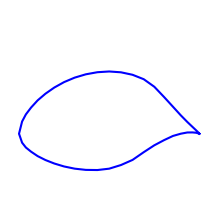

airfoils_img/fx2.png
data_airfoils/fx3.txt


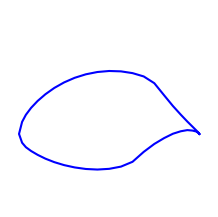

airfoils_img/fx3.png
data_airfoils/fx38153.txt


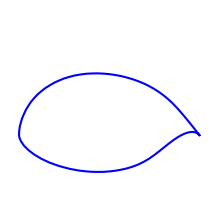

airfoils_img/fx38153.png
data_airfoils/fx60100.txt


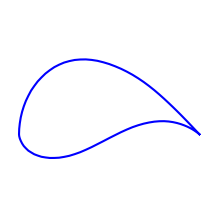

airfoils_img/fx60100.png
data_airfoils/fx601001.txt


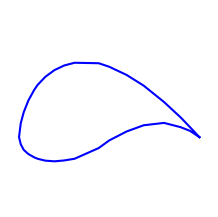

airfoils_img/fx601001.png
data_airfoils/fx60100sm.txt


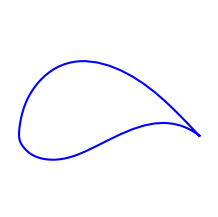

airfoils_img/fx60100sm.png
data_airfoils/fx60126.txt


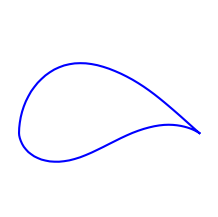

airfoils_img/fx60126.png
data_airfoils/fx601261.txt


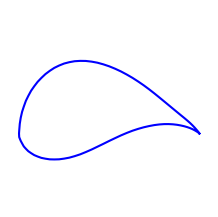

airfoils_img/fx601261.png
data_airfoils/fx60157.txt


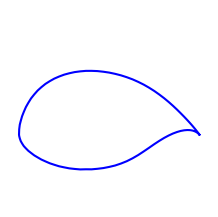

airfoils_img/fx60157.png
data_airfoils/fx60160.txt


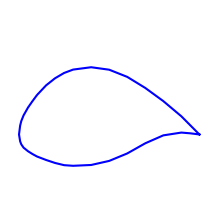

airfoils_img/fx60160.png
data_airfoils/fx60177.txt


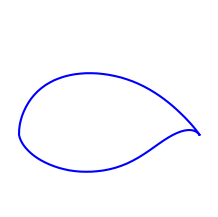

airfoils_img/fx60177.png
data_airfoils/fx61140.txt


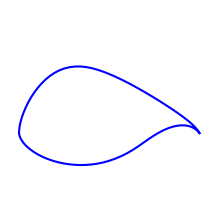

airfoils_img/fx61140.png
data_airfoils/fx61147.txt


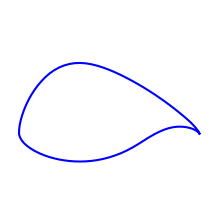

airfoils_img/fx61147.png
data_airfoils/fx61163.txt


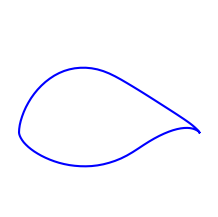

airfoils_img/fx61163.png
data_airfoils/fx61168.txt


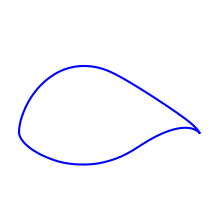

airfoils_img/fx61168.png
data_airfoils/fx61184.txt


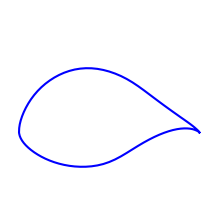

airfoils_img/fx61184.png
data_airfoils/fx62k131.txt


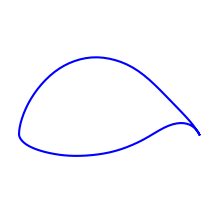

airfoils_img/fx62k131.png
data_airfoils/fx62k153.txt


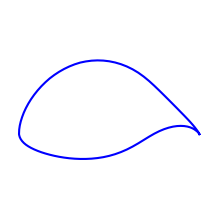

airfoils_img/fx62k153.png
data_airfoils/fx63100.txt


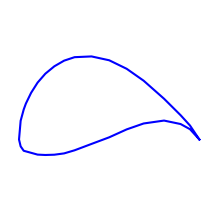

airfoils_img/fx63100.png
data_airfoils/fx63110.txt


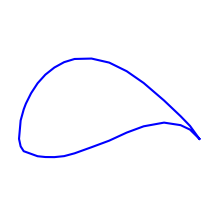

airfoils_img/fx63110.png
data_airfoils/fx63120.txt


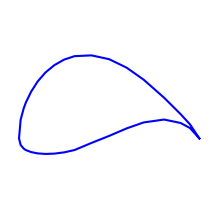

airfoils_img/fx63120.png
data_airfoils/fx63137.txt


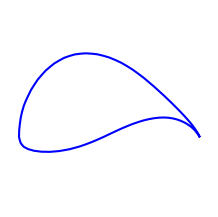

airfoils_img/fx63137.png
data_airfoils/fx63137sm.txt


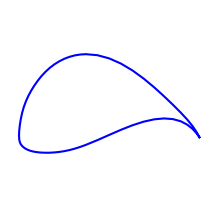

airfoils_img/fx63137sm.png
data_airfoils/fx63143.txt


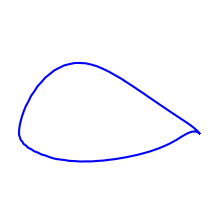

airfoils_img/fx63143.png
data_airfoils/fx63145.txt


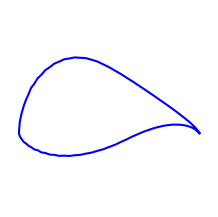

airfoils_img/fx63145.png
data_airfoils/fx63147.txt


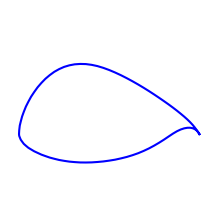

airfoils_img/fx63147.png
data_airfoils/fx63158.txt


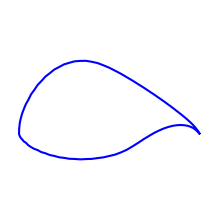

airfoils_img/fx63158.png
data_airfoils/fx6617a2.txt


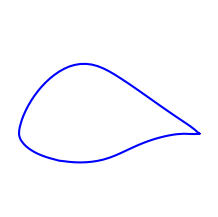

airfoils_img/fx6617a2.png
data_airfoils/fx6617ai.txt


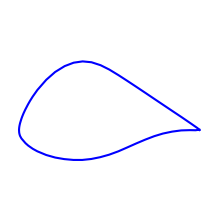

airfoils_img/fx6617ai.png
data_airfoils/fx66182.txt


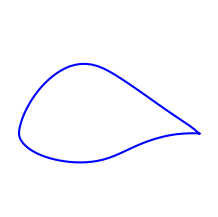

airfoils_img/fx66182.png
data_airfoils/fx66196v.txt


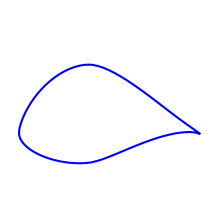

airfoils_img/fx66196v.png
data_airfoils/fx66a175.txt


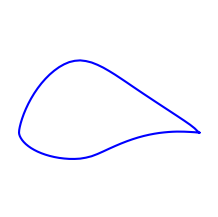

airfoils_img/fx66a175.png
data_airfoils/fx66h60.txt


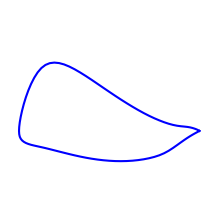

airfoils_img/fx66h60.png
data_airfoils/fx66h80.txt


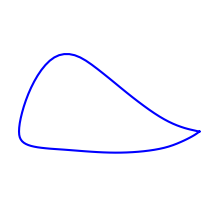

airfoils_img/fx66h80.png
data_airfoils/fx66s161.txt


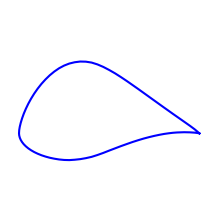

airfoils_img/fx66s161.png
data_airfoils/fx66s171.txt


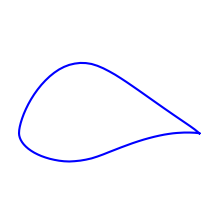

airfoils_img/fx66s171.png
data_airfoils/fx66s196.txt


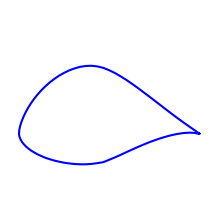

airfoils_img/fx66s196.png
data_airfoils/fx67k150.txt


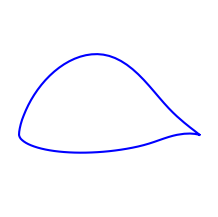

airfoils_img/fx67k150.png
data_airfoils/fx67k170.txt


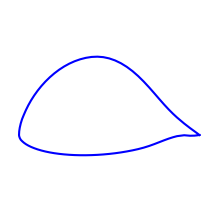

airfoils_img/fx67k170.png
data_airfoils/fx68h120.txt


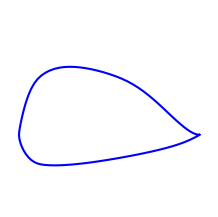

airfoils_img/fx68h120.png
data_airfoils/fx69274.txt


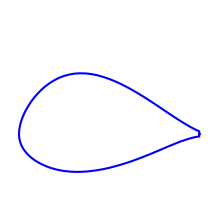

airfoils_img/fx69274.png
data_airfoils/fx69h083.txt


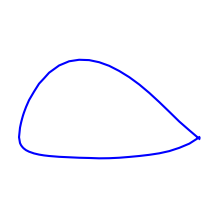

airfoils_img/fx69h083.png
data_airfoils/fx69h098.txt


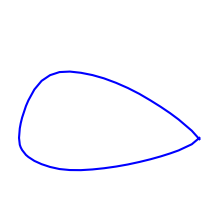

airfoils_img/fx69h098.png
data_airfoils/fx69pr281.txt


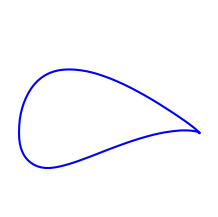

airfoils_img/fx69pr281.png
data_airfoils/fx71089a.txt


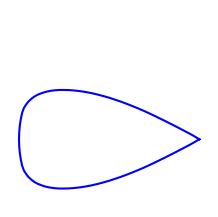

airfoils_img/fx71089a.png
data_airfoils/fx71120.txt


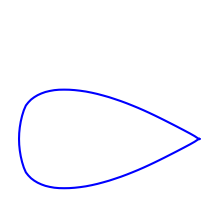

airfoils_img/fx71120.png
data_airfoils/fx711520.txt


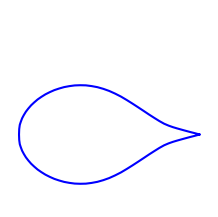

airfoils_img/fx711520.png
data_airfoils/fx711525.txt


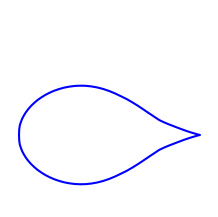

airfoils_img/fx711525.png
data_airfoils/fx711530.txt


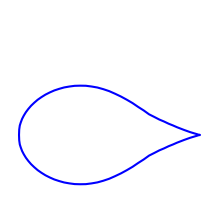

airfoils_img/fx711530.png
data_airfoils/fx71l150.txt


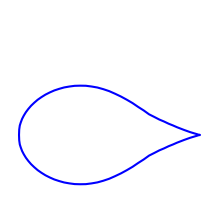

airfoils_img/fx71l150.png
data_airfoils/fx72150a.txt


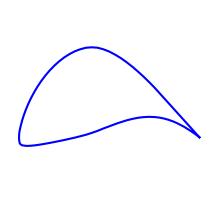

airfoils_img/fx72150a.png
data_airfoils/fx72150b.txt


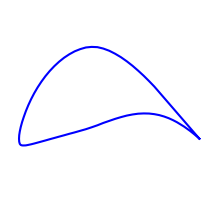

airfoils_img/fx72150b.png
data_airfoils/fx72ls160.txt


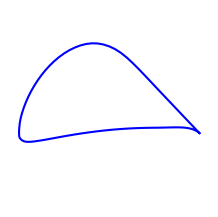

airfoils_img/fx72ls160.png
data_airfoils/fx73170.txt


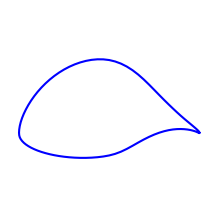

airfoils_img/fx73170.png
data_airfoils/fx73170a.txt


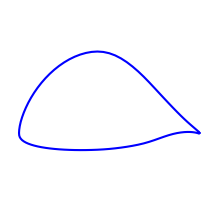

airfoils_img/fx73170a.png
data_airfoils/fx73cl1152.txt


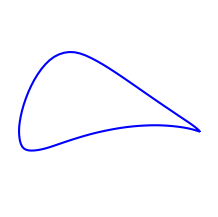

airfoils_img/fx73cl1152.png
data_airfoils/fx73cl2152.txt


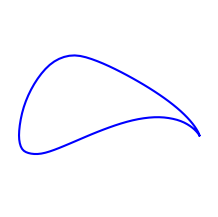

airfoils_img/fx73cl2152.png
data_airfoils/fx73cl3152.txt


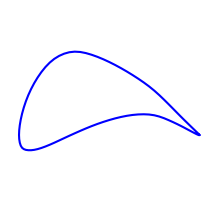

airfoils_img/fx73cl3152.png
data_airfoils/fx73k170.txt


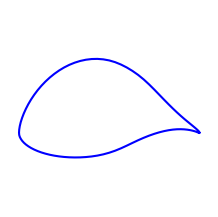

airfoils_img/fx73k170.png
data_airfoils/fx74080.txt


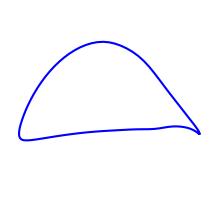

airfoils_img/fx74080.png
data_airfoils/fx74130wp1.txt


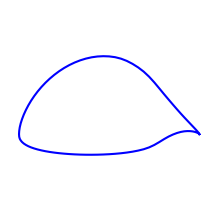

airfoils_img/fx74130wp1.png
data_airfoils/fx74130wp2.txt


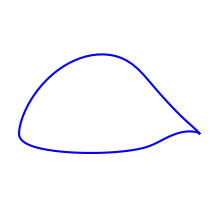

airfoils_img/fx74130wp2.png
data_airfoils/fx74130wp2mod.txt


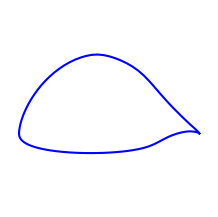

airfoils_img/fx74130wp2mod.png
data_airfoils/fx74cl5140.txt


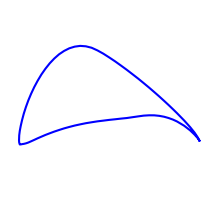

airfoils_img/fx74cl5140.png
data_airfoils/fx74cl6140.txt


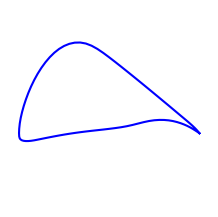

airfoils_img/fx74cl6140.png
data_airfoils/fx74modsm.txt


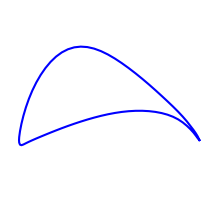

airfoils_img/fx74modsm.png
data_airfoils/fx75141.txt


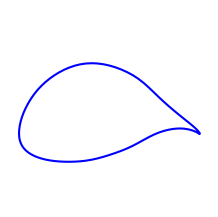

airfoils_img/fx75141.png
data_airfoils/fx75193.txt


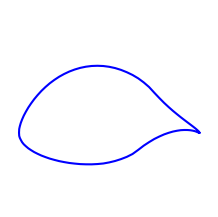

airfoils_img/fx75193.png
data_airfoils/fx75vg166.txt


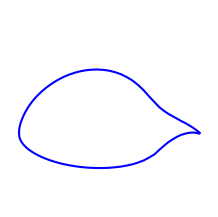

airfoils_img/fx75vg166.png
data_airfoils/fx76100.txt


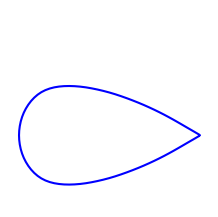

airfoils_img/fx76100.png
data_airfoils/fx76120.txt


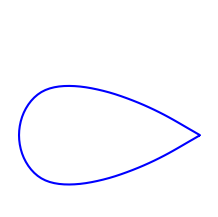

airfoils_img/fx76120.png
data_airfoils/fx76mp120.txt


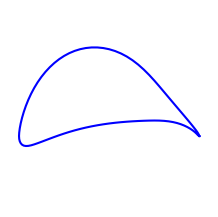

airfoils_img/fx76mp120.png
data_airfoils/fx76mp140.txt


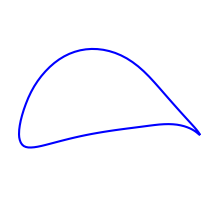

airfoils_img/fx76mp140.png
data_airfoils/fx76mp160.txt


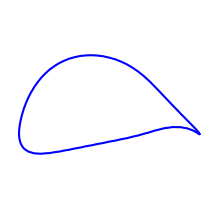

airfoils_img/fx76mp160.png
data_airfoils/fx77080.txt


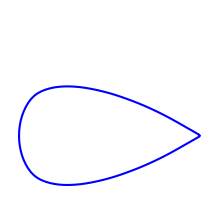

airfoils_img/fx77080.png
data_airfoils/fx77w121.txt


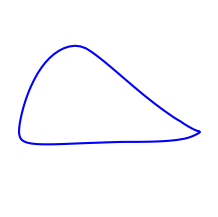

airfoils_img/fx77w121.png
data_airfoils/fx77w153.txt


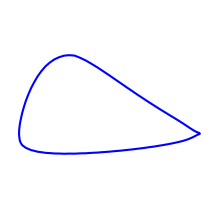

airfoils_img/fx77w153.png
data_airfoils/fx77w258.txt


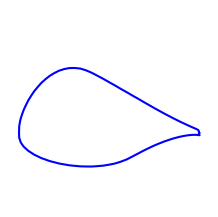

airfoils_img/fx77w258.png
data_airfoils/fx77w270.txt


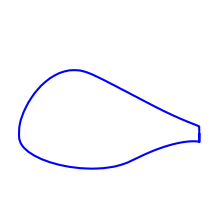

airfoils_img/fx77w270.png
data_airfoils/fx77w270s.txt


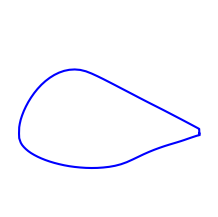

airfoils_img/fx77w270s.png
data_airfoils/fx77w343.txt


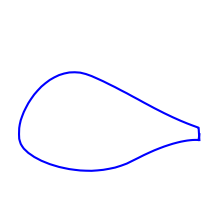

airfoils_img/fx77w343.png
data_airfoils/fx78k140.txt


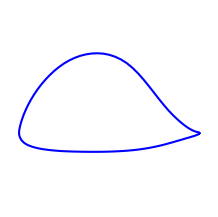

airfoils_img/fx78k140.png
data_airfoils/fx78k140a20.txt


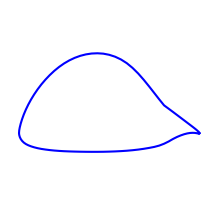

airfoils_img/fx78k140a20.png
data_airfoils/fx78k150.txt


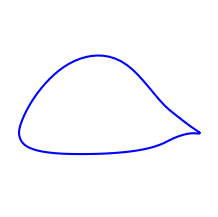

airfoils_img/fx78k150.png
data_airfoils/fx78k161.txt


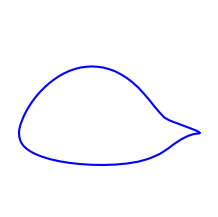

airfoils_img/fx78k161.png
data_airfoils/fx78pk188.txt


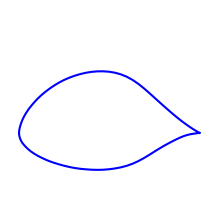

airfoils_img/fx78pk188.png
data_airfoils/fx79k144.txt


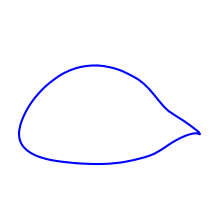

airfoils_img/fx79k144.png
data_airfoils/fx79l100.txt


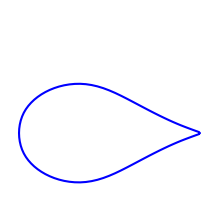

airfoils_img/fx79l100.png
data_airfoils/fx79l120.txt


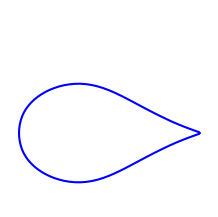

airfoils_img/fx79l120.png
data_airfoils/fx79w151a.txt


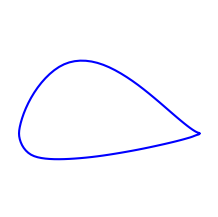

airfoils_img/fx79w151a.png
data_airfoils/fx79w470a.txt


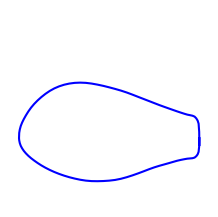

airfoils_img/fx79w470a.png
data_airfoils/fx79w660a.txt


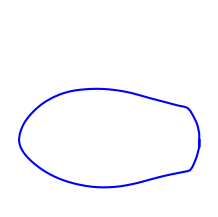

airfoils_img/fx79w660a.png
data_airfoils/fx80080.txt


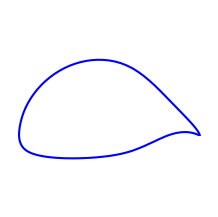

airfoils_img/fx80080.png
data_airfoils/fx83w108.txt


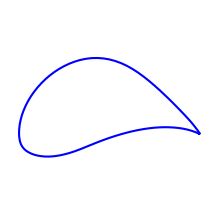

airfoils_img/fx83w108.png
data_airfoils/fx83w160.txt


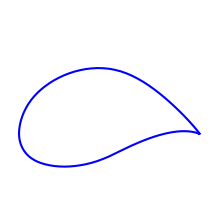

airfoils_img/fx83w160.png
data_airfoils/fx83w227.txt


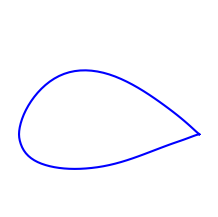

airfoils_img/fx83w227.png
data_airfoils/fx84w097.txt


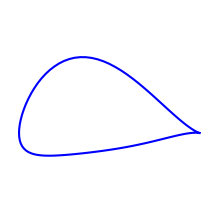

airfoils_img/fx84w097.png
data_airfoils/fx84w127.txt


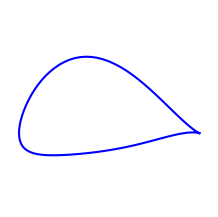

airfoils_img/fx84w127.png
data_airfoils/fx84w140.txt


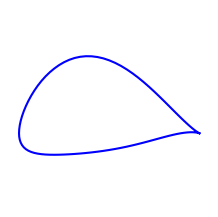

airfoils_img/fx84w140.png
data_airfoils/fx84w150.txt


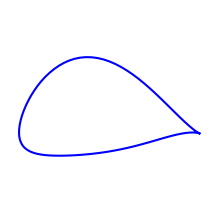

airfoils_img/fx84w150.png
data_airfoils/fx84w175.txt


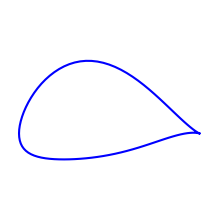

airfoils_img/fx84w175.png
data_airfoils/fx84w218.txt


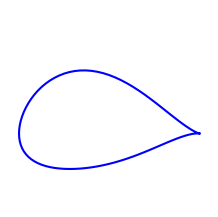

airfoils_img/fx84w218.png
data_airfoils/fxl142k.txt


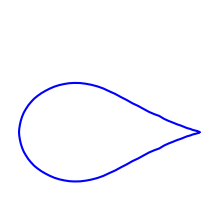

airfoils_img/fxl142k.png
data_airfoils/fxlv152.txt


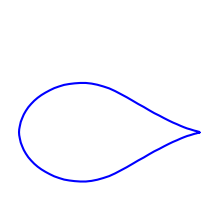

airfoils_img/fxlv152.png
data_airfoils/fxm2.txt


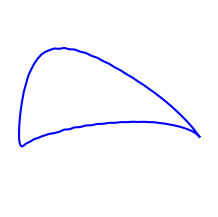

airfoils_img/fxm2.png
data_airfoils/fxs02196.txt


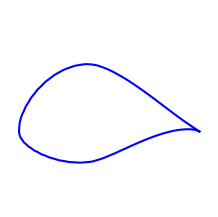

airfoils_img/fxs02196.png
data_airfoils/fxs03182.txt


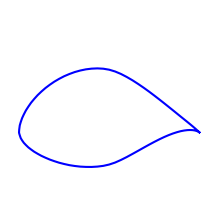

airfoils_img/fxs03182.png
data_airfoils/fxs21158.txt


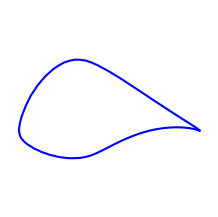

airfoils_img/fxs21158.png
data_airfoils/geminism.txt


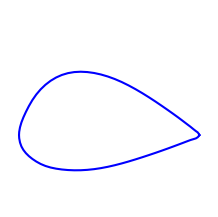

airfoils_img/geminism.png
data_airfoils/giiia.txt


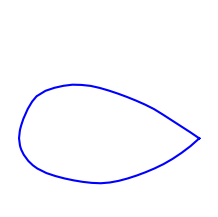

airfoils_img/giiia.png
data_airfoils/giiib.txt


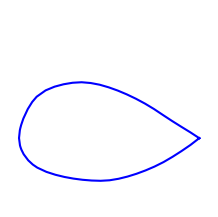

airfoils_img/giiib.png
data_airfoils/giiic.txt


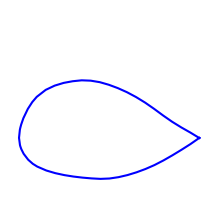

airfoils_img/giiic.png
data_airfoils/giiid.txt


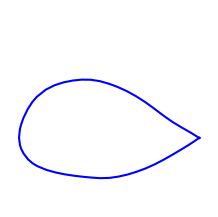

airfoils_img/giiid.png
data_airfoils/giiie.txt


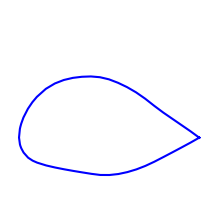

airfoils_img/giiie.png
data_airfoils/giiif.txt


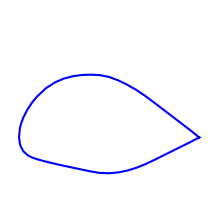

airfoils_img/giiif.png
data_airfoils/giiig.txt


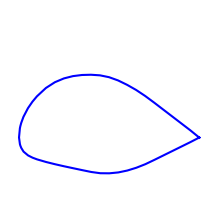

airfoils_img/giiig.png
data_airfoils/giiih.txt


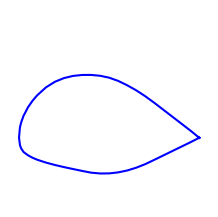

airfoils_img/giiih.png
data_airfoils/giiii.txt


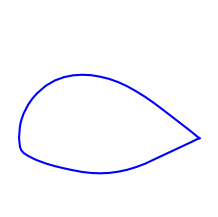

airfoils_img/giiii.png
data_airfoils/giiij.txt


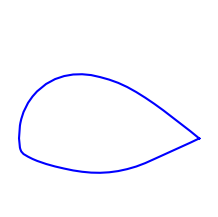

airfoils_img/giiij.png
data_airfoils/giiik.txt


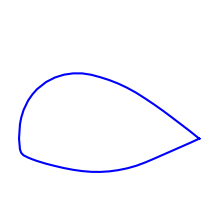

airfoils_img/giiik.png
data_airfoils/giiil.txt


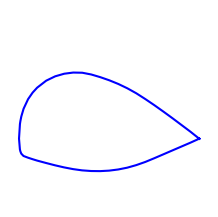

airfoils_img/giiil.png
data_airfoils/giiim.txt


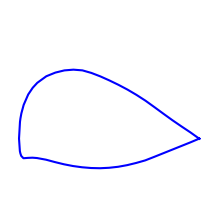

airfoils_img/giiim.png
data_airfoils/giiin.txt


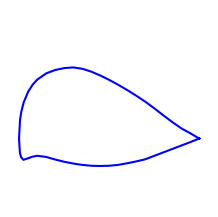

airfoils_img/giiin.png
data_airfoils/glennmartin2.txt


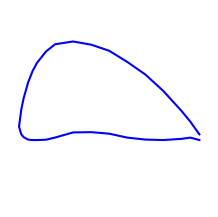

airfoils_img/glennmartin2.png
data_airfoils/glennmartin3.txt


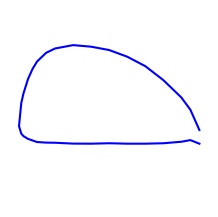

airfoils_img/glennmartin3.png
data_airfoils/glennmartin4.txt


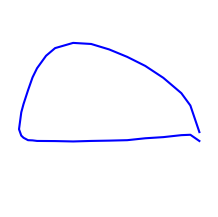

airfoils_img/glennmartin4.png
data_airfoils/gm15sm.txt


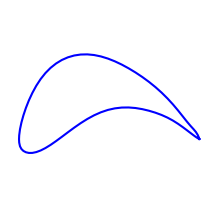

airfoils_img/gm15sm.png
data_airfoils/goe05k.txt


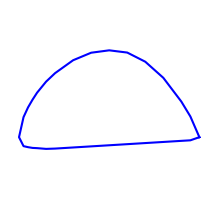

airfoils_img/goe05k.png
data_airfoils/goe06k.txt


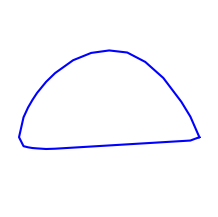

airfoils_img/goe06k.png
data_airfoils/goe07k.txt


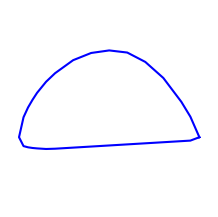

airfoils_img/goe07k.png
data_airfoils/goe08k.txt


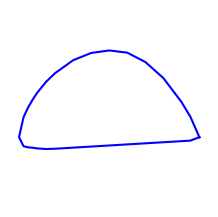

airfoils_img/goe08k.png
data_airfoils/goe09k.txt


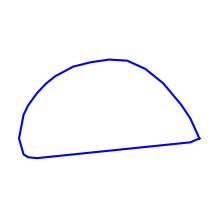

airfoils_img/goe09k.png
data_airfoils/goe100.txt


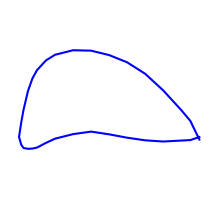

airfoils_img/goe100.png
data_airfoils/goe101.txt


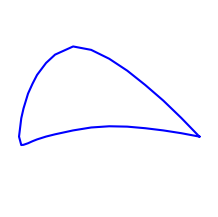

airfoils_img/goe101.png
data_airfoils/goe10k.txt


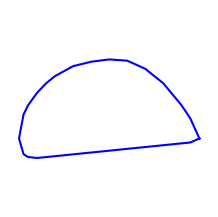

airfoils_img/goe10k.png
data_airfoils/goe113.txt


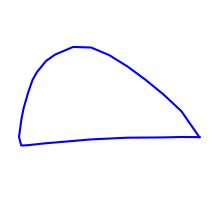

airfoils_img/goe113.png
data_airfoils/goe114.txt


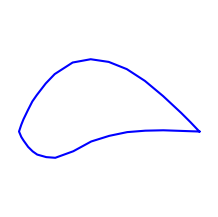

airfoils_img/goe114.png
data_airfoils/goe115.txt


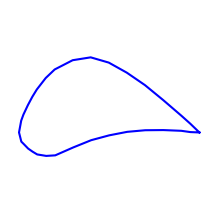

airfoils_img/goe115.png
data_airfoils/goe116.txt


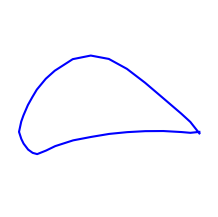

airfoils_img/goe116.png
data_airfoils/goe117.txt


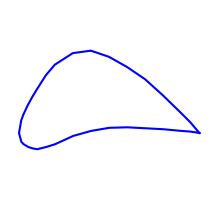

airfoils_img/goe117.png
data_airfoils/goe118.txt


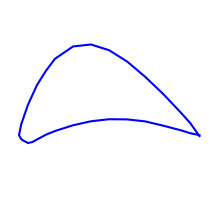

airfoils_img/goe118.png
data_airfoils/goe11k.txt


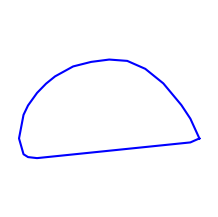

airfoils_img/goe11k.png
data_airfoils/goe121.txt


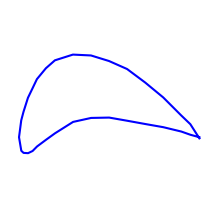

airfoils_img/goe121.png
data_airfoils/goe122.txt


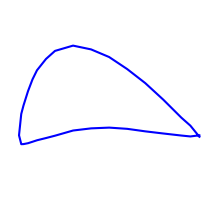

airfoils_img/goe122.png
data_airfoils/goe123.txt


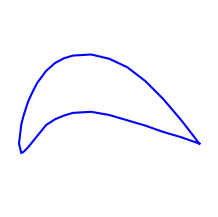

airfoils_img/goe123.png
data_airfoils/goe124.txt


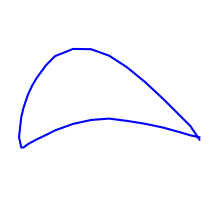

airfoils_img/goe124.png
data_airfoils/goe12k.txt


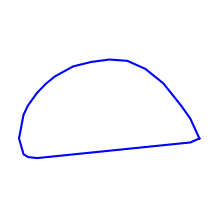

airfoils_img/goe12k.png
data_airfoils/goe133.txt


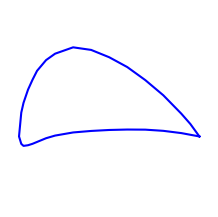

airfoils_img/goe133.png
data_airfoils/goe134.txt


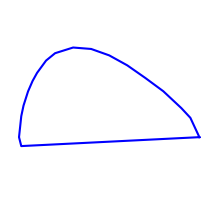

airfoils_img/goe134.png
data_airfoils/goe137.txt


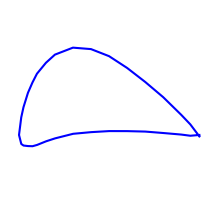

airfoils_img/goe137.png
data_airfoils/goe13k.txt


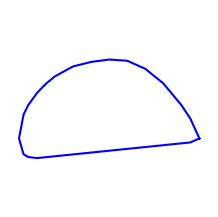

airfoils_img/goe13k.png
data_airfoils/goe14.txt


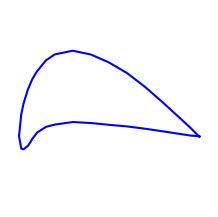

airfoils_img/goe14.png
data_airfoils/goe140.txt


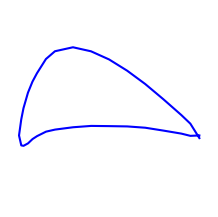

airfoils_img/goe140.png
data_airfoils/goe142.txt


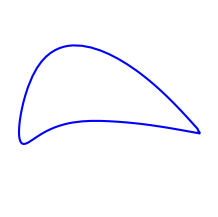

airfoils_img/goe142.png
data_airfoils/goe143.txt


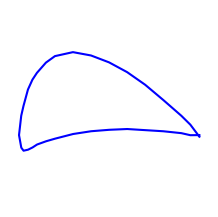

airfoils_img/goe143.png
data_airfoils/goe144.txt


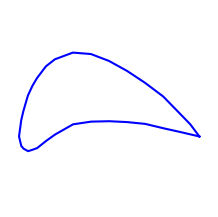

airfoils_img/goe144.png
data_airfoils/goe147.txt


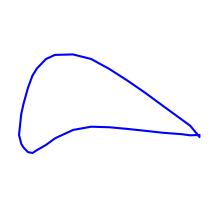

airfoils_img/goe147.png
data_airfoils/goe14k.txt


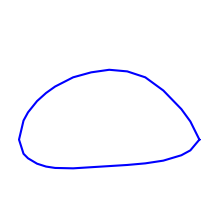

airfoils_img/goe14k.png
data_airfoils/goe15.txt


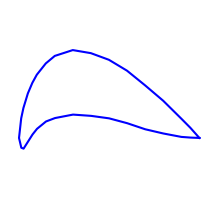

airfoils_img/goe15.png
data_airfoils/goe155.txt


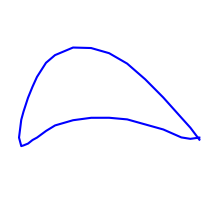

airfoils_img/goe155.png
data_airfoils/goe15k.txt


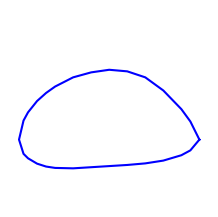

airfoils_img/goe15k.png
data_airfoils/goe164.txt


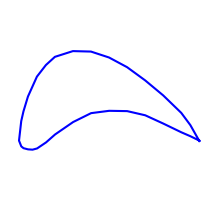

airfoils_img/goe164.png
data_airfoils/goe165.txt


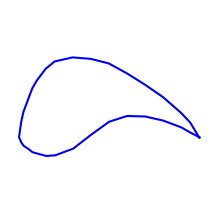

airfoils_img/goe165.png
data_airfoils/goe167.txt


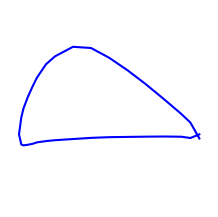

airfoils_img/goe167.png
data_airfoils/goe16k.txt


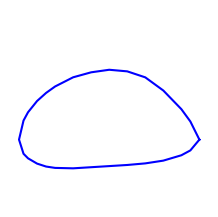

airfoils_img/goe16k.png
data_airfoils/goe173.txt


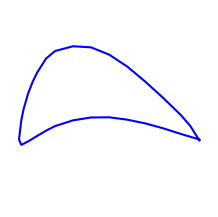

airfoils_img/goe173.png
data_airfoils/goe174.txt


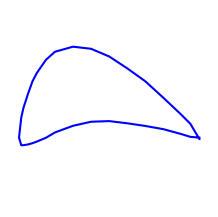

airfoils_img/goe174.png
data_airfoils/goe176.txt


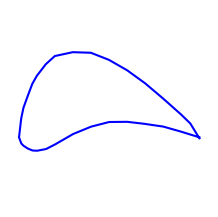

airfoils_img/goe176.png
data_airfoils/goe177.txt


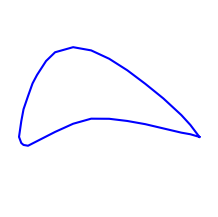

airfoils_img/goe177.png
data_airfoils/goe178.txt


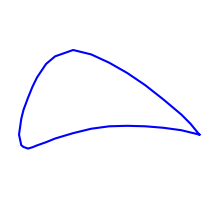

airfoils_img/goe178.png
data_airfoils/goe180.txt


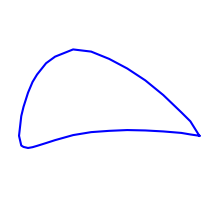

airfoils_img/goe180.png
data_airfoils/goe182.txt


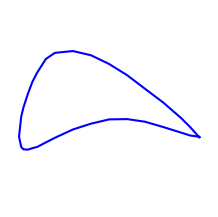

airfoils_img/goe182.png
data_airfoils/goe184.txt


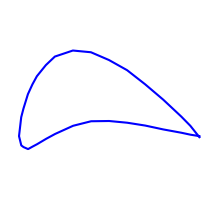

airfoils_img/goe184.png
data_airfoils/goe187.txt
data_airfoils/goe188.txt
data_airfoils/goe190.txt


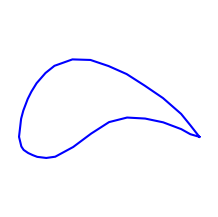

airfoils_img/goe190.png
data_airfoils/goe195.txt


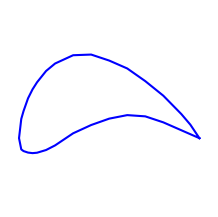

airfoils_img/goe195.png
data_airfoils/goe198.txt


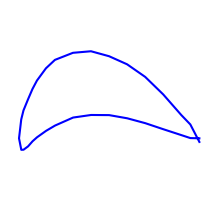

airfoils_img/goe198.png
data_airfoils/goe199.txt


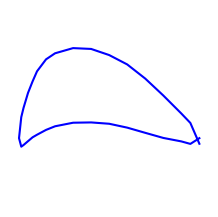

airfoils_img/goe199.png
data_airfoils/goe207.txt


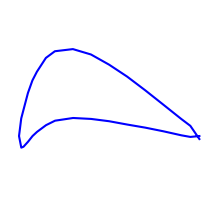

airfoils_img/goe207.png
data_airfoils/goe210.txt


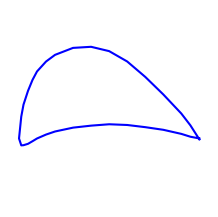

airfoils_img/goe210.png
data_airfoils/goe217.txt


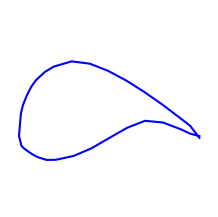

airfoils_img/goe217.png
data_airfoils/goe222.txt


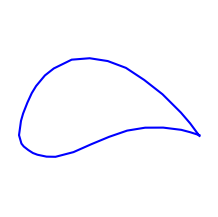

airfoils_img/goe222.png
data_airfoils/goe223.txt


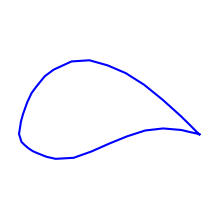

airfoils_img/goe223.png
data_airfoils/goe225.txt


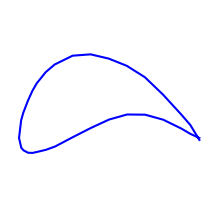

airfoils_img/goe225.png
data_airfoils/goe226.txt


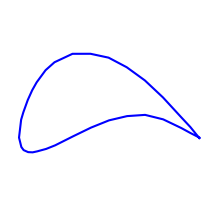

airfoils_img/goe226.png
data_airfoils/goe227.txt


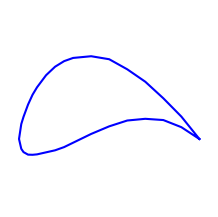

airfoils_img/goe227.png
data_airfoils/goe228.txt


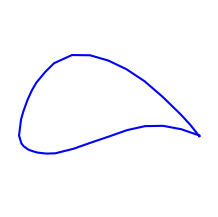

airfoils_img/goe228.png
data_airfoils/goe229.txt


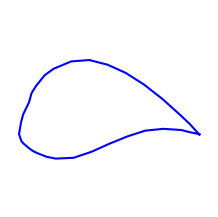

airfoils_img/goe229.png
data_airfoils/goe233.txt


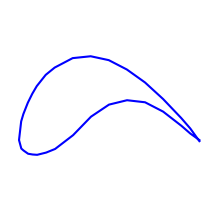

airfoils_img/goe233.png
data_airfoils/goe234.txt


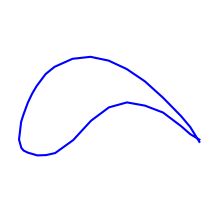

airfoils_img/goe234.png
data_airfoils/goe235.txt
data_airfoils/goe238.txt


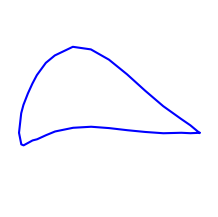

airfoils_img/goe238.png
data_airfoils/goe239.txt


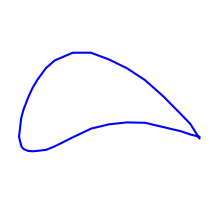

airfoils_img/goe239.png
data_airfoils/goe240.txt


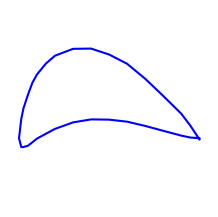

airfoils_img/goe240.png
data_airfoils/goe241.txt


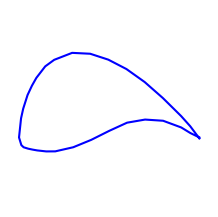

airfoils_img/goe241.png
data_airfoils/goe242.txt


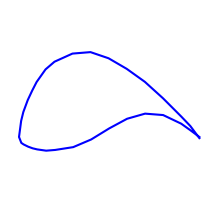

airfoils_img/goe242.png
data_airfoils/goe243.txt


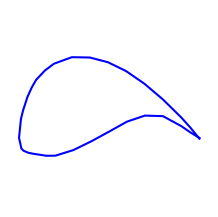

airfoils_img/goe243.png
data_airfoils/goe244.txt


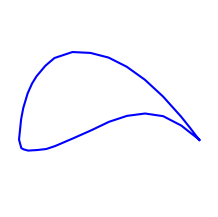

airfoils_img/goe244.png
data_airfoils/goe255.txt


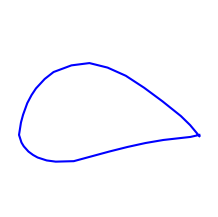

airfoils_img/goe255.png
data_airfoils/goe256.txt


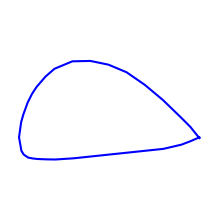

airfoils_img/goe256.png
data_airfoils/goe257.txt


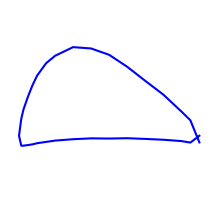

airfoils_img/goe257.png
data_airfoils/goe264.txt


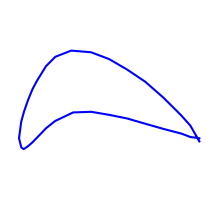

airfoils_img/goe264.png
data_airfoils/goe265.txt


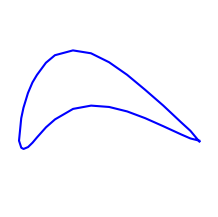

airfoils_img/goe265.png
data_airfoils/goe269.txt


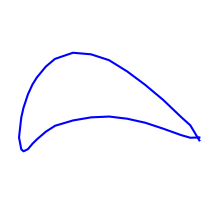

airfoils_img/goe269.png
data_airfoils/goe274.txt


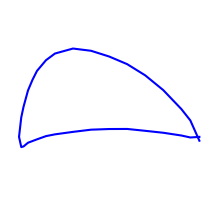

airfoils_img/goe274.png
data_airfoils/goe275.txt


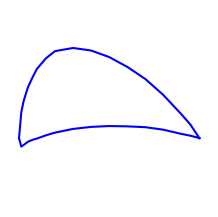

airfoils_img/goe275.png
data_airfoils/goe276.txt


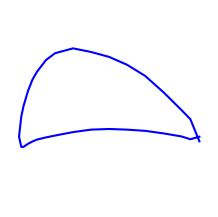

airfoils_img/goe276.png
data_airfoils/goe277.txt


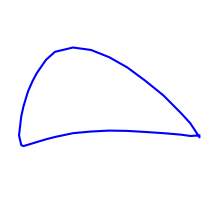

airfoils_img/goe277.png
data_airfoils/goe278.txt


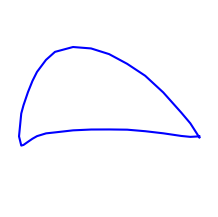

airfoils_img/goe278.png
data_airfoils/goe279.txt


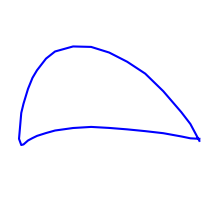

airfoils_img/goe279.png
data_airfoils/goe280.txt


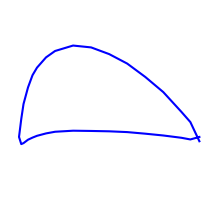

airfoils_img/goe280.png
data_airfoils/goe281.txt


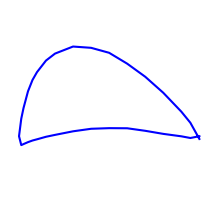

airfoils_img/goe281.png
data_airfoils/goe282.txt


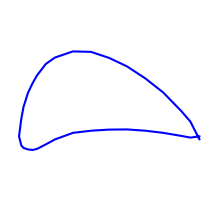

airfoils_img/goe282.png
data_airfoils/goe284.txt


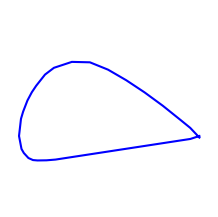

airfoils_img/goe284.png
data_airfoils/goe285.txt


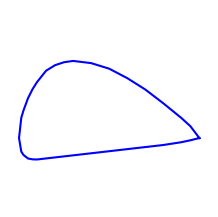

airfoils_img/goe285.png
data_airfoils/goe286.txt


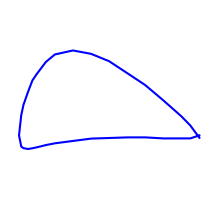

airfoils_img/goe286.png
data_airfoils/goe287.txt


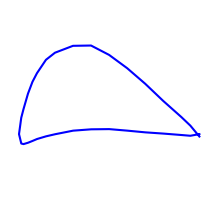

airfoils_img/goe287.png
data_airfoils/goe288.txt


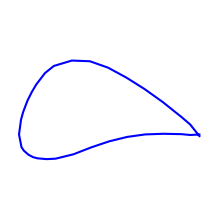

airfoils_img/goe288.png
data_airfoils/goe289.txt


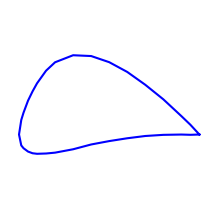

airfoils_img/goe289.png
data_airfoils/goe290.txt


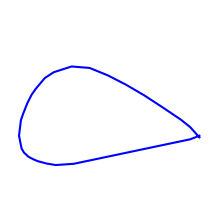

airfoils_img/goe290.png
data_airfoils/goe298.txt


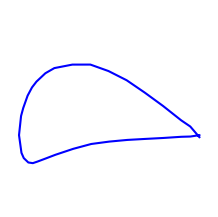

airfoils_img/goe298.png
data_airfoils/goe29b.txt


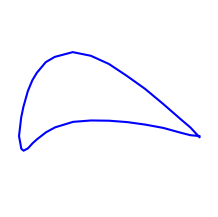

airfoils_img/goe29b.png
data_airfoils/goe300.txt


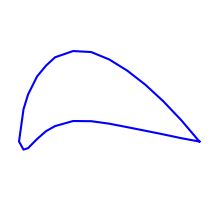

airfoils_img/goe300.png
data_airfoils/goe301.txt


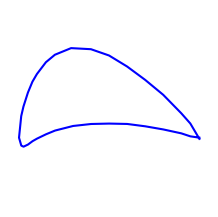

airfoils_img/goe301.png
data_airfoils/goe303.txt


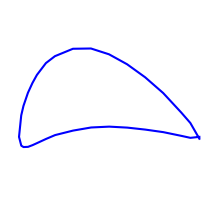

airfoils_img/goe303.png
data_airfoils/goe304.txt


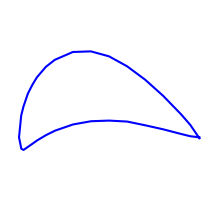

airfoils_img/goe304.png
data_airfoils/goe308.txt


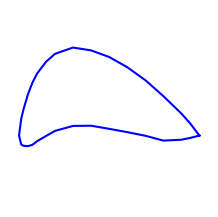

airfoils_img/goe308.png
data_airfoils/goe309.txt


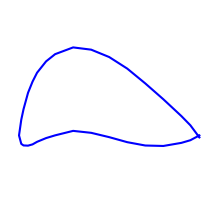

airfoils_img/goe309.png
data_airfoils/goe310.txt


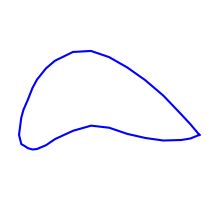

airfoils_img/goe310.png
data_airfoils/goe311.txt


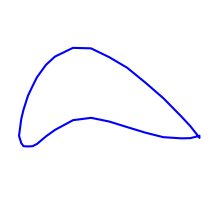

airfoils_img/goe311.png
data_airfoils/goe314.txt


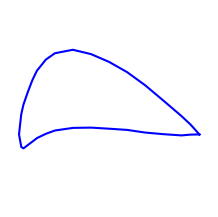

airfoils_img/goe314.png
data_airfoils/goe315.txt


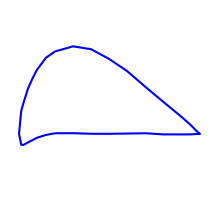

airfoils_img/goe315.png
data_airfoils/goe316.txt


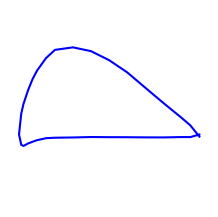

airfoils_img/goe316.png
data_airfoils/goe318.txt


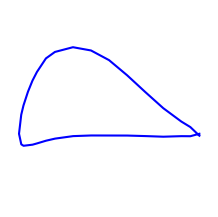

airfoils_img/goe318.png
data_airfoils/goe319.txt


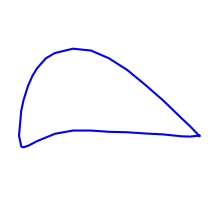

airfoils_img/goe319.png
data_airfoils/goe320.txt


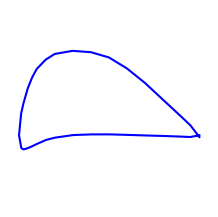

airfoils_img/goe320.png
data_airfoils/goe321.txt


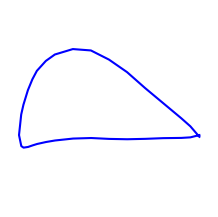

airfoils_img/goe321.png
data_airfoils/goe322.txt


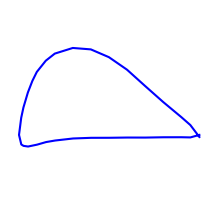

airfoils_img/goe322.png
data_airfoils/goe323.txt


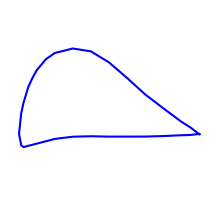

airfoils_img/goe323.png
data_airfoils/goe324.txt


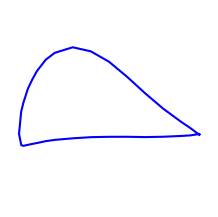

airfoils_img/goe324.png
data_airfoils/goe325.txt


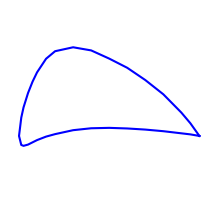

airfoils_img/goe325.png
data_airfoils/goe326.txt


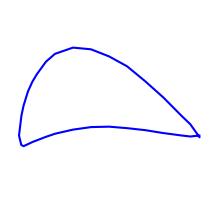

airfoils_img/goe326.png
data_airfoils/goe328.txt


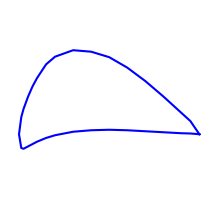

airfoils_img/goe328.png
data_airfoils/goe329.txt


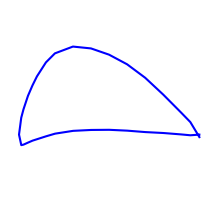

airfoils_img/goe329.png
data_airfoils/goe330.txt


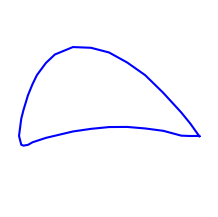

airfoils_img/goe330.png
data_airfoils/goe331.txt


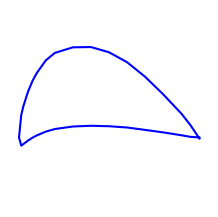

airfoils_img/goe331.png
data_airfoils/goe332.txt


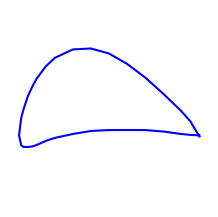

airfoils_img/goe332.png
data_airfoils/goe335.txt


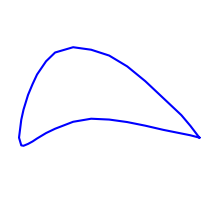

airfoils_img/goe335.png
data_airfoils/goe336.txt


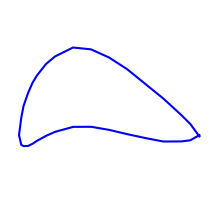

airfoils_img/goe336.png
data_airfoils/goe342.txt


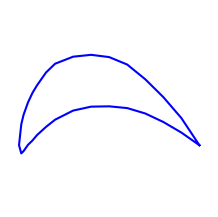

airfoils_img/goe342.png
data_airfoils/goe344.txt


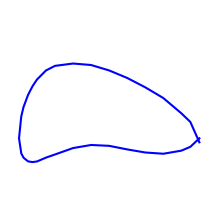

airfoils_img/goe344.png
data_airfoils/goe346.txt


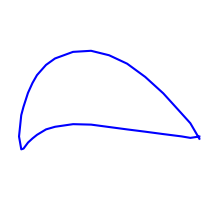

airfoils_img/goe346.png
data_airfoils/goe358.txt


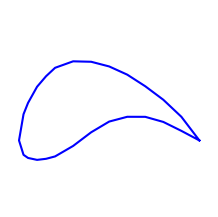

airfoils_img/goe358.png
data_airfoils/goe359.txt


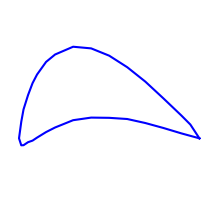

airfoils_img/goe359.png
data_airfoils/goe360.txt


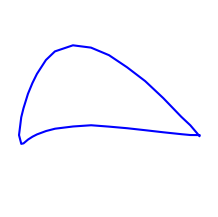

airfoils_img/goe360.png
data_airfoils/goe361.txt


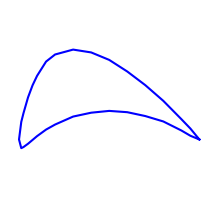

airfoils_img/goe361.png
data_airfoils/goe362.txt


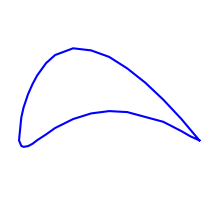

airfoils_img/goe362.png
data_airfoils/goe363.txt


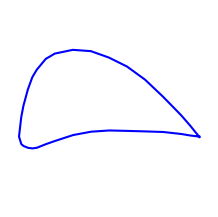

airfoils_img/goe363.png
data_airfoils/goe364.txt


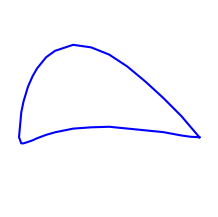

airfoils_img/goe364.png
data_airfoils/goe365.txt


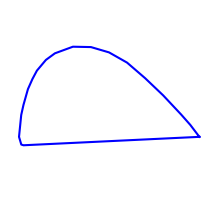

airfoils_img/goe365.png
data_airfoils/goe366.txt


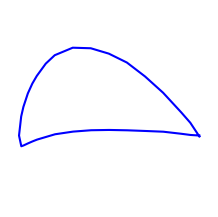

airfoils_img/goe366.png
data_airfoils/goe367.txt


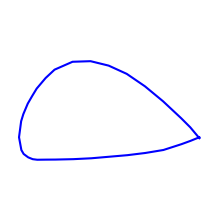

airfoils_img/goe367.png
data_airfoils/goe368.txt


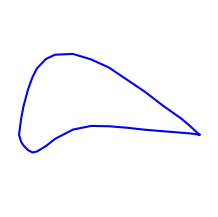

airfoils_img/goe368.png
data_airfoils/goe369.txt


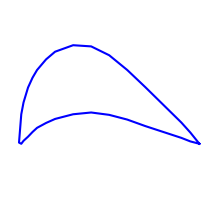

airfoils_img/goe369.png
data_airfoils/goe370.txt


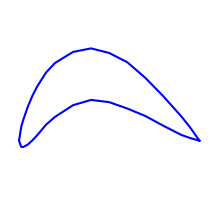

airfoils_img/goe370.png
data_airfoils/goe371.txt


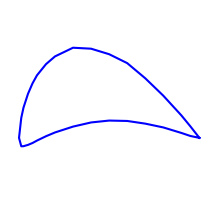

airfoils_img/goe371.png
data_airfoils/goe372.txt


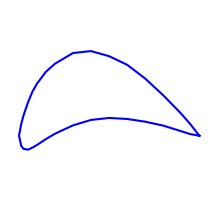

airfoils_img/goe372.png
data_airfoils/goe373.txt


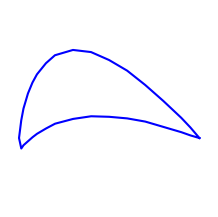

airfoils_img/goe373.png
data_airfoils/goe374.txt


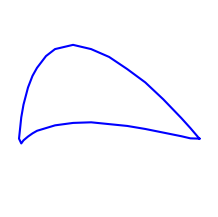

airfoils_img/goe374.png
data_airfoils/goe375.txt


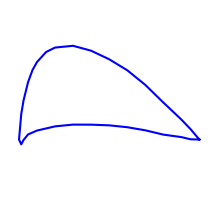

airfoils_img/goe375.png
data_airfoils/goe376.txt


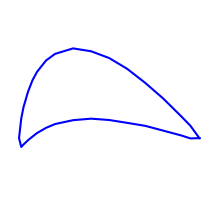

airfoils_img/goe376.png
data_airfoils/goe377.txt


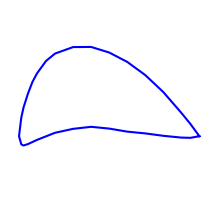

airfoils_img/goe377.png
data_airfoils/goe379.txt


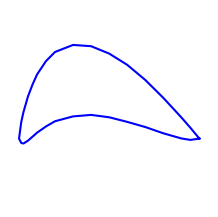

airfoils_img/goe379.png
data_airfoils/goe380.txt


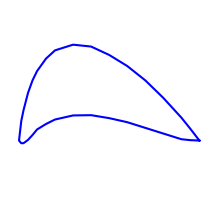

airfoils_img/goe380.png
data_airfoils/goe381.txt


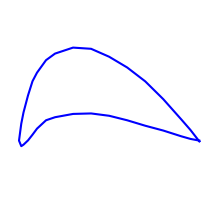

airfoils_img/goe381.png
data_airfoils/goe382.txt


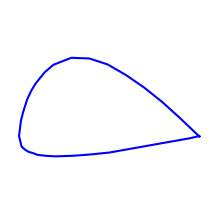

airfoils_img/goe382.png
data_airfoils/goe383.txt


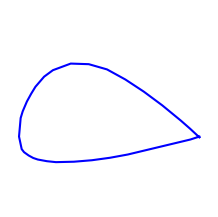

airfoils_img/goe383.png
data_airfoils/goe384.txt


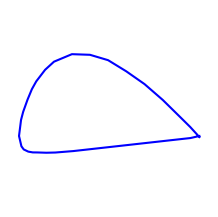

airfoils_img/goe384.png
data_airfoils/goe385.txt


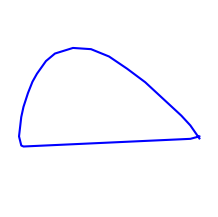

airfoils_img/goe385.png
data_airfoils/goe386.txt


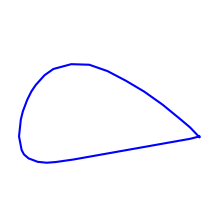

airfoils_img/goe386.png
data_airfoils/goe387.txt


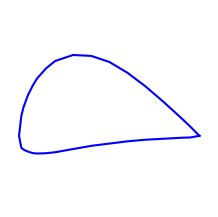

airfoils_img/goe387.png
data_airfoils/goe388.txt


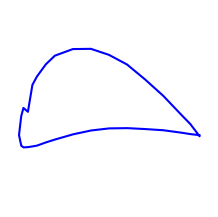

airfoils_img/goe388.png
data_airfoils/goe389.txt


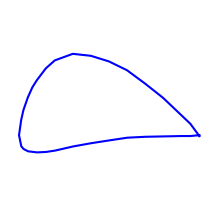

airfoils_img/goe389.png
data_airfoils/goe390.txt


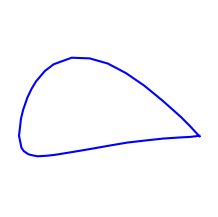

airfoils_img/goe390.png
data_airfoils/goe391.txt


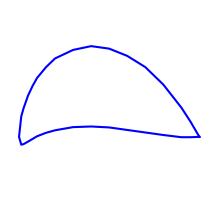

airfoils_img/goe391.png
data_airfoils/goe392.txt


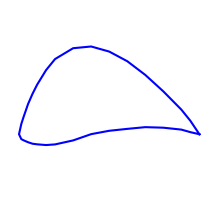

airfoils_img/goe392.png
data_airfoils/goe393.txt


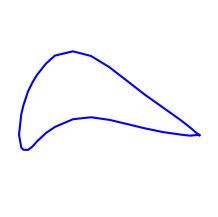

airfoils_img/goe393.png
data_airfoils/goe394.txt


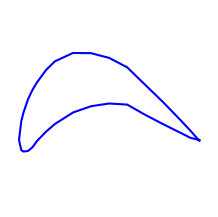

airfoils_img/goe394.png
data_airfoils/goe395.txt


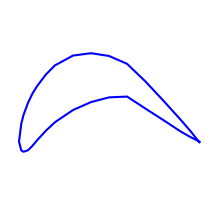

airfoils_img/goe395.png
data_airfoils/goe396.txt


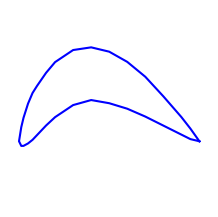

airfoils_img/goe396.png
data_airfoils/goe397.txt


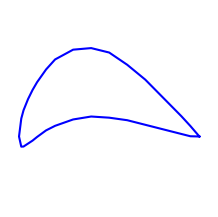

airfoils_img/goe397.png
data_airfoils/goe398.txt


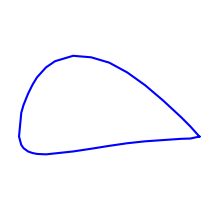

airfoils_img/goe398.png
data_airfoils/goe399.txt


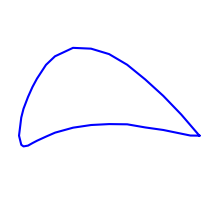

airfoils_img/goe399.png
data_airfoils/goe400.txt


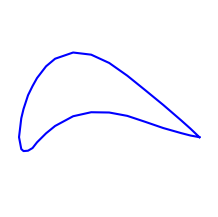

airfoils_img/goe400.png
data_airfoils/goe401.txt


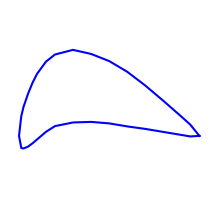

airfoils_img/goe401.png
data_airfoils/goe402.txt


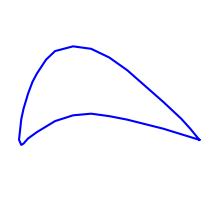

airfoils_img/goe402.png
data_airfoils/goe403.txt


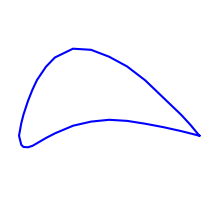

airfoils_img/goe403.png
data_airfoils/goe404.txt


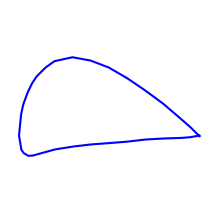

airfoils_img/goe404.png
data_airfoils/goe405.txt


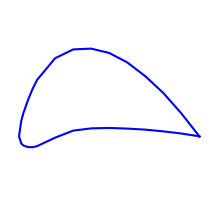

airfoils_img/goe405.png
data_airfoils/goe406.txt


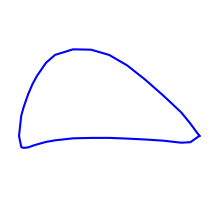

airfoils_img/goe406.png
data_airfoils/goe407.txt


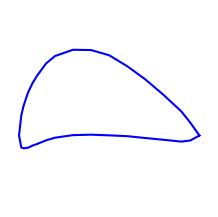

airfoils_img/goe407.png
data_airfoils/goe408.txt


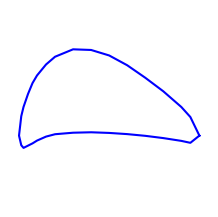

airfoils_img/goe408.png
data_airfoils/goe409.txt


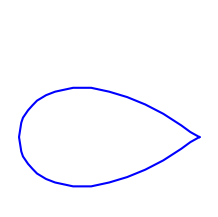

airfoils_img/goe409.png
data_airfoils/goe410.txt


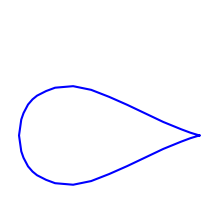

airfoils_img/goe410.png
data_airfoils/goe411.txt


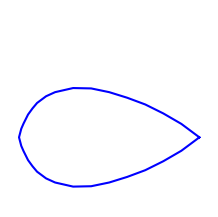

airfoils_img/goe411.png
data_airfoils/goe412.txt


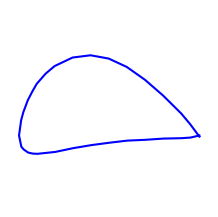

airfoils_img/goe412.png
data_airfoils/goe413.txt


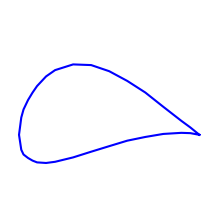

airfoils_img/goe413.png
data_airfoils/goe414.txt


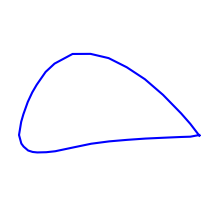

airfoils_img/goe414.png
data_airfoils/goe415.txt


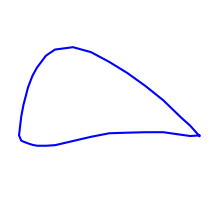

airfoils_img/goe415.png
data_airfoils/goe416a.txt


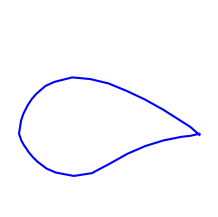

airfoils_img/goe416a.png
data_airfoils/goe417.txt


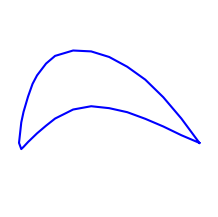

airfoils_img/goe417.png
data_airfoils/goe417a.txt


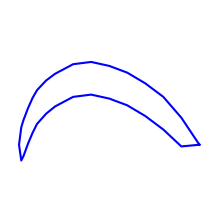

airfoils_img/goe417a.png
data_airfoils/goe418.txt


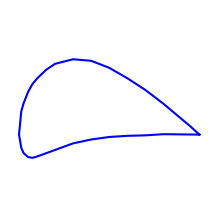

airfoils_img/goe418.png
data_airfoils/goe419.txt


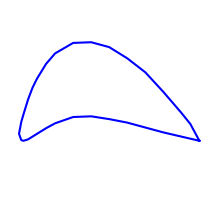

airfoils_img/goe419.png
data_airfoils/goe420.txt


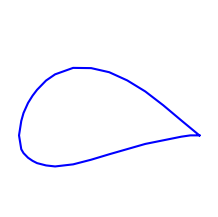

airfoils_img/goe420.png
data_airfoils/goe421.txt


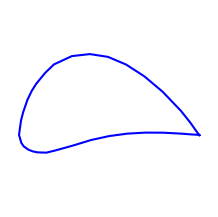

airfoils_img/goe421.png
data_airfoils/goe422.txt


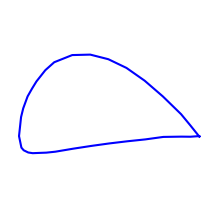

airfoils_img/goe422.png
data_airfoils/goe423.txt


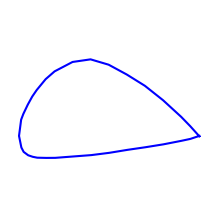

airfoils_img/goe423.png
data_airfoils/goe424.txt


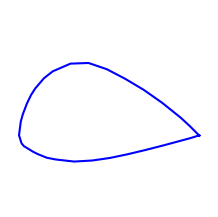

airfoils_img/goe424.png
data_airfoils/goe425.txt


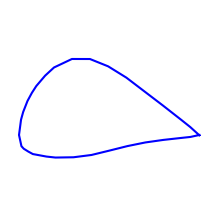

airfoils_img/goe425.png
data_airfoils/goe426.txt


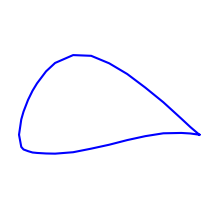

airfoils_img/goe426.png
data_airfoils/goe427.txt


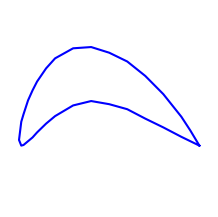

airfoils_img/goe427.png
data_airfoils/goe428.txt


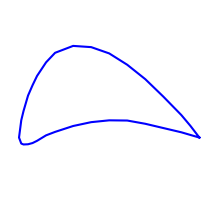

airfoils_img/goe428.png
data_airfoils/goe429.txt


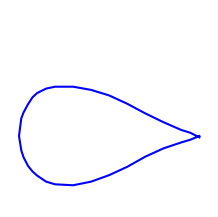

airfoils_img/goe429.png
data_airfoils/goe430.txt


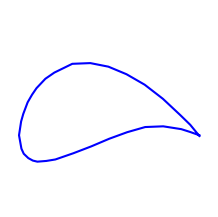

airfoils_img/goe430.png
data_airfoils/goe431.txt


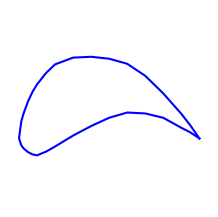

airfoils_img/goe431.png
data_airfoils/goe432.txt


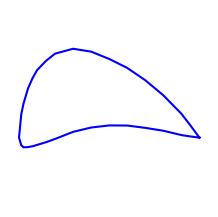

airfoils_img/goe432.png
data_airfoils/goe433.txt


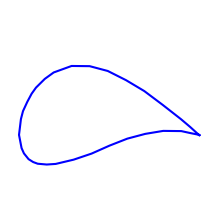

airfoils_img/goe433.png
data_airfoils/goe434.txt


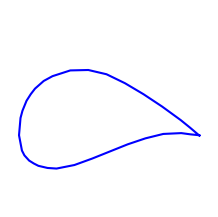

airfoils_img/goe434.png
data_airfoils/goe435.txt


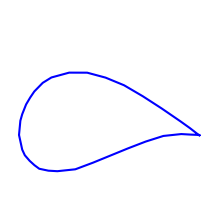

airfoils_img/goe435.png
data_airfoils/goe436.txt


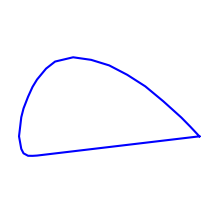

airfoils_img/goe436.png
data_airfoils/goe437.txt


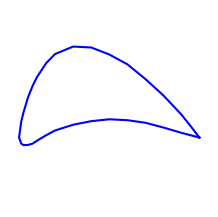

airfoils_img/goe437.png
data_airfoils/goe438.txt


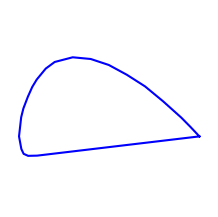

airfoils_img/goe438.png
data_airfoils/goe439.txt


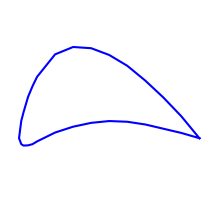

airfoils_img/goe439.png
data_airfoils/goe440.txt


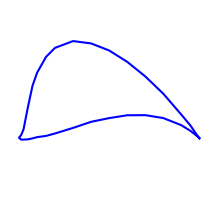

airfoils_img/goe440.png
data_airfoils/goe441.txt


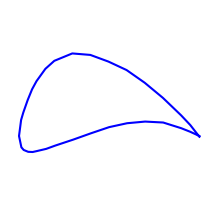

airfoils_img/goe441.png
data_airfoils/goe442.txt


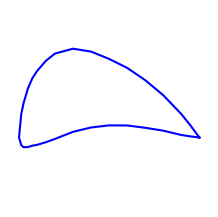

airfoils_img/goe442.png
data_airfoils/goe443.txt


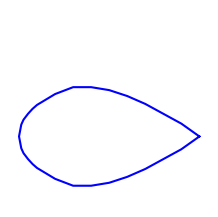

airfoils_img/goe443.png
data_airfoils/goe444.txt


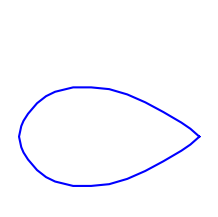

airfoils_img/goe444.png
data_airfoils/goe445.txt


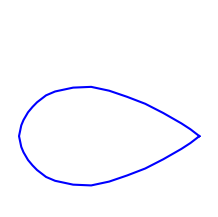

airfoils_img/goe445.png
data_airfoils/goe446.txt


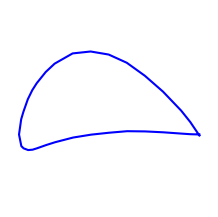

airfoils_img/goe446.png
data_airfoils/goe447.txt


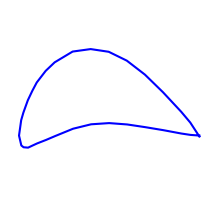

airfoils_img/goe447.png
data_airfoils/goe448.txt


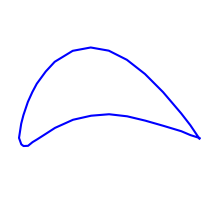

airfoils_img/goe448.png
data_airfoils/goe449.txt


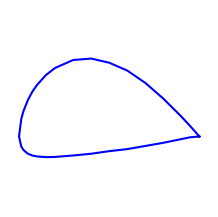

airfoils_img/goe449.png
data_airfoils/goe450.txt


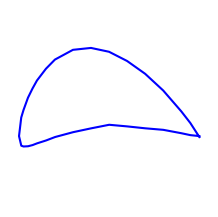

airfoils_img/goe450.png
data_airfoils/goe451.txt


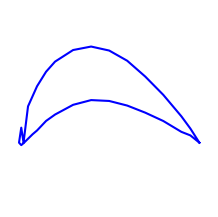

airfoils_img/goe451.png
data_airfoils/goe456.txt


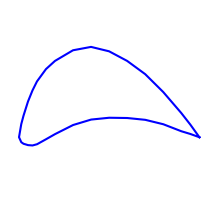

airfoils_img/goe456.png
data_airfoils/goe457.txt


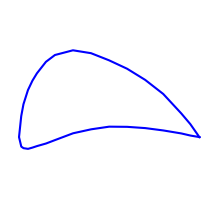

airfoils_img/goe457.png
data_airfoils/goe458.txt


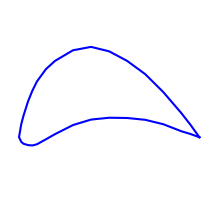

airfoils_img/goe458.png
data_airfoils/goe459.txt


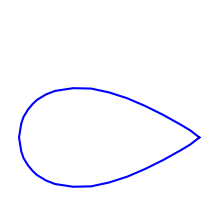

airfoils_img/goe459.png
data_airfoils/goe460.txt


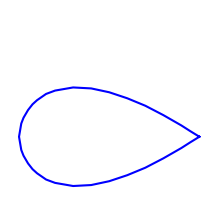

airfoils_img/goe460.png
data_airfoils/goe462.txt


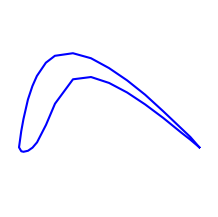

airfoils_img/goe462.png
data_airfoils/goe464.txt


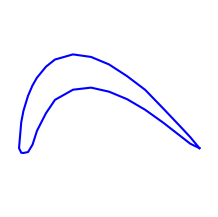

airfoils_img/goe464.png
data_airfoils/goe474.txt


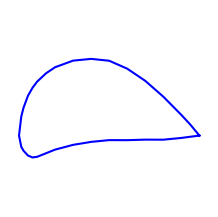

airfoils_img/goe474.png
data_airfoils/goe476.txt


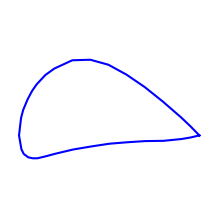

airfoils_img/goe476.png
data_airfoils/goe477.txt


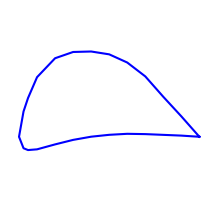

airfoils_img/goe477.png
data_airfoils/goe478.txt


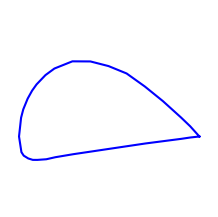

airfoils_img/goe478.png
data_airfoils/goe479.txt


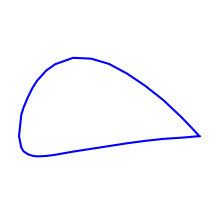

airfoils_img/goe479.png
data_airfoils/goe480.txt


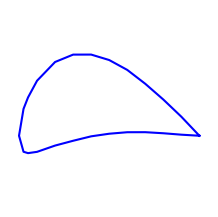

airfoils_img/goe480.png
data_airfoils/goe481.txt


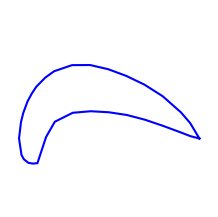

airfoils_img/goe481.png
data_airfoils/goe481a.txt


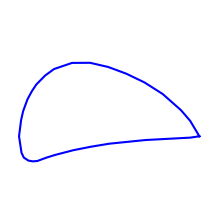

airfoils_img/goe481a.png
data_airfoils/goe482.txt


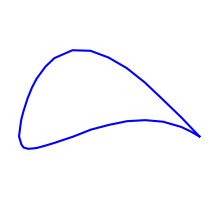

airfoils_img/goe482.png
data_airfoils/goe483.txt


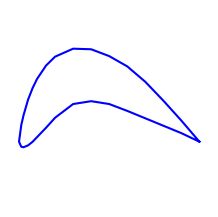

airfoils_img/goe483.png
data_airfoils/goe484.txt


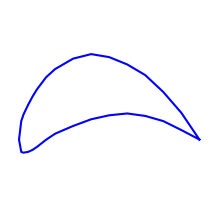

airfoils_img/goe484.png
data_airfoils/goe488.txt


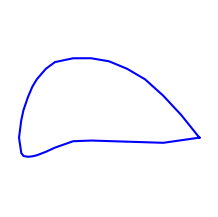

airfoils_img/goe488.png
data_airfoils/goe490.txt


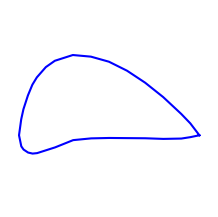

airfoils_img/goe490.png
data_airfoils/goe491.txt


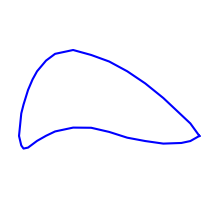

airfoils_img/goe491.png
data_airfoils/goe492.txt


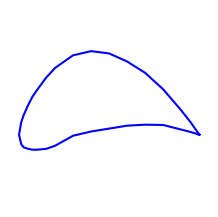

airfoils_img/goe492.png
data_airfoils/goe493.txt


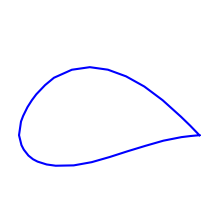

airfoils_img/goe493.png
data_airfoils/goe494.txt


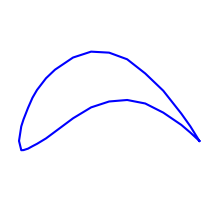

airfoils_img/goe494.png
data_airfoils/goe495.txt


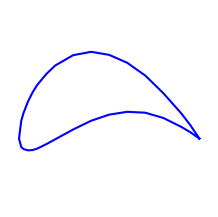

airfoils_img/goe495.png
data_airfoils/goe496.txt


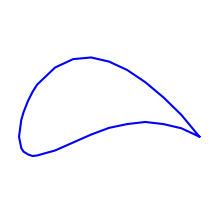

airfoils_img/goe496.png
data_airfoils/goe497.txt


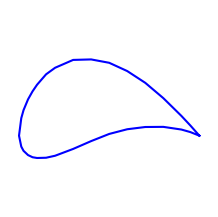

airfoils_img/goe497.png
data_airfoils/goe498.txt


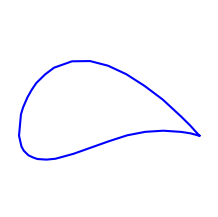

airfoils_img/goe498.png
data_airfoils/goe499.txt


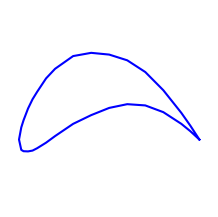

airfoils_img/goe499.png
data_airfoils/goe500.txt


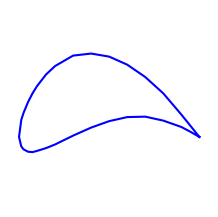

airfoils_img/goe500.png
data_airfoils/goe501.txt


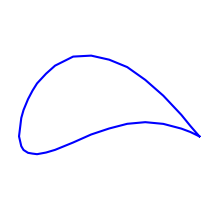

airfoils_img/goe501.png
data_airfoils/goe502.txt


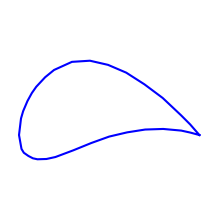

airfoils_img/goe502.png
data_airfoils/goe503.txt


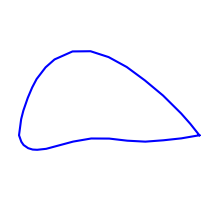

airfoils_img/goe503.png
data_airfoils/goe504.txt


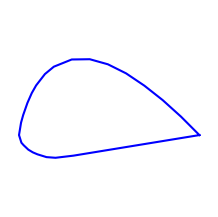

airfoils_img/goe504.png
data_airfoils/goe505.txt


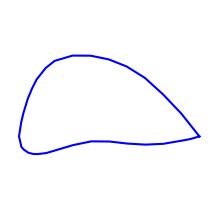

airfoils_img/goe505.png
data_airfoils/goe506.txt


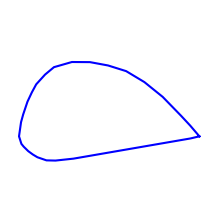

airfoils_img/goe506.png
data_airfoils/goe507.txt


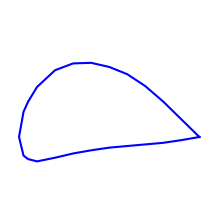

airfoils_img/goe507.png
data_airfoils/goe508.txt


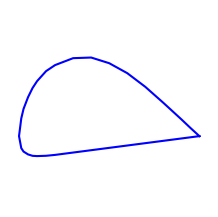

airfoils_img/goe508.png
data_airfoils/goe509.txt


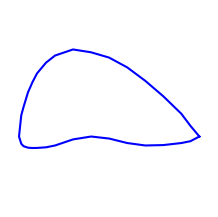

airfoils_img/goe509.png
data_airfoils/goe510.txt


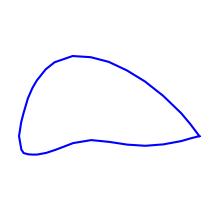

airfoils_img/goe510.png
data_airfoils/goe511.txt


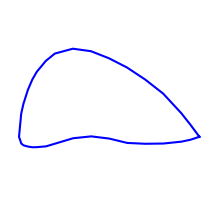

airfoils_img/goe511.png
data_airfoils/goe512.txt


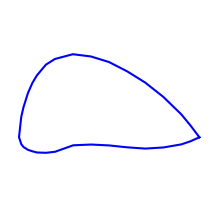

airfoils_img/goe512.png
data_airfoils/goe513.txt


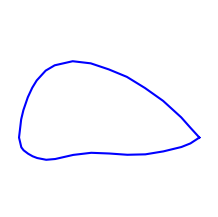

airfoils_img/goe513.png
data_airfoils/goe514.txt


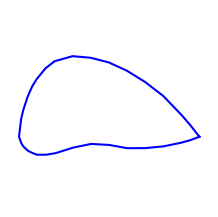

airfoils_img/goe514.png
data_airfoils/goe515.txt


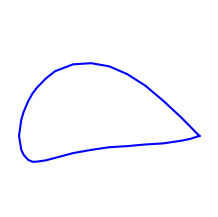

airfoils_img/goe515.png
data_airfoils/goe517.txt


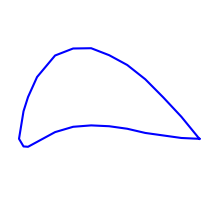

airfoils_img/goe517.png
data_airfoils/goe518.txt


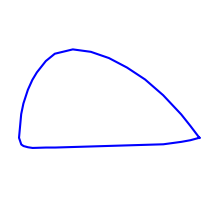

airfoils_img/goe518.png
data_airfoils/goe522.txt


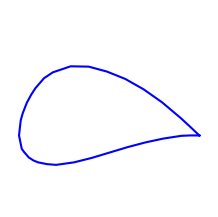

airfoils_img/goe522.png
data_airfoils/goe523.txt


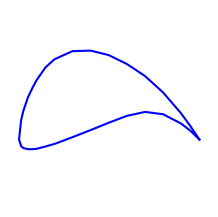

airfoils_img/goe523.png
data_airfoils/goe525.txt


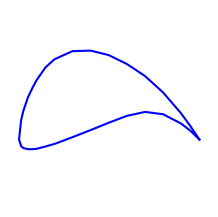

airfoils_img/goe525.png
data_airfoils/goe526.txt


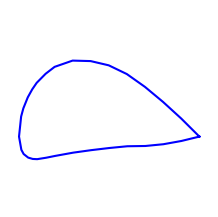

airfoils_img/goe526.png
data_airfoils/goe527.txt


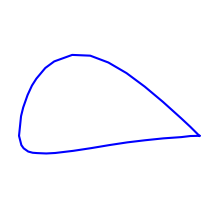

airfoils_img/goe527.png
data_airfoils/goe528.txt


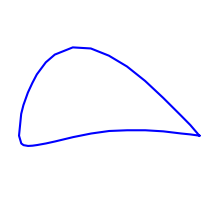

airfoils_img/goe528.png
data_airfoils/goe529.txt


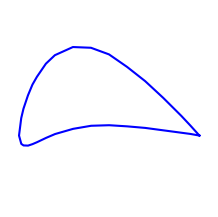

airfoils_img/goe529.png
data_airfoils/goe530.txt


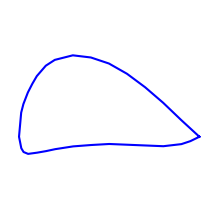

airfoils_img/goe530.png
data_airfoils/goe531.txt


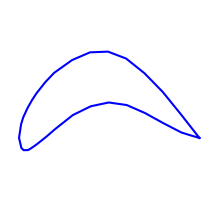

airfoils_img/goe531.png
data_airfoils/goe532.txt


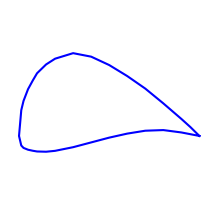

airfoils_img/goe532.png
data_airfoils/goe533.txt


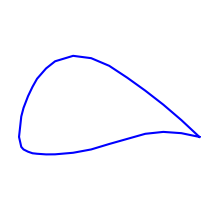

airfoils_img/goe533.png
data_airfoils/goe534.txt


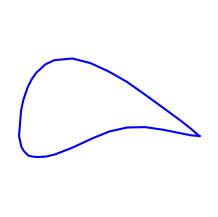

airfoils_img/goe534.png
data_airfoils/goe535.txt


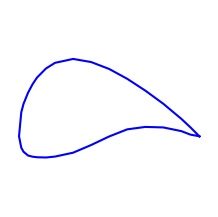

airfoils_img/goe535.png
data_airfoils/goe54.txt


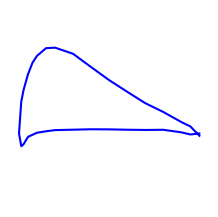

airfoils_img/goe54.png
data_airfoils/goe546.txt


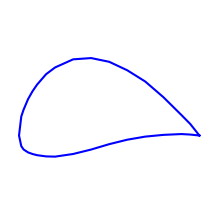

airfoils_img/goe546.png
data_airfoils/goe547.txt


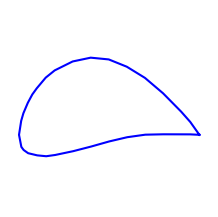

airfoils_img/goe547.png
data_airfoils/goe548.txt


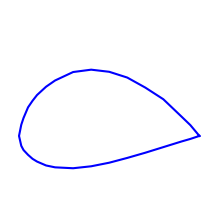

airfoils_img/goe548.png
data_airfoils/goe549.txt


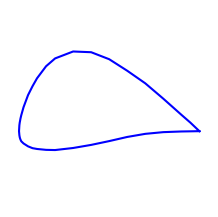

airfoils_img/goe549.png
data_airfoils/goe55.txt


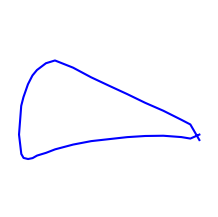

airfoils_img/goe55.png
data_airfoils/goe550.txt


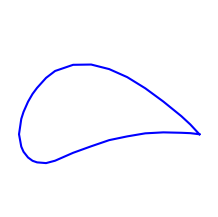

airfoils_img/goe550.png
data_airfoils/goe553.txt


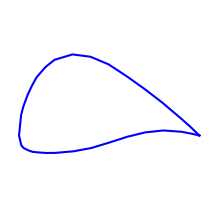

airfoils_img/goe553.png
data_airfoils/goe559.txt


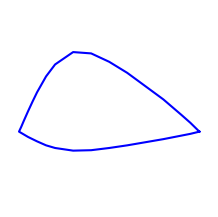

airfoils_img/goe559.png
data_airfoils/goe561.txt


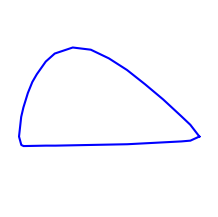

airfoils_img/goe561.png
data_airfoils/goe562.txt


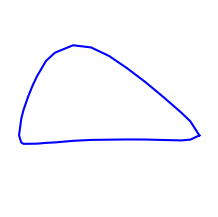

airfoils_img/goe562.png
data_airfoils/goe563.txt


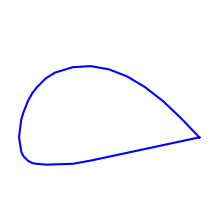

airfoils_img/goe563.png
data_airfoils/goe564.txt


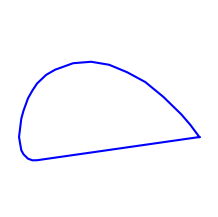

airfoils_img/goe564.png
data_airfoils/goe565.txt


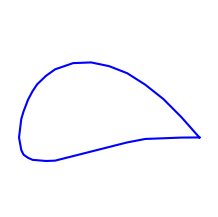

airfoils_img/goe565.png
data_airfoils/goe566.txt


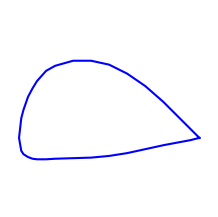

airfoils_img/goe566.png
data_airfoils/goe567.txt


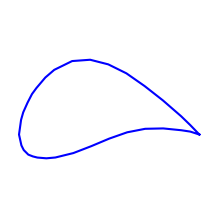

airfoils_img/goe567.png
data_airfoils/goe57.txt


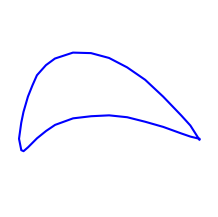

airfoils_img/goe57.png
data_airfoils/goe570.txt


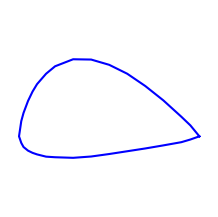

airfoils_img/goe570.png
data_airfoils/goe571.txt


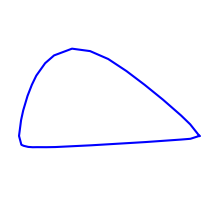

airfoils_img/goe571.png
data_airfoils/goe572.txt


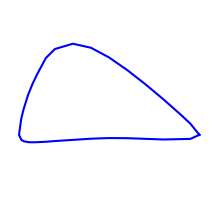

airfoils_img/goe572.png
data_airfoils/goe573.txt


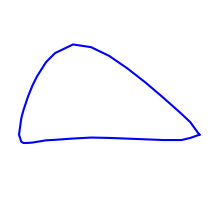

airfoils_img/goe573.png
data_airfoils/goe574.txt


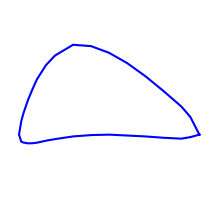

airfoils_img/goe574.png
data_airfoils/goe575.txt


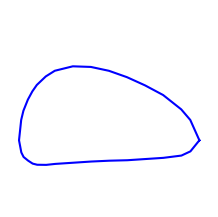

airfoils_img/goe575.png
data_airfoils/goe584.txt


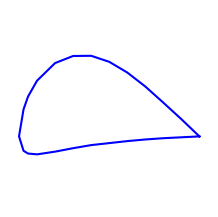

airfoils_img/goe584.png
data_airfoils/goe585.txt


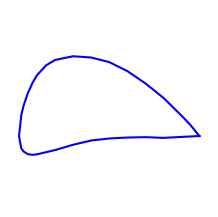

airfoils_img/goe585.png
data_airfoils/goe587.txt


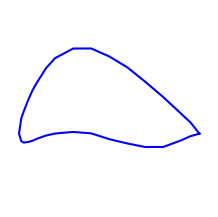

airfoils_img/goe587.png
data_airfoils/goe590.txt


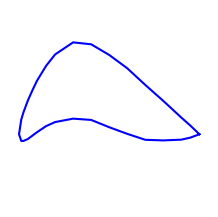

airfoils_img/goe590.png
data_airfoils/goe591.txt


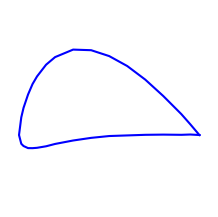

airfoils_img/goe591.png
data_airfoils/goe592.txt


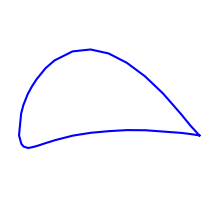

airfoils_img/goe592.png
data_airfoils/goe593.txt


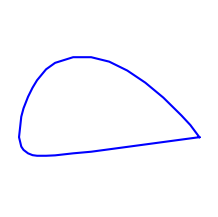

airfoils_img/goe593.png
data_airfoils/goe595.txt


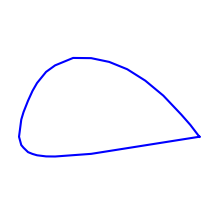

airfoils_img/goe595.png
data_airfoils/goe596.txt


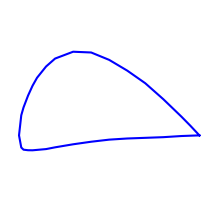

airfoils_img/goe596.png
data_airfoils/goe598.txt


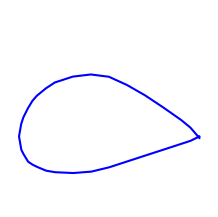

airfoils_img/goe598.png
data_airfoils/goe599.txt


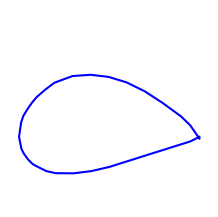

airfoils_img/goe599.png
data_airfoils/goe600.txt


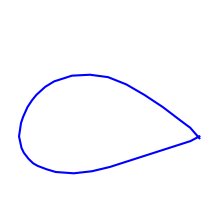

airfoils_img/goe600.png
data_airfoils/goe601.txt


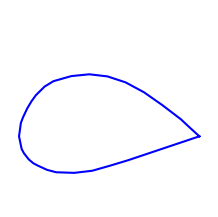

airfoils_img/goe601.png
data_airfoils/goe602.txt


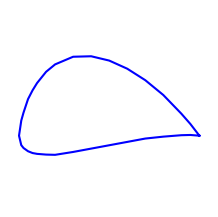

airfoils_img/goe602.png
data_airfoils/goe602m.txt


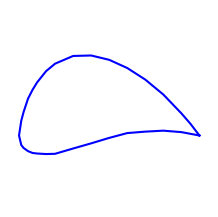

airfoils_img/goe602m.png
data_airfoils/goe604.txt


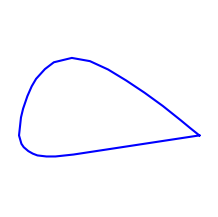

airfoils_img/goe604.png
data_airfoils/goe610b.txt


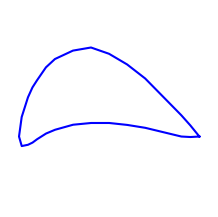

airfoils_img/goe610b.png
data_airfoils/goe610bm.txt


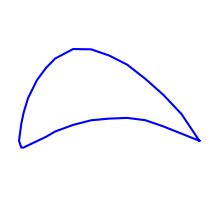

airfoils_img/goe610bm.png
data_airfoils/goe611.txt


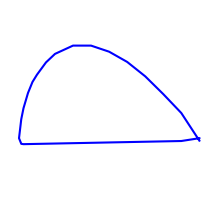

airfoils_img/goe611.png
data_airfoils/goe612.txt


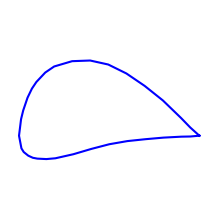

airfoils_img/goe612.png
data_airfoils/goe613.txt


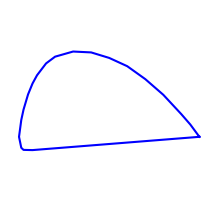

airfoils_img/goe613.png
data_airfoils/goe614.txt


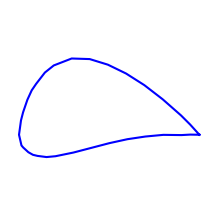

airfoils_img/goe614.png
data_airfoils/goe615.txt


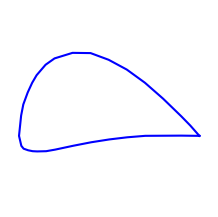

airfoils_img/goe615.png
data_airfoils/goe617.txt


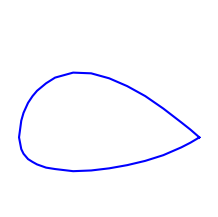

airfoils_img/goe617.png
data_airfoils/goe619.txt


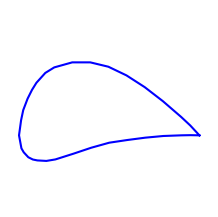

airfoils_img/goe619.png
data_airfoils/goe620.txt


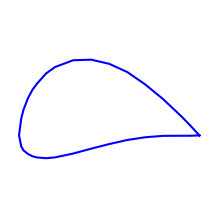

airfoils_img/goe620.png
data_airfoils/goe621.txt


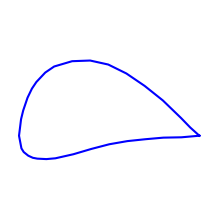

airfoils_img/goe621.png
data_airfoils/goe622.txt


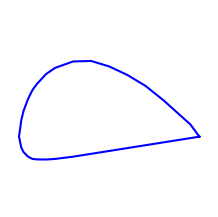

airfoils_img/goe622.png
data_airfoils/goe623.txt


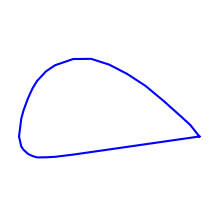

airfoils_img/goe623.png
data_airfoils/goe624.txt


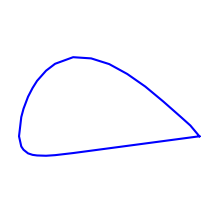

airfoils_img/goe624.png
data_airfoils/goe625.txt


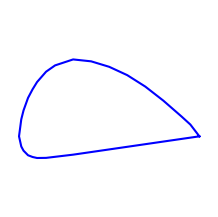

airfoils_img/goe625.png
data_airfoils/goe626.txt


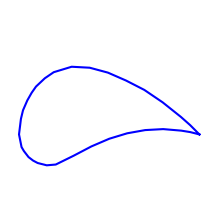

airfoils_img/goe626.png
data_airfoils/goe627.txt


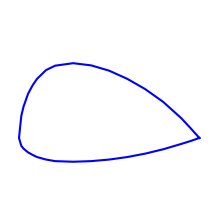

airfoils_img/goe627.png
data_airfoils/goe628.txt


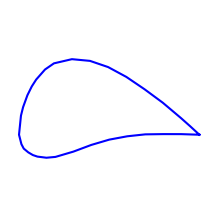

airfoils_img/goe628.png
data_airfoils/goe629.txt


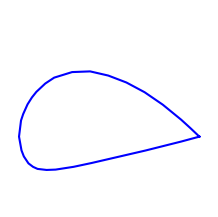

airfoils_img/goe629.png
data_airfoils/goe63.txt


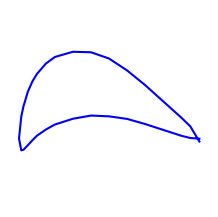

airfoils_img/goe63.png
data_airfoils/goe630.txt


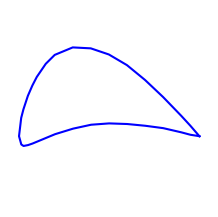

airfoils_img/goe630.png
data_airfoils/goe632.txt


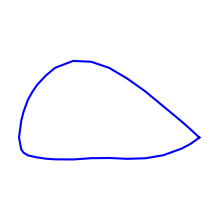

airfoils_img/goe632.png
data_airfoils/goe633.txt


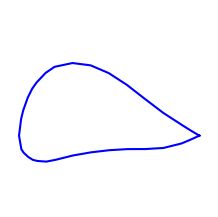

airfoils_img/goe633.png
data_airfoils/goe645.txt


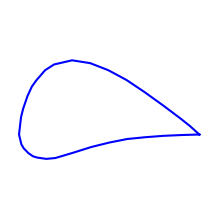

airfoils_img/goe645.png
data_airfoils/goe646.txt


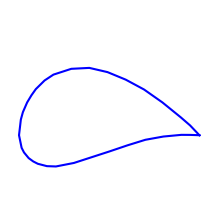

airfoils_img/goe646.png
data_airfoils/goe647.txt


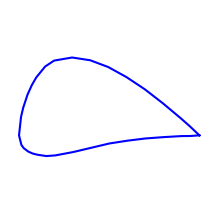

airfoils_img/goe647.png
data_airfoils/goe648.txt


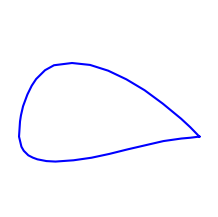

airfoils_img/goe648.png
data_airfoils/goe650.txt


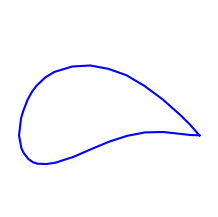

airfoils_img/goe650.png
data_airfoils/goe652.txt


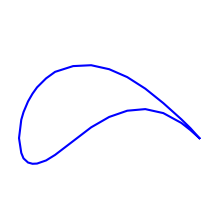

airfoils_img/goe652.png
data_airfoils/goe654.txt


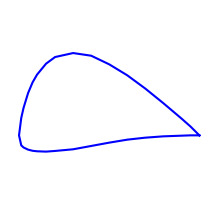

airfoils_img/goe654.png
data_airfoils/goe655.txt


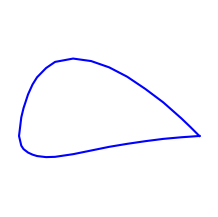

airfoils_img/goe655.png
data_airfoils/goe670.txt


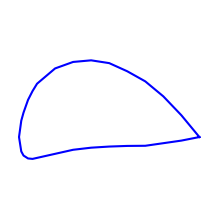

airfoils_img/goe670.png
data_airfoils/goe673.txt


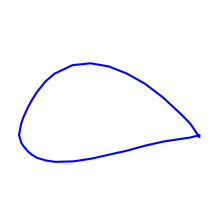

airfoils_img/goe673.png
data_airfoils/goe675.txt


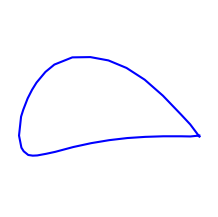

airfoils_img/goe675.png
data_airfoils/goe676.txt


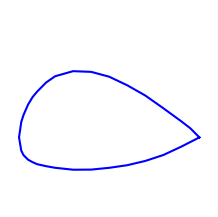

airfoils_img/goe676.png
data_airfoils/goe677.txt


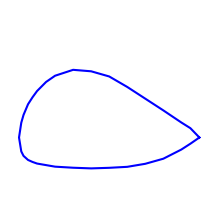

airfoils_img/goe677.png
data_airfoils/goe679.txt


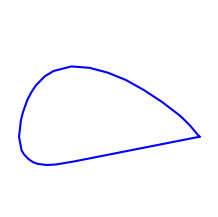

airfoils_img/goe679.png
data_airfoils/goe681.txt


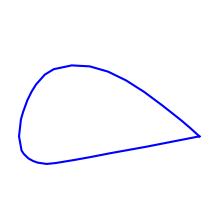

airfoils_img/goe681.png
data_airfoils/goe682.txt


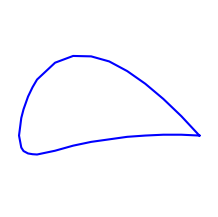

airfoils_img/goe682.png
data_airfoils/goe683.txt


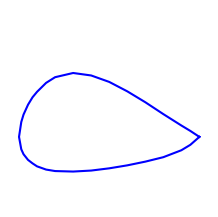

airfoils_img/goe683.png
data_airfoils/goe685.txt


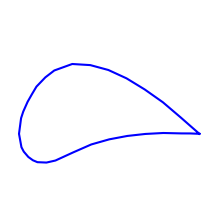

airfoils_img/goe685.png
data_airfoils/goe692.txt


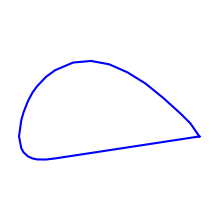

airfoils_img/goe692.png
data_airfoils/goe693.txt


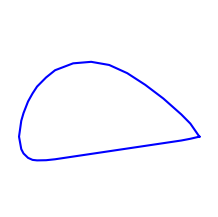

airfoils_img/goe693.png
data_airfoils/goe701.txt


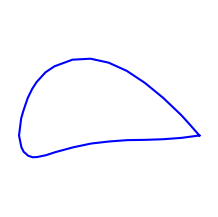

airfoils_img/goe701.png
data_airfoils/goe702.txt


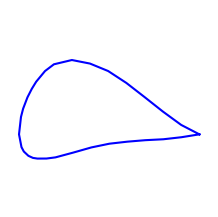

airfoils_img/goe702.png
data_airfoils/goe703.txt


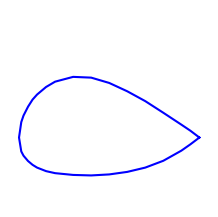

airfoils_img/goe703.png
data_airfoils/goe704.txt


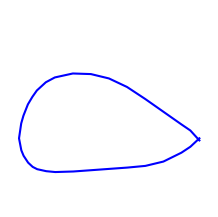

airfoils_img/goe704.png
data_airfoils/goe711.txt


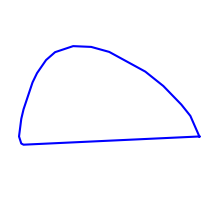

airfoils_img/goe711.png
data_airfoils/goe723.txt


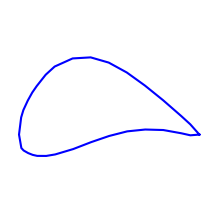

airfoils_img/goe723.png
data_airfoils/goe735.txt


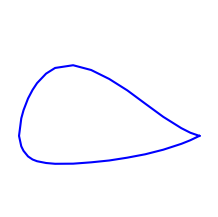

airfoils_img/goe735.png
data_airfoils/goe738.txt


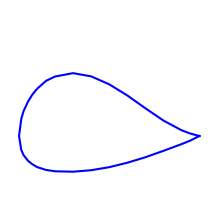

airfoils_img/goe738.png
data_airfoils/goe741.txt


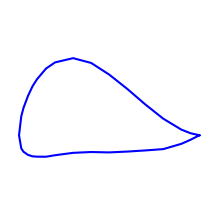

airfoils_img/goe741.png
data_airfoils/goe744.txt


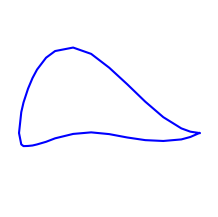

airfoils_img/goe744.png
data_airfoils/goe746.txt


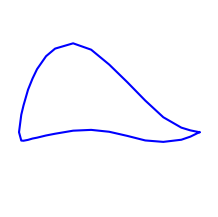

airfoils_img/goe746.png
data_airfoils/goe758.txt


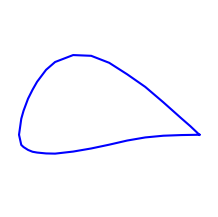

airfoils_img/goe758.png
data_airfoils/goe766.txt


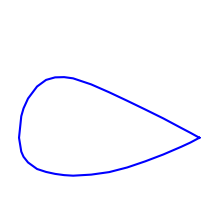

airfoils_img/goe766.png
data_airfoils/goe767.txt


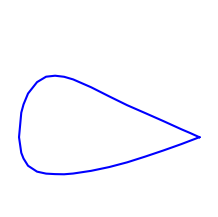

airfoils_img/goe767.png
data_airfoils/goe769.txt


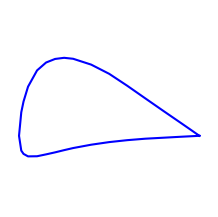

airfoils_img/goe769.png
data_airfoils/goe770.txt


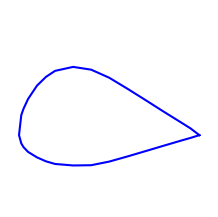

airfoils_img/goe770.png
data_airfoils/goe775.txt


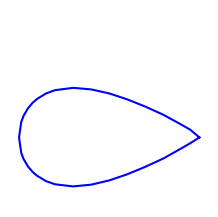

airfoils_img/goe775.png
data_airfoils/goe776.txt


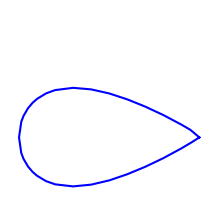

airfoils_img/goe776.png
data_airfoils/goe777.txt


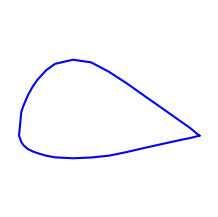

airfoils_img/goe777.png
data_airfoils/goe780.txt


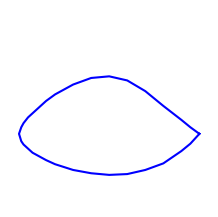

airfoils_img/goe780.png
data_airfoils/goe79.txt


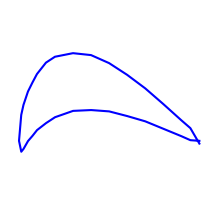

airfoils_img/goe79.png
data_airfoils/goe795.txt


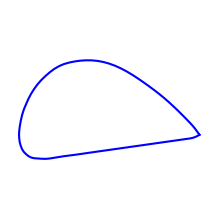

airfoils_img/goe795.png
data_airfoils/goe795sm.txt


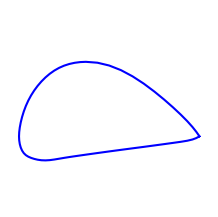

airfoils_img/goe795sm.png
data_airfoils/goe796.txt


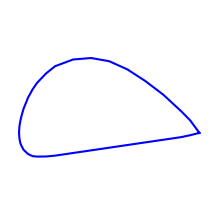

airfoils_img/goe796.png
data_airfoils/goe797.txt


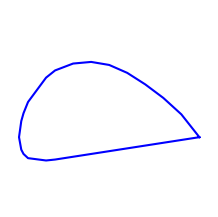

airfoils_img/goe797.png
data_airfoils/goe798.txt


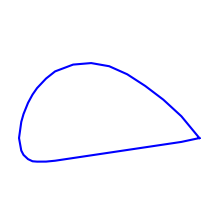

airfoils_img/goe798.png
data_airfoils/goe801.txt


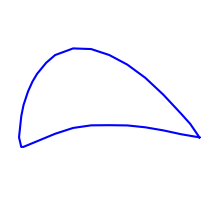

airfoils_img/goe801.png
data_airfoils/goe802.txt


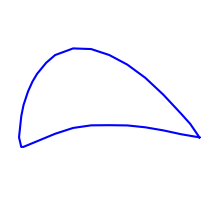

airfoils_img/goe802.png
data_airfoils/goe802a.txt


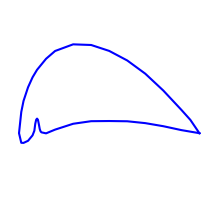

airfoils_img/goe802a.png
data_airfoils/goe802b.txt


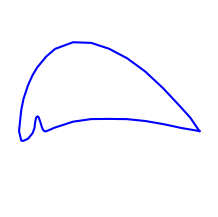

airfoils_img/goe802b.png
data_airfoils/goe803h.txt


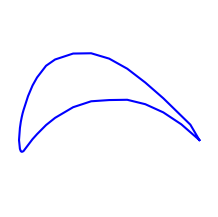

airfoils_img/goe803h.png
data_airfoils/goe804.txt


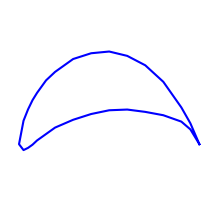

airfoils_img/goe804.png
data_airfoils/goe81.txt


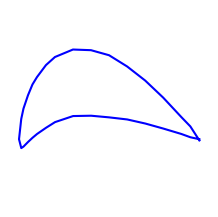

airfoils_img/goe81.png
data_airfoils/goe92.txt


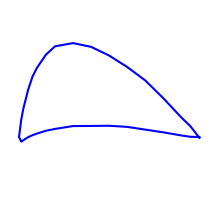

airfoils_img/goe92.png
data_airfoils/griffith30SymSuction.txt


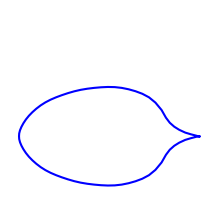

airfoils_img/griffith30SymSuction.png
data_airfoils/gs1.txt


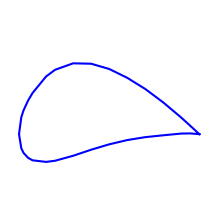

airfoils_img/gs1.png
data_airfoils/gu255118.txt


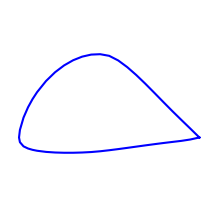

airfoils_img/gu255118.png
data_airfoils/hh02.txt


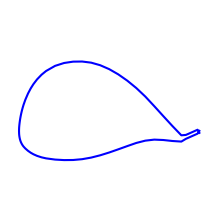

airfoils_img/hh02.png
data_airfoils/hobie.txt


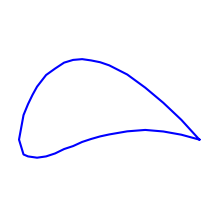

airfoils_img/hobie.png
data_airfoils/hobiesm.txt


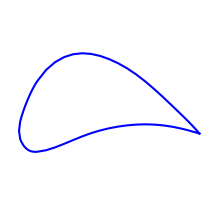

airfoils_img/hobiesm.png
data_airfoils/hq010.txt


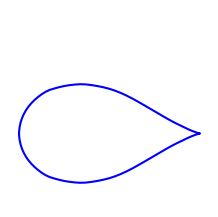

airfoils_img/hq010.png
data_airfoils/hq07.txt


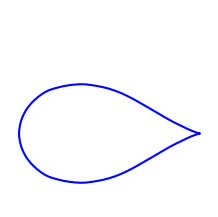

airfoils_img/hq07.png
data_airfoils/hq09.txt


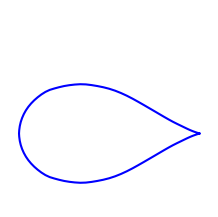

airfoils_img/hq09.png
data_airfoils/hq1010.txt


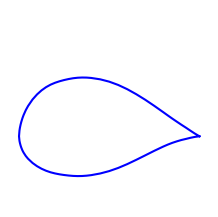

airfoils_img/hq1010.png
data_airfoils/hq1012.txt


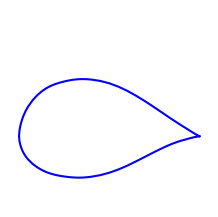

airfoils_img/hq1012.png
data_airfoils/hq108.txt


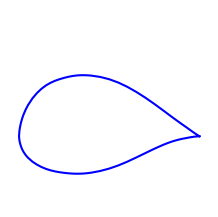

airfoils_img/hq108.png
data_airfoils/hq109.txt


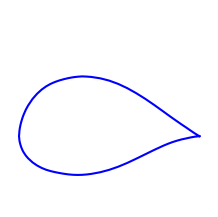

airfoils_img/hq109.png
data_airfoils/hq1510.txt


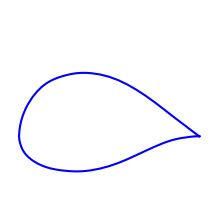

airfoils_img/hq1510.png
data_airfoils/hq1511.txt


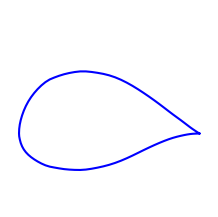

airfoils_img/hq1511.png
data_airfoils/hq1512.txt


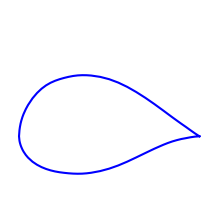

airfoils_img/hq1512.png
data_airfoils/hq158.txt


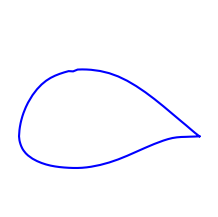

airfoils_img/hq158.png
data_airfoils/hq1585.txt


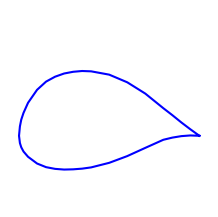

airfoils_img/hq1585.png
data_airfoils/hq159.txt


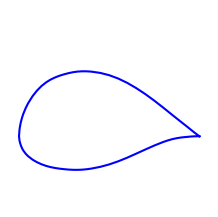

airfoils_img/hq159.png
data_airfoils/hq159b.txt


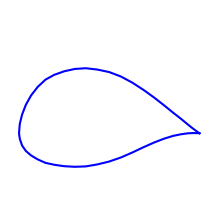

airfoils_img/hq159b.png
data_airfoils/hq2010.txt


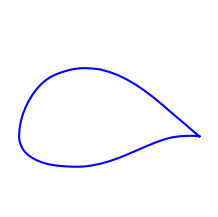

airfoils_img/hq2010.png
data_airfoils/hq2012.txt


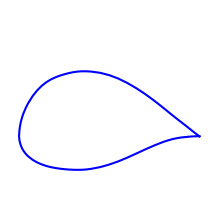

airfoils_img/hq2012.png
data_airfoils/hq208.txt


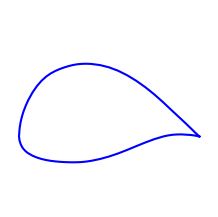

airfoils_img/hq208.png
data_airfoils/hq209.txt


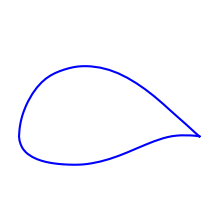

airfoils_img/hq209.png
data_airfoils/hq2090sm.txt


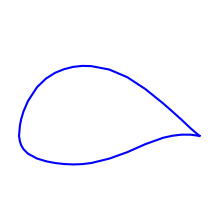

airfoils_img/hq2090sm.png
data_airfoils/hq2195.txt


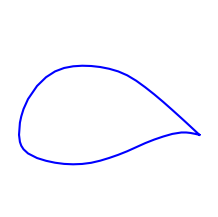

airfoils_img/hq2195.png
data_airfoils/hq2510.txt


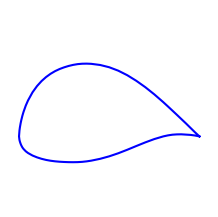

airfoils_img/hq2510.png
data_airfoils/hq2511.txt


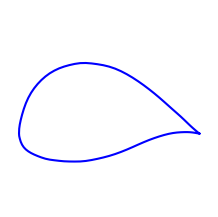

airfoils_img/hq2511.png
data_airfoils/hq2512.txt


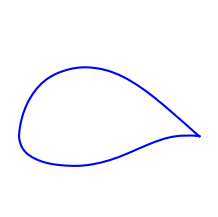

airfoils_img/hq2512.png
data_airfoils/hq258.txt


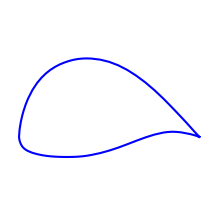

airfoils_img/hq258.png
data_airfoils/hq259.txt


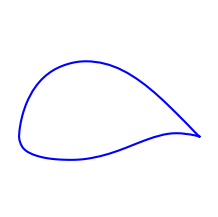

airfoils_img/hq259.png
data_airfoils/hq2590sm.txt


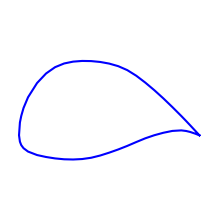

airfoils_img/hq2590sm.png
data_airfoils/hq259b.txt


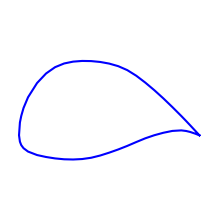

airfoils_img/hq259b.png
data_airfoils/hq300gd2.txt


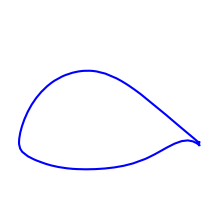

airfoils_img/hq300gd2.png
data_airfoils/hq3010.txt


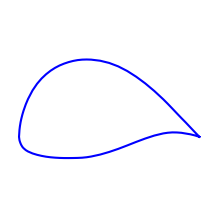

airfoils_img/hq3010.png
data_airfoils/hq3011.txt


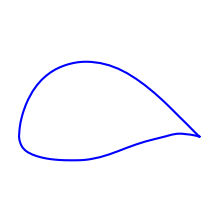

airfoils_img/hq3011.png
data_airfoils/hq3012.txt


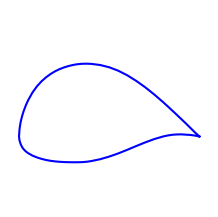

airfoils_img/hq3012.png
data_airfoils/hq3013.txt


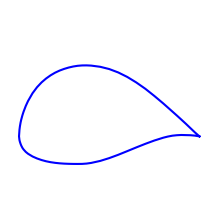

airfoils_img/hq3013.png
data_airfoils/hq3014.txt


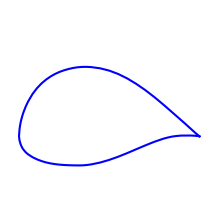

airfoils_img/hq3014.png
data_airfoils/hq3015.txt


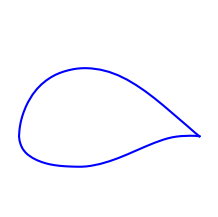

airfoils_img/hq3015.png
data_airfoils/hq308.txt


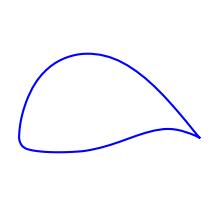

airfoils_img/hq308.png
data_airfoils/hq309.txt


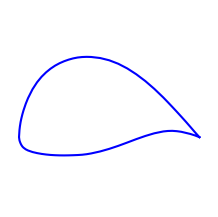

airfoils_img/hq309.png
data_airfoils/hq3510.txt


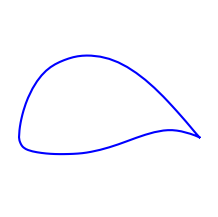

airfoils_img/hq3510.png
data_airfoils/hq3512.txt


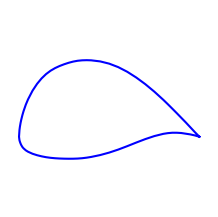

airfoils_img/hq3512.png
data_airfoils/hq3513.txt


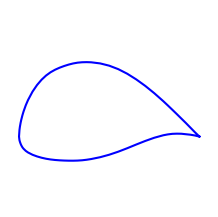

airfoils_img/hq3513.png
data_airfoils/hq3514.txt


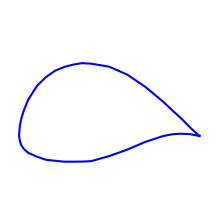

airfoils_img/hq3514.png
data_airfoils/hq3518.txt


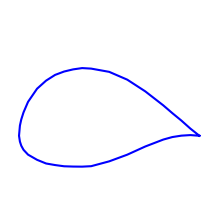

airfoils_img/hq3518.png
data_airfoils/hq358.txt


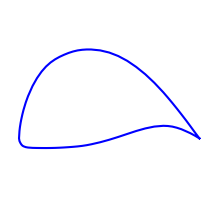

airfoils_img/hq358.png
data_airfoils/hq359.txt


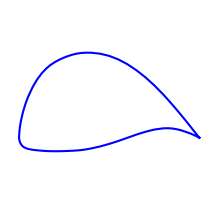

airfoils_img/hq359.png
data_airfoils/hsnlf213.txt


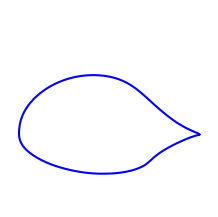

airfoils_img/hsnlf213.png
data_airfoils/ht05.txt


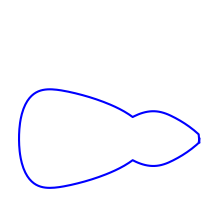

airfoils_img/ht05.png
data_airfoils/ht08.txt


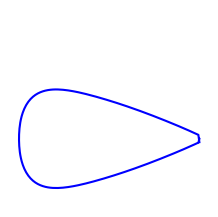

airfoils_img/ht08.png
data_airfoils/ht12.txt


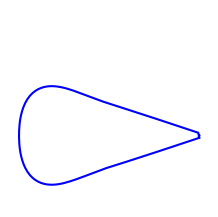

airfoils_img/ht12.png
data_airfoils/ht22.txt


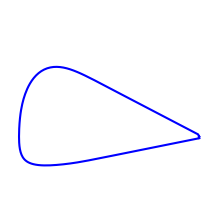

airfoils_img/ht22.png
data_airfoils/ht23.txt


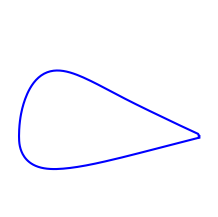

airfoils_img/ht23.png
data_airfoils/isa571.txt


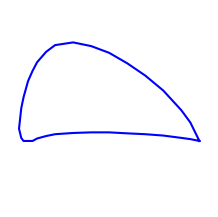

airfoils_img/isa571.png
data_airfoils/isa960.txt


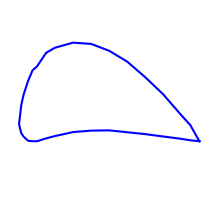

airfoils_img/isa960.png
data_airfoils/isa961.txt


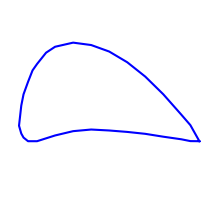

airfoils_img/isa961.png
data_airfoils/isa962.txt


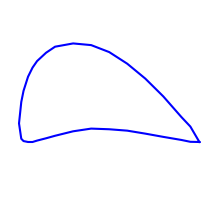

airfoils_img/isa962.png
data_airfoils/j5012.txt


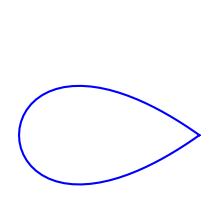

airfoils_img/j5012.png
data_airfoils/jn153.txt


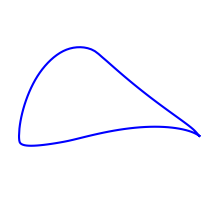

airfoils_img/jn153.png
data_airfoils/joukowsk.txt


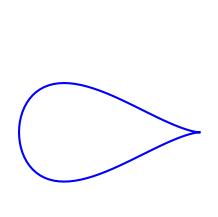

airfoils_img/joukowsk.png
data_airfoils/k1.txt


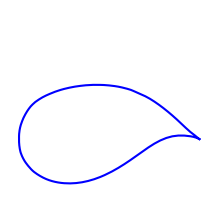

airfoils_img/k1.png
data_airfoils/k2.txt


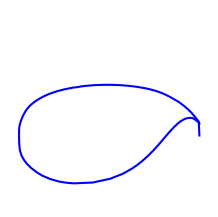

airfoils_img/k2.png
data_airfoils/k3.txt


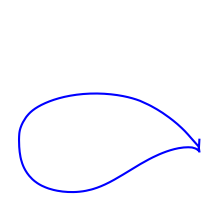

airfoils_img/k3.png
data_airfoils/k3311.txt


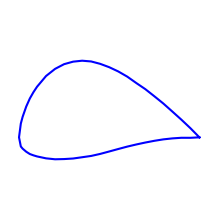

airfoils_img/k3311.png
data_airfoils/k3311sm.txt


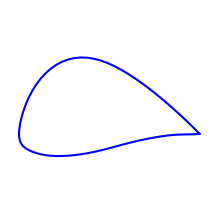

airfoils_img/k3311sm.png
data_airfoils/kc135a.txt


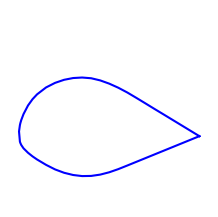

airfoils_img/kc135a.png
data_airfoils/kc135b.txt


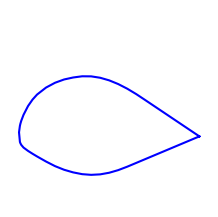

airfoils_img/kc135b.png
data_airfoils/kc135c.txt


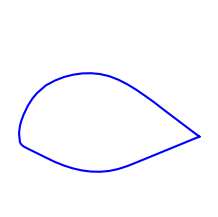

airfoils_img/kc135c.png
data_airfoils/kc135d.txt


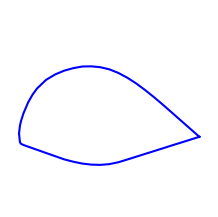

airfoils_img/kc135d.png
data_airfoils/kenmar.txt


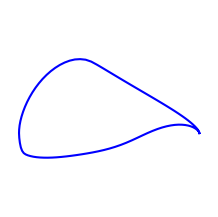

airfoils_img/kenmar.png
data_airfoils/l188root.txt


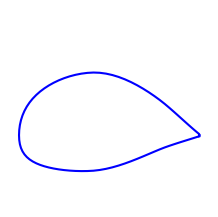

airfoils_img/l188root.png
data_airfoils/l188tip.txt


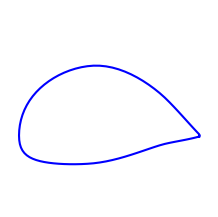

airfoils_img/l188tip.png
data_airfoils/l7769.txt


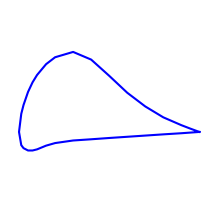

airfoils_img/l7769.png
data_airfoils/la203a.txt


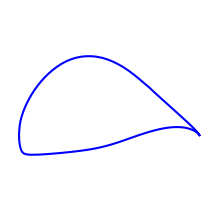

airfoils_img/la203a.png
data_airfoils/la2573a.txt


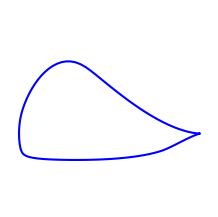

airfoils_img/la2573a.png
data_airfoils/lds2.txt


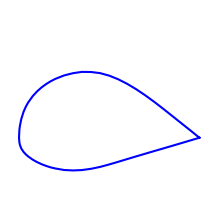

airfoils_img/lds2.png
data_airfoils/lg10sc.txt


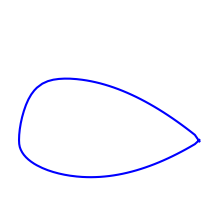

airfoils_img/lg10sc.png
data_airfoils/lnv109a.txt


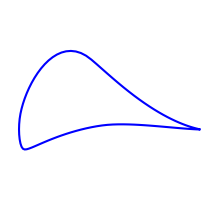

airfoils_img/lnv109a.png
data_airfoils/lrn1007.txt


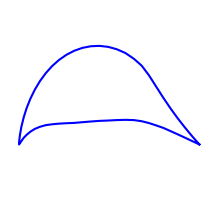

airfoils_img/lrn1007.png
data_airfoils/ls013.txt


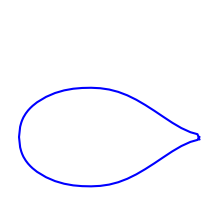

airfoils_img/ls013.png
data_airfoils/ls413.txt


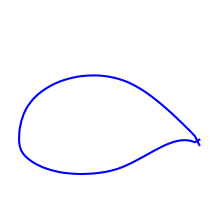

airfoils_img/ls413.png
data_airfoils/ls413mod.txt


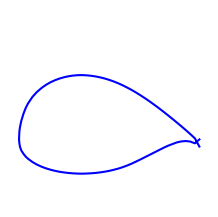

airfoils_img/ls413mod.png
data_airfoils/ls417.txt


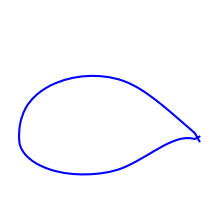

airfoils_img/ls417.png
data_airfoils/ls417mod.txt


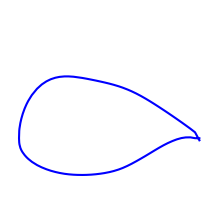

airfoils_img/ls417mod.png
data_airfoils/ls421.txt


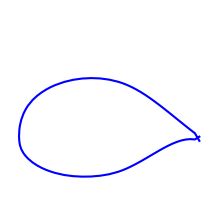

airfoils_img/ls421.png
data_airfoils/ls421mod.txt


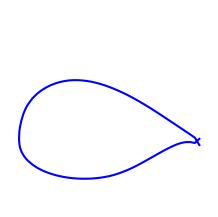

airfoils_img/ls421mod.png
data_airfoils/lwk79100.txt


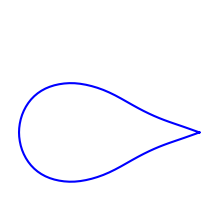

airfoils_img/lwk79100.png
data_airfoils/lwk80080.txt


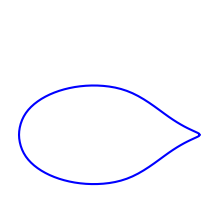

airfoils_img/lwk80080.png
data_airfoils/lwk80100.txt


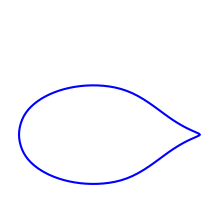

airfoils_img/lwk80100.png
data_airfoils/lwk80120k25.txt


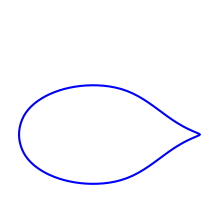

airfoils_img/lwk80120k25.png
data_airfoils/lwk80150k25.txt


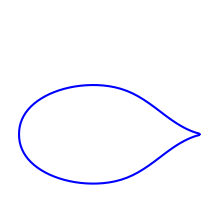

airfoils_img/lwk80150k25.png
data_airfoils/m1.txt


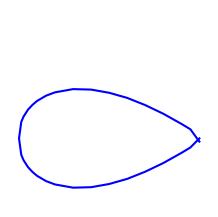

airfoils_img/m1.png
data_airfoils/m10.txt


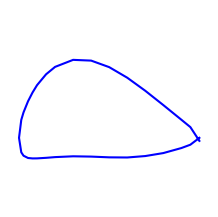

airfoils_img/m10.png
data_airfoils/m11.txt


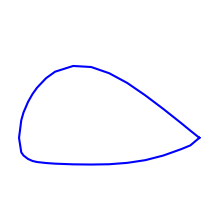

airfoils_img/m11.png
data_airfoils/m12.txt


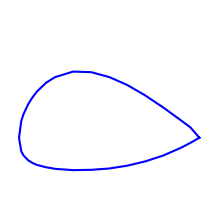

airfoils_img/m12.png
data_airfoils/m13.txt


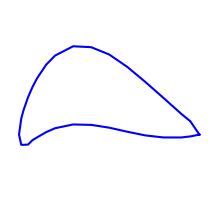

airfoils_img/m13.png
data_airfoils/m14.txt


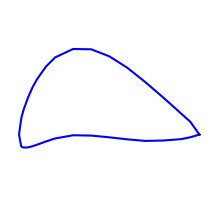

airfoils_img/m14.png
data_airfoils/m15.txt


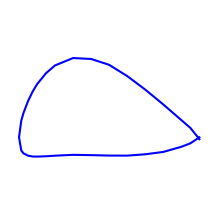

airfoils_img/m15.png
data_airfoils/m16.txt


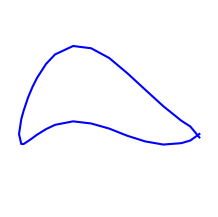

airfoils_img/m16.png
data_airfoils/m17.txt


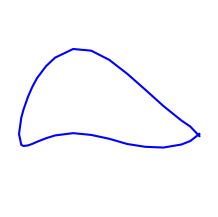

airfoils_img/m17.png
data_airfoils/m18.txt


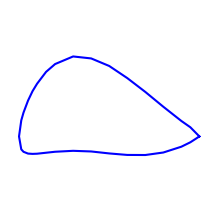

airfoils_img/m18.png
data_airfoils/m19.txt


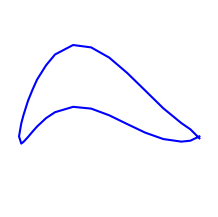

airfoils_img/m19.png
data_airfoils/m2.txt


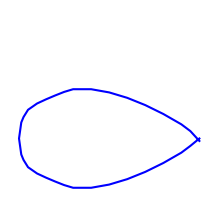

airfoils_img/m2.png
data_airfoils/m20.txt


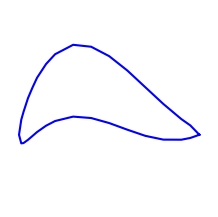

airfoils_img/m20.png
data_airfoils/m21.txt


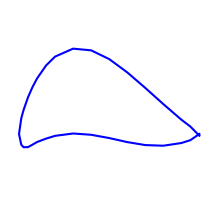

airfoils_img/m21.png
data_airfoils/m22.txt


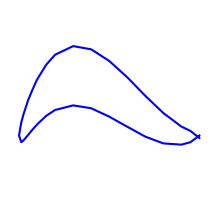

airfoils_img/m22.png
data_airfoils/m23.txt


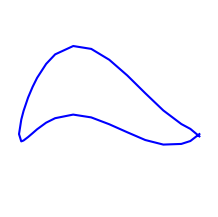

airfoils_img/m23.png
data_airfoils/m24.txt


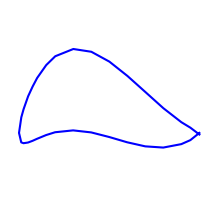

airfoils_img/m24.png
data_airfoils/m25.txt


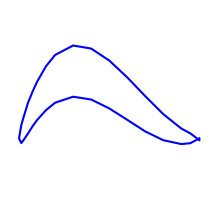

airfoils_img/m25.png
data_airfoils/m26.txt


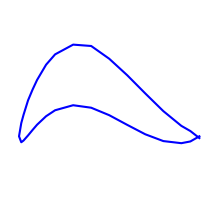

airfoils_img/m26.png
data_airfoils/m27.txt


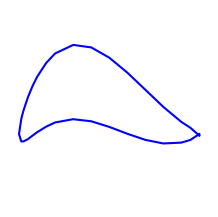

airfoils_img/m27.png
data_airfoils/m3.txt


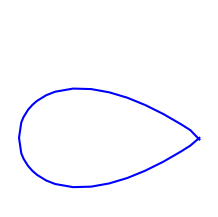

airfoils_img/m3.png
data_airfoils/m4.txt


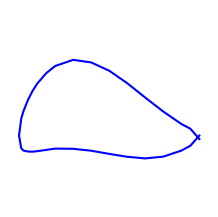

airfoils_img/m4.png
data_airfoils/m5.txt


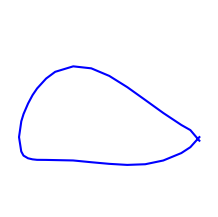

airfoils_img/m5.png
data_airfoils/m6.txt


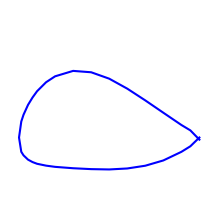

airfoils_img/m6.png
data_airfoils/m665.txt


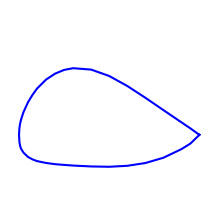

airfoils_img/m665.png
data_airfoils/m685.txt


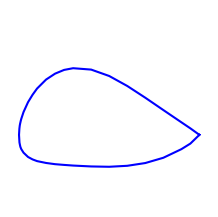

airfoils_img/m685.png
data_airfoils/m7.txt


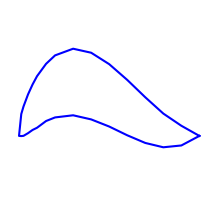

airfoils_img/m7.png
data_airfoils/m8.txt


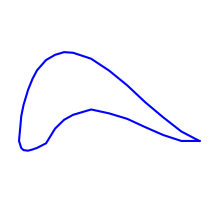

airfoils_img/m8.png
data_airfoils/m9.txt


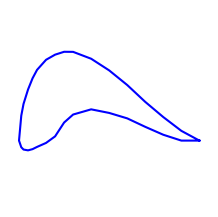

airfoils_img/m9.png
data_airfoils/ma409.txt


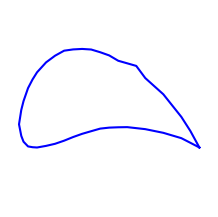

airfoils_img/ma409.png
data_airfoils/ma409sm.txt


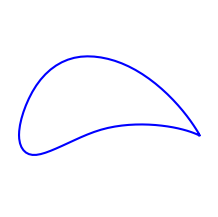

airfoils_img/ma409sm.png
data_airfoils/marsden.txt


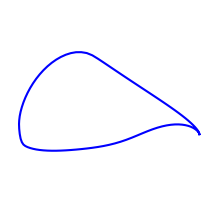

airfoils_img/marsden.png
data_airfoils/marske1.txt


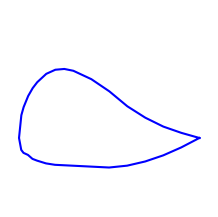

airfoils_img/marske1.png
data_airfoils/marske2.txt


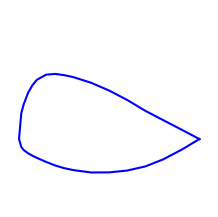

airfoils_img/marske2.png
data_airfoils/marske3.txt


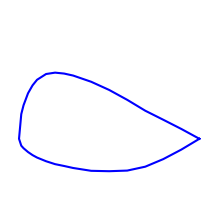

airfoils_img/marske3.png
data_airfoils/marske4.txt


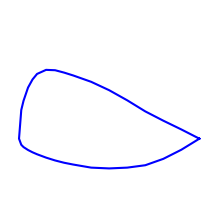

airfoils_img/marske4.png
data_airfoils/marske5.txt


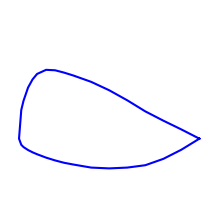

airfoils_img/marske5.png
data_airfoils/marske7.txt


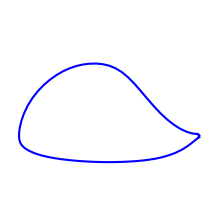

airfoils_img/marske7.png
data_airfoils/mb253515sm.txt


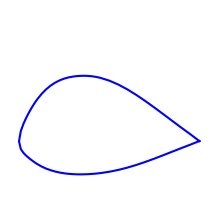

airfoils_img/mb253515sm.png
data_airfoils/mh102.txt


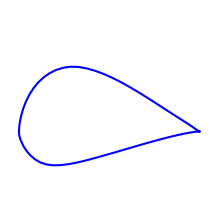

airfoils_img/mh102.png
data_airfoils/mh104.txt


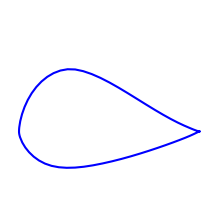

airfoils_img/mh104.png
data_airfoils/mh106.txt


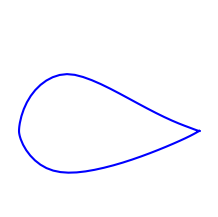

airfoils_img/mh106.png
data_airfoils/mh108.txt


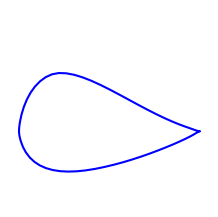

airfoils_img/mh108.png
data_airfoils/mh110.txt


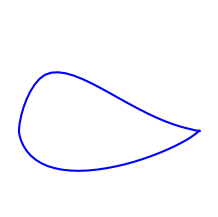

airfoils_img/mh110.png
data_airfoils/mh112.txt


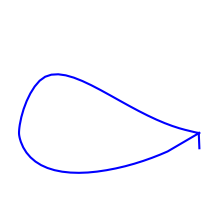

airfoils_img/mh112.png
data_airfoils/mh113.txt


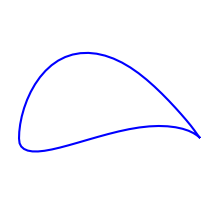

airfoils_img/mh113.png
data_airfoils/mh114.txt


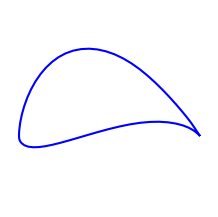

airfoils_img/mh114.png
data_airfoils/mh115.txt


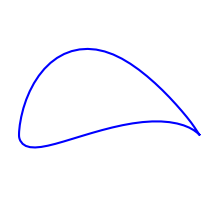

airfoils_img/mh115.png
data_airfoils/mh116.txt


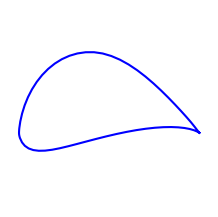

airfoils_img/mh116.png
data_airfoils/mh117.txt


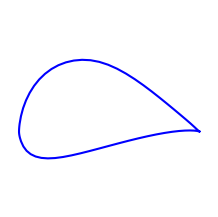

airfoils_img/mh117.png
data_airfoils/mh120.txt


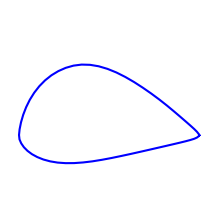

airfoils_img/mh120.png
data_airfoils/mh121.txt


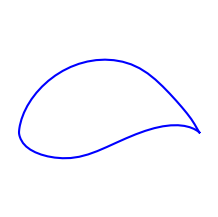

airfoils_img/mh121.png
data_airfoils/mh122.txt


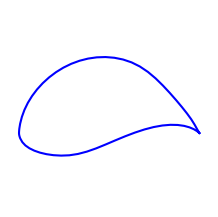

airfoils_img/mh122.png
data_airfoils/mh150.txt


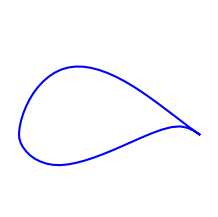

airfoils_img/mh150.png
data_airfoils/mh18.txt


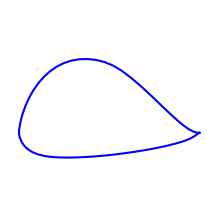

airfoils_img/mh18.png
data_airfoils/mh20.txt


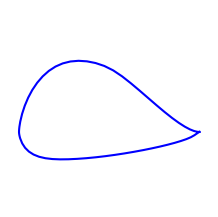

airfoils_img/mh20.png
data_airfoils/mh200.txt


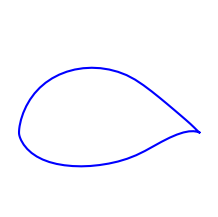

airfoils_img/mh200.png
data_airfoils/mh201.txt


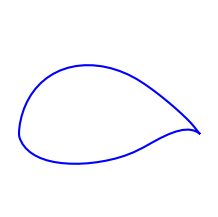

airfoils_img/mh201.png
data_airfoils/mh22.txt


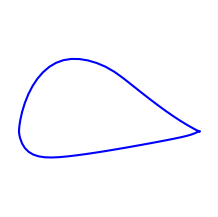

airfoils_img/mh22.png
data_airfoils/mh23.txt


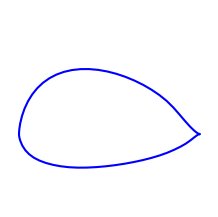

airfoils_img/mh23.png
data_airfoils/mh24.txt


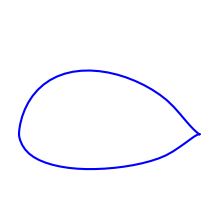

airfoils_img/mh24.png
data_airfoils/mh25.txt


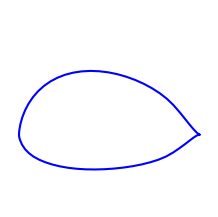

airfoils_img/mh25.png
data_airfoils/mh26.txt


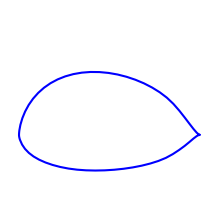

airfoils_img/mh26.png
data_airfoils/mh27.txt


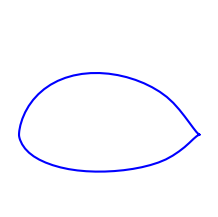

airfoils_img/mh27.png
data_airfoils/mh30.txt


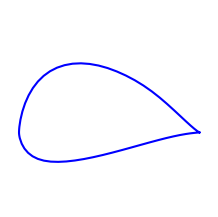

airfoils_img/mh30.png
data_airfoils/mh32.txt


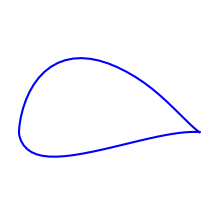

airfoils_img/mh32.png
data_airfoils/mh38.txt


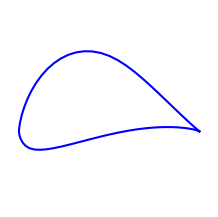

airfoils_img/mh38.png
data_airfoils/mh42.txt


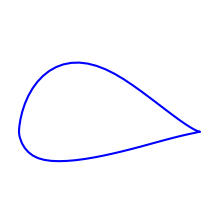

airfoils_img/mh42.png
data_airfoils/mh43.txt


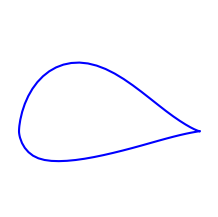

airfoils_img/mh43.png
data_airfoils/mh44.txt


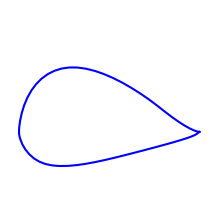

airfoils_img/mh44.png
data_airfoils/mh45.txt


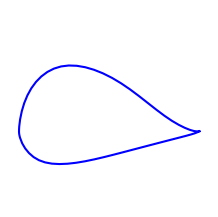

airfoils_img/mh45.png
data_airfoils/mh46.txt


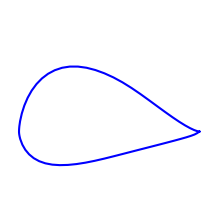

airfoils_img/mh46.png
data_airfoils/mh49.txt


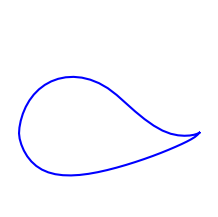

airfoils_img/mh49.png
data_airfoils/mh60.txt


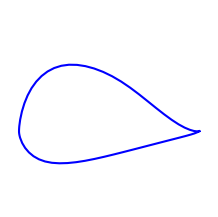

airfoils_img/mh60.png
data_airfoils/mh61.txt


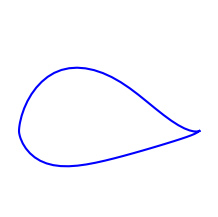

airfoils_img/mh61.png
data_airfoils/mh62.txt


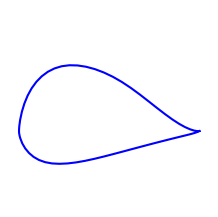

airfoils_img/mh62.png
data_airfoils/mh64.txt


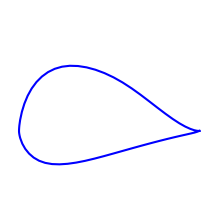

airfoils_img/mh64.png
data_airfoils/mh70.txt


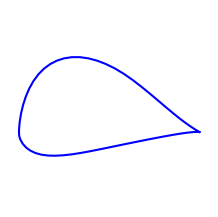

airfoils_img/mh70.png
data_airfoils/mh78.txt


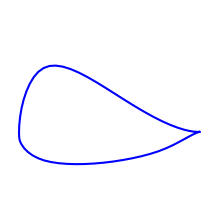

airfoils_img/mh78.png
data_airfoils/mh80.txt


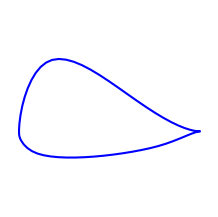

airfoils_img/mh80.png
data_airfoils/mh81.txt


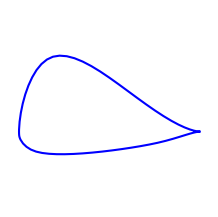

airfoils_img/mh81.png
data_airfoils/mh82.txt


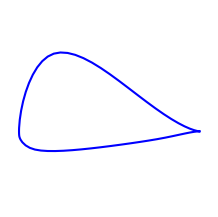

airfoils_img/mh82.png
data_airfoils/mh83.txt


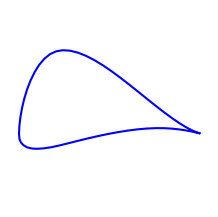

airfoils_img/mh83.png
data_airfoils/mh84.txt


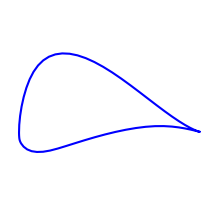

airfoils_img/mh84.png
data_airfoils/mh91.txt


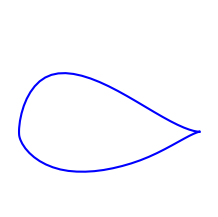

airfoils_img/mh91.png
data_airfoils/mh92.txt


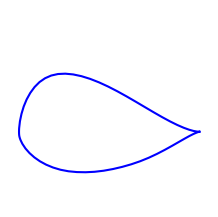

airfoils_img/mh92.png
data_airfoils/mh93.txt


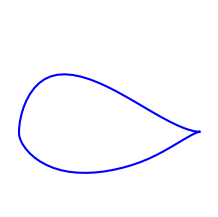

airfoils_img/mh93.png
data_airfoils/mh94.txt


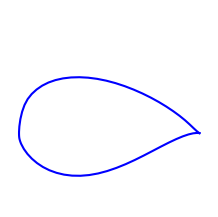

airfoils_img/mh94.png
data_airfoils/mh95.txt


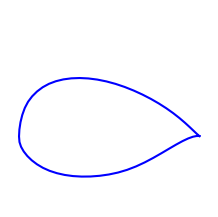

airfoils_img/mh95.png
data_airfoils/miley.txt


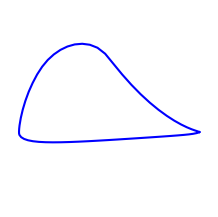

airfoils_img/miley.png
data_airfoils/mrc-16.txt


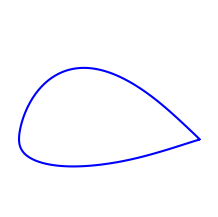

airfoils_img/mrc-16.png
data_airfoils/mrc-20.txt


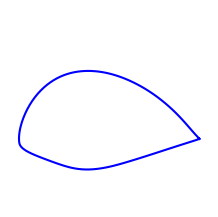

airfoils_img/mrc-20.png
data_airfoils/ms313.txt


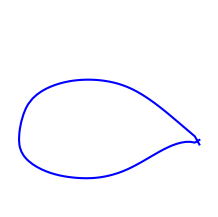

airfoils_img/ms313.png
data_airfoils/ms317.txt


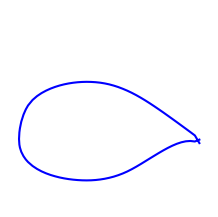

airfoils_img/ms317.png
data_airfoils/mue139.txt


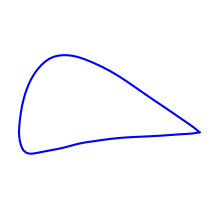

airfoils_img/mue139.png
data_airfoils/n0009sm.txt


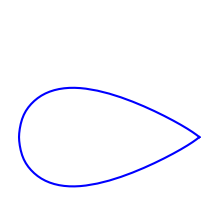

airfoils_img/n0009sm.png
data_airfoils/n0011sc.txt


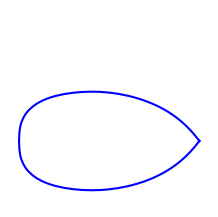

airfoils_img/n0011sc.png
data_airfoils/n0012.txt


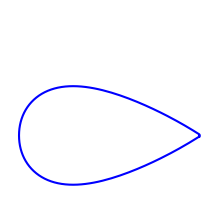

airfoils_img/n0012.png
data_airfoils/n10.txt


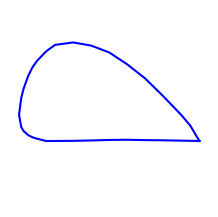

airfoils_img/n10.png
data_airfoils/n11.txt


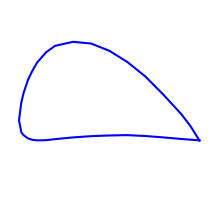

airfoils_img/n11.png
data_airfoils/n11h9.txt


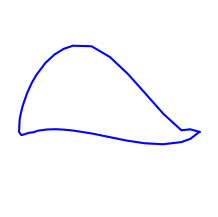

airfoils_img/n11h9.png
data_airfoils/n12.txt


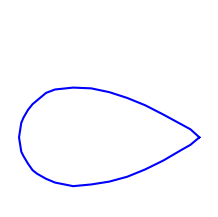

airfoils_img/n12.png
data_airfoils/n13.txt


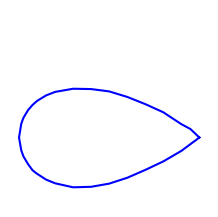

airfoils_img/n13.png
data_airfoils/n14.txt


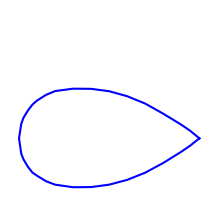

airfoils_img/n14.png
data_airfoils/n1h15.txt


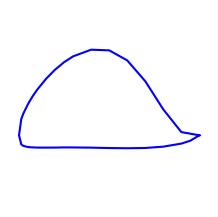

airfoils_img/n1h15.png
data_airfoils/n22.txt


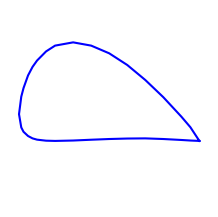

airfoils_img/n22.png
data_airfoils/n24.txt


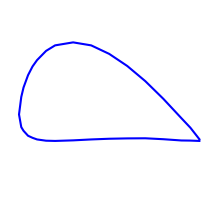

airfoils_img/n24.png
data_airfoils/n2414.txt


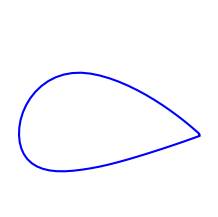

airfoils_img/n2414.png
data_airfoils/n2415.txt


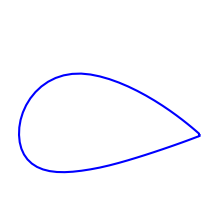

airfoils_img/n2415.png
data_airfoils/n2h15.txt


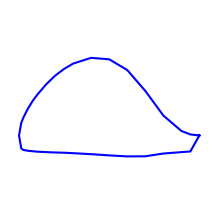

airfoils_img/n2h15.png
data_airfoils/n5h10.txt


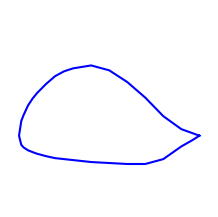

airfoils_img/n5h10.png
data_airfoils/n5h15.txt


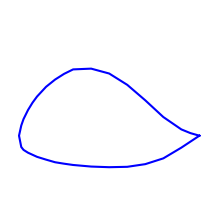

airfoils_img/n5h15.png
data_airfoils/n5h20.txt


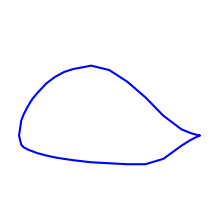

airfoils_img/n5h20.png
data_airfoils/n63010a.txt


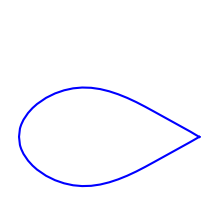

airfoils_img/n63010a.png
data_airfoils/n63012a.txt


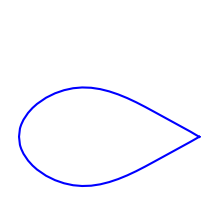

airfoils_img/n63012a.png
data_airfoils/n63015a.txt


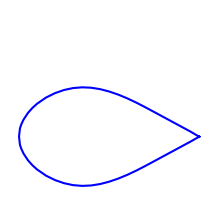

airfoils_img/n63015a.png
data_airfoils/n63210.txt


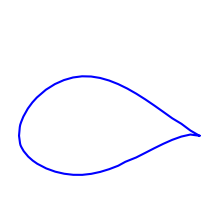

airfoils_img/n63210.png
data_airfoils/n63212.txt


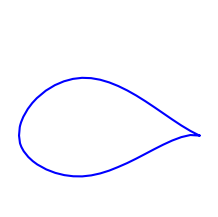

airfoils_img/n63212.png
data_airfoils/n63215.txt


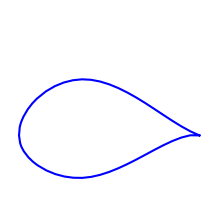

airfoils_img/n63215.png
data_airfoils/n63215b.txt


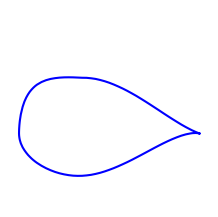

airfoils_img/n63215b.png
data_airfoils/n63412.txt


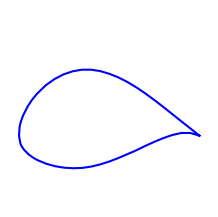

airfoils_img/n63412.png
data_airfoils/n63415.txt


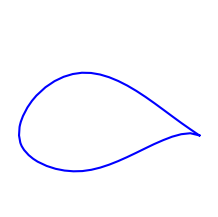

airfoils_img/n63415.png
data_airfoils/n64008a.txt


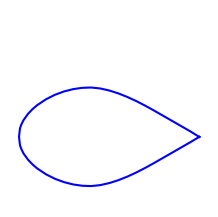

airfoils_img/n64008a.png
data_airfoils/n64012.txt


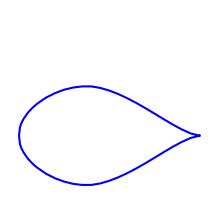

airfoils_img/n64012.png
data_airfoils/n64012a.txt


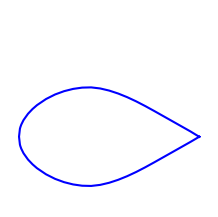

airfoils_img/n64012a.png
data_airfoils/n64015.txt


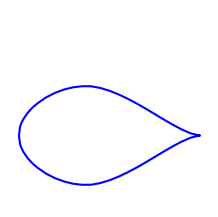

airfoils_img/n64015.png
data_airfoils/n64015a.txt


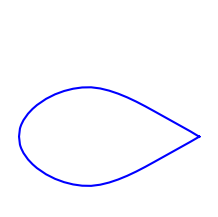

airfoils_img/n64015a.png
data_airfoils/n6409.txt


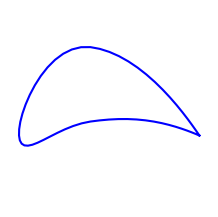

airfoils_img/n6409.png
data_airfoils/n64108.txt


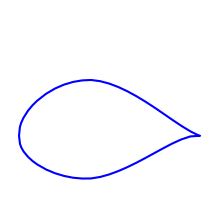

airfoils_img/n64108.png
data_airfoils/n64110.txt


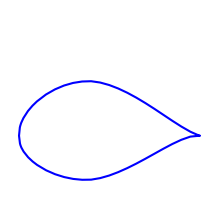

airfoils_img/n64110.png
data_airfoils/n64212.txt


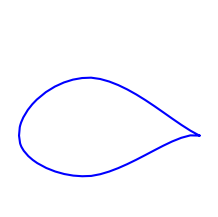

airfoils_img/n64212.png
data_airfoils/n64212ma.txt


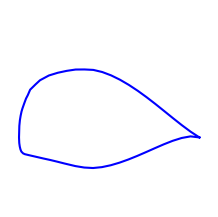

airfoils_img/n64212ma.png
data_airfoils/n64212mb.txt


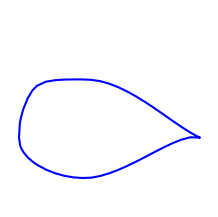

airfoils_img/n64212mb.png
data_airfoils/n64215.txt


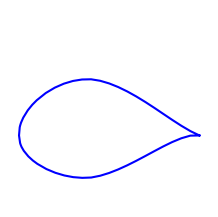

airfoils_img/n64215.png
data_airfoils/n642415.txt


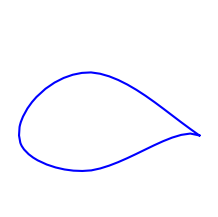

airfoils_img/n642415.png
data_airfoils/n66021.txt


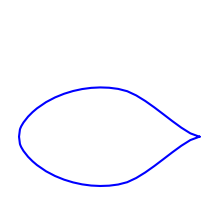

airfoils_img/n66021.png
data_airfoils/n6h10.txt


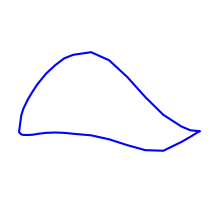

airfoils_img/n6h10.png
data_airfoils/n6h15.txt


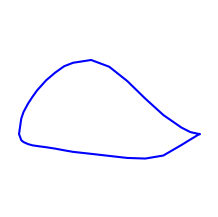

airfoils_img/n6h15.png
data_airfoils/n6h20.txt


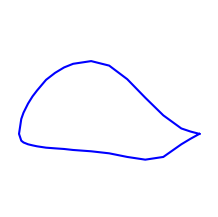

airfoils_img/n6h20.png
data_airfoils/n8h12.txt


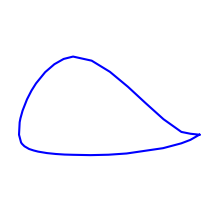

airfoils_img/n8h12.png
data_airfoils/n9.txt


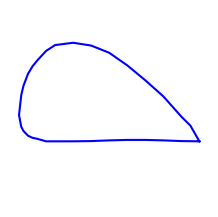

airfoils_img/n9.png
data_airfoils/naca0006.txt


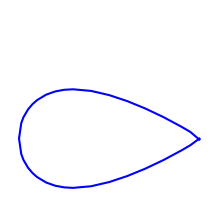

airfoils_img/naca0006.png
data_airfoils/naca0008.txt


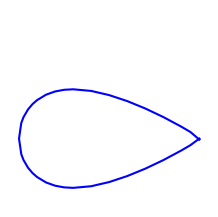

airfoils_img/naca0008.png
data_airfoils/naca000834.txt


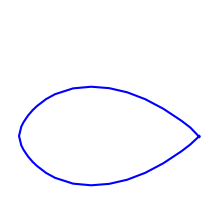

airfoils_img/naca000834.png
data_airfoils/NACA0009.txt


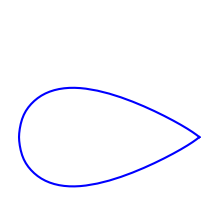

airfoils_img/NACA0009.png
data_airfoils/naca0010.txt


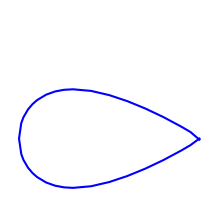

airfoils_img/naca0010.png
data_airfoils/naca001034.txt


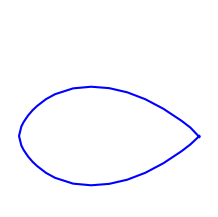

airfoils_img/naca001034.png
data_airfoils/naca001034a08cli0.2.txt


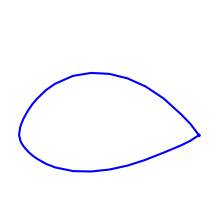

airfoils_img/naca001034a08cli0.2.png
data_airfoils/naca001035.txt


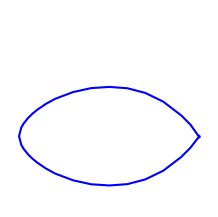

airfoils_img/naca001035.png
data_airfoils/naca001064.txt


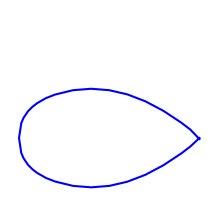

airfoils_img/naca001064.png
data_airfoils/naca001065.txt


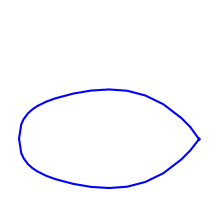

airfoils_img/naca001065.png
data_airfoils/naca001066.txt


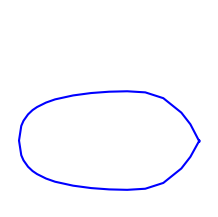

airfoils_img/naca001066.png
data_airfoils/NACA0011.txt


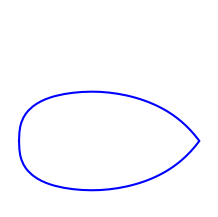

airfoils_img/NACA0011.png
data_airfoils/NACA0012.txt


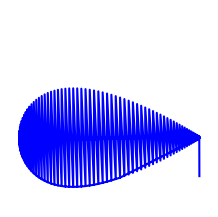

airfoils_img/NACA0012.png
data_airfoils/naca001234.txt


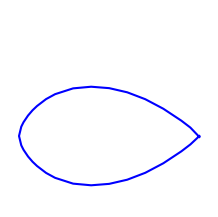

airfoils_img/naca001234.png
data_airfoils/naca001264.txt


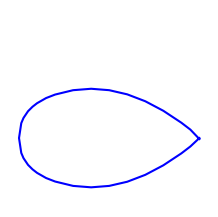

airfoils_img/naca001264.png
data_airfoils/naca001264a08cli0.2.txt


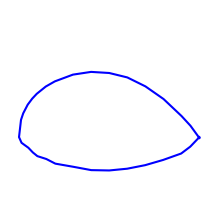

airfoils_img/naca001264a08cli0.2.png
data_airfoils/naca0015.txt


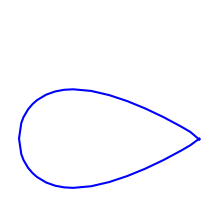

airfoils_img/naca0015.png
data_airfoils/naca0018.txt


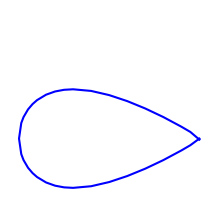

airfoils_img/naca0018.png
data_airfoils/naca0021.txt


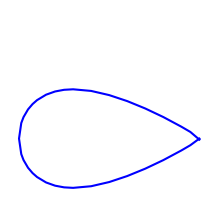

airfoils_img/naca0021.png
data_airfoils/naca0024.txt


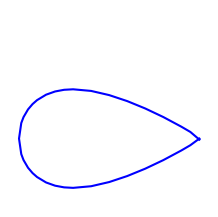

airfoils_img/naca0024.png
data_airfoils/naca1.txt


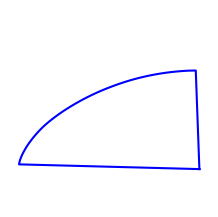

airfoils_img/naca1.png
data_airfoils/naca1408.txt


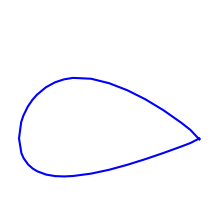

airfoils_img/naca1408.png
data_airfoils/NACA1410.txt


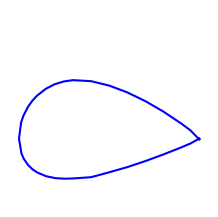

airfoils_img/NACA1410.png
data_airfoils/NACA1412.txt


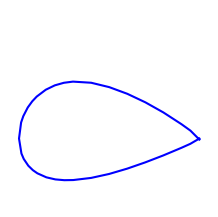

airfoils_img/NACA1412.png
data_airfoils/naca16006.txt


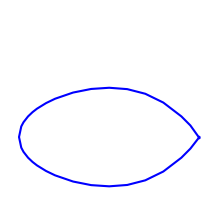

airfoils_img/naca16006.png
data_airfoils/naca16009.txt


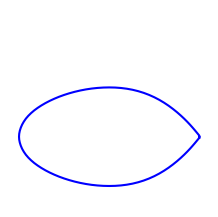

airfoils_img/naca16009.png
data_airfoils/naca16012.txt


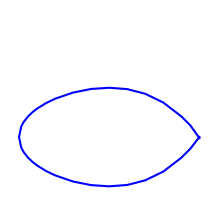

airfoils_img/naca16012.png
data_airfoils/naca16015.txt


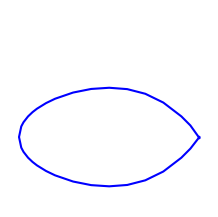

airfoils_img/naca16015.png
data_airfoils/naca16018.txt


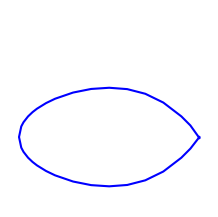

airfoils_img/naca16018.png
data_airfoils/naca16021.txt


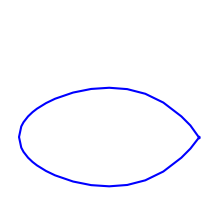

airfoils_img/naca16021.png
data_airfoils/naca23012.txt


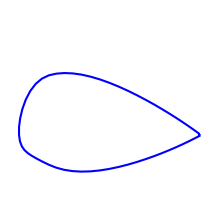

airfoils_img/naca23012.png
data_airfoils/naca23015.txt


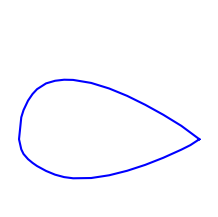

airfoils_img/naca23015.png
data_airfoils/naca23018.txt


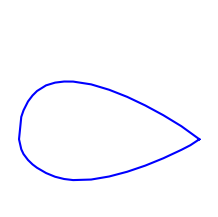

airfoils_img/naca23018.png
data_airfoils/naca23021.txt


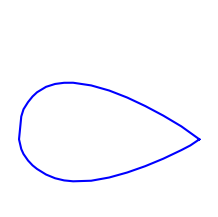

airfoils_img/naca23021.png
data_airfoils/naca23024.txt


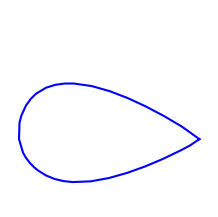

airfoils_img/naca23024.png
data_airfoils/NACA2408.txt


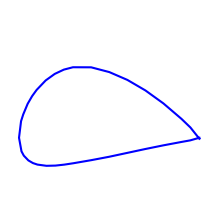

airfoils_img/NACA2408.png
data_airfoils/NACA2410.txt


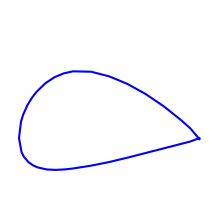

airfoils_img/NACA2410.png
data_airfoils/NACA2411.txt


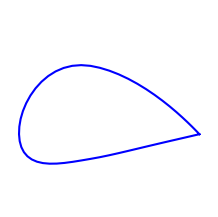

airfoils_img/NACA2411.png
data_airfoils/naca2412.txt


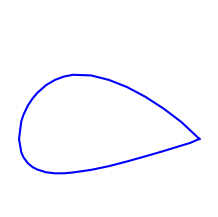

airfoils_img/naca2412.png
data_airfoils/NACA2414.txt


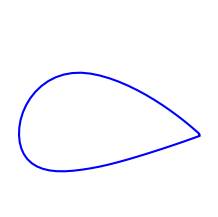

airfoils_img/NACA2414.png
data_airfoils/naca2415.txt


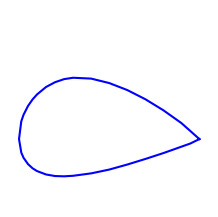

airfoils_img/naca2415.png
data_airfoils/naca2418.txt


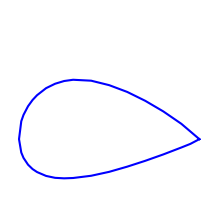

airfoils_img/naca2418.png
data_airfoils/naca2421.txt


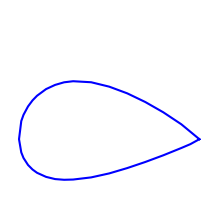

airfoils_img/naca2421.png
data_airfoils/NACA2424.txt


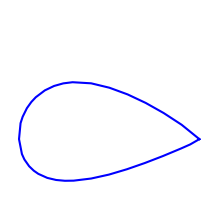

airfoils_img/NACA2424.png
data_airfoils/NACA4412.txt


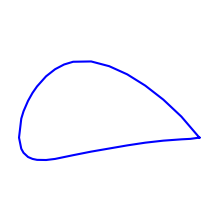

airfoils_img/NACA4412.png
data_airfoils/NACA4415.txt


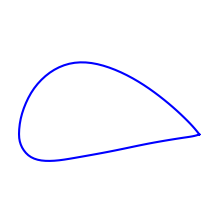

airfoils_img/NACA4415.png
data_airfoils/NACA4418.txt


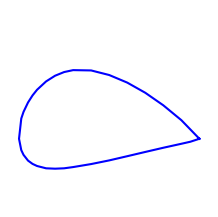

airfoils_img/NACA4418.png
data_airfoils/naca4421.txt


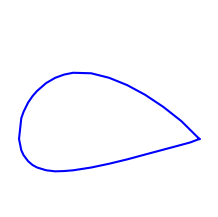

airfoils_img/naca4421.png
data_airfoils/naca4424.txt


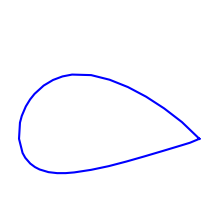

airfoils_img/naca4424.png
data_airfoils/naca63206.txt


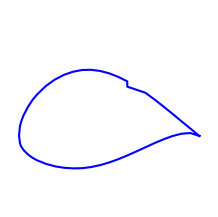

airfoils_img/naca63206.png
data_airfoils/naca63209.txt


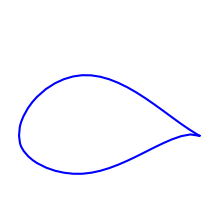

airfoils_img/naca63209.png
data_airfoils/naca632615.txt


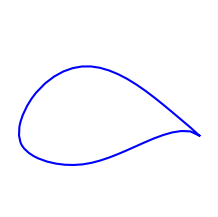

airfoils_img/naca632615.png
data_airfoils/naca632a015.txt


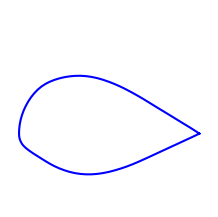

airfoils_img/naca632a015.png
data_airfoils/naca633018.txt


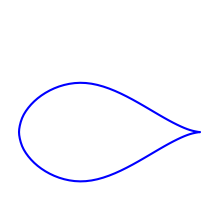

airfoils_img/naca633018.png
data_airfoils/naca633218.txt


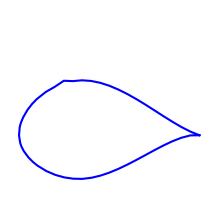

airfoils_img/naca633218.png
data_airfoils/naca633418.txt


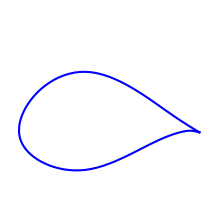

airfoils_img/naca633418.png
data_airfoils/naca633618.txt


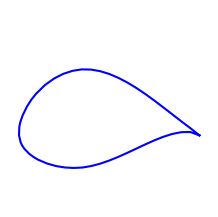

airfoils_img/naca633618.png
data_airfoils/NACA63415.txt


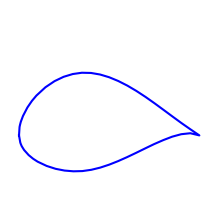

airfoils_img/NACA63415.png
data_airfoils/naca634221.txt


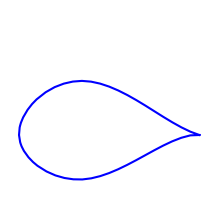

airfoils_img/naca634221.png
data_airfoils/naca634421.txt


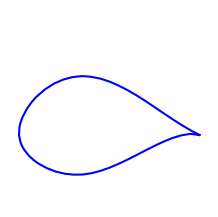

airfoils_img/naca634421.png
data_airfoils/naca63a210.txt


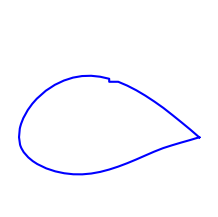

airfoils_img/naca63a210.png
data_airfoils/NACA6409.txt


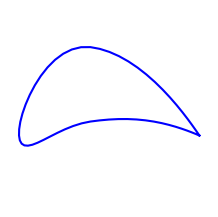

airfoils_img/NACA6409.png
data_airfoils/naca641112.txt


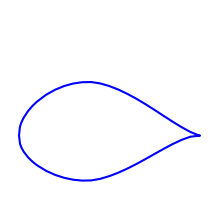

airfoils_img/naca641112.png
data_airfoils/NACA6412.txt


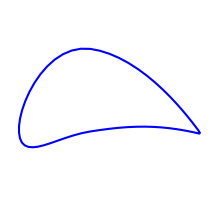

airfoils_img/NACA6412.png
data_airfoils/naca64206.txt


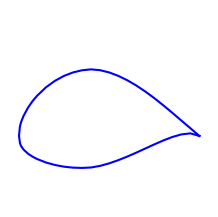

airfoils_img/naca64206.png
data_airfoils/naca64208.txt


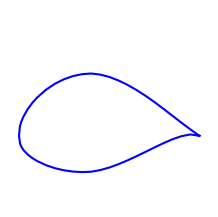

airfoils_img/naca64208.png
data_airfoils/naca64209.txt


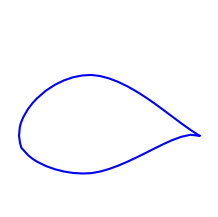

airfoils_img/naca64209.png
data_airfoils/naca64210.txt


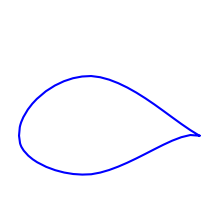

airfoils_img/naca64210.png
data_airfoils/NACA64215.txt


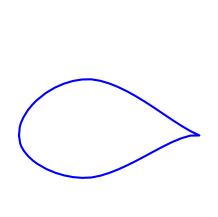

airfoils_img/NACA64215.png
data_airfoils/naca642215.txt


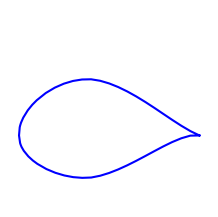

airfoils_img/naca642215.png
data_airfoils/naca642415.txt


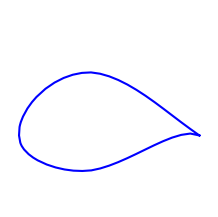

airfoils_img/naca642415.png
data_airfoils/naca643218.txt


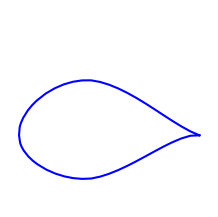

airfoils_img/naca643218.png
data_airfoils/naca643418.txt


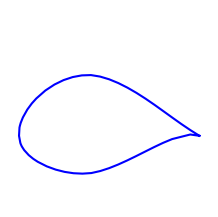

airfoils_img/naca643418.png
data_airfoils/naca643618.txt


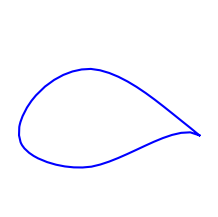

airfoils_img/naca643618.png
data_airfoils/naca644221.txt


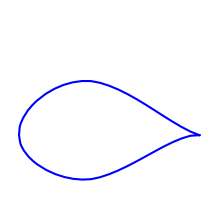

airfoils_img/naca644221.png
data_airfoils/naca644421.txt


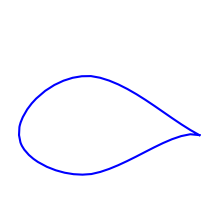

airfoils_img/naca644421.png
data_airfoils/naca64a010.txt


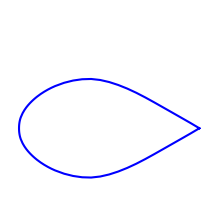

airfoils_img/naca64a010.png
data_airfoils/naca64a210.txt


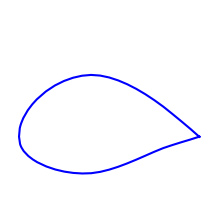

airfoils_img/naca64a210.png
data_airfoils/naca64a410.txt


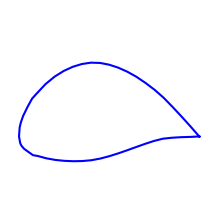

airfoils_img/naca64a410.png
data_airfoils/naca651212.txt


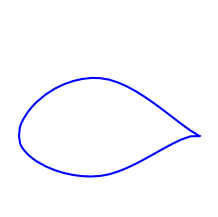

airfoils_img/naca651212.png
data_airfoils/naca651212a06.txt


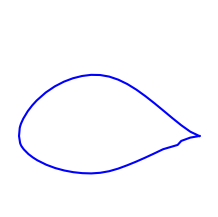

airfoils_img/naca651212a06.png
data_airfoils/naca651412.txt


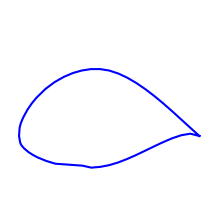

airfoils_img/naca651412.png
data_airfoils/NACA65206.txt


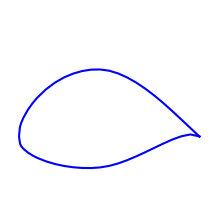

airfoils_img/NACA65206.png
data_airfoils/NACA65209.txt


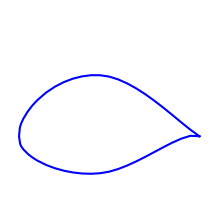

airfoils_img/NACA65209.png
data_airfoils/NACA65210.txt


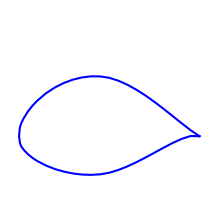

airfoils_img/NACA65210.png
data_airfoils/NACA65212.txt


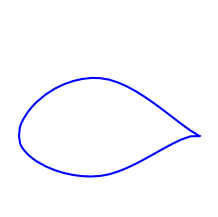

airfoils_img/NACA65212.png
data_airfoils/NACA65215.txt


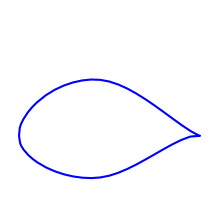

airfoils_img/NACA65215.png
data_airfoils/NACA65221.txt


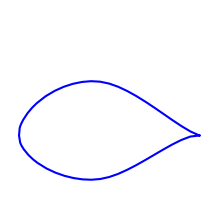

airfoils_img/NACA65221.png
data_airfoils/naca652215.txt


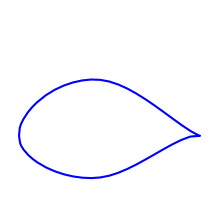

airfoils_img/naca652215.png
data_airfoils/naca652415.txt


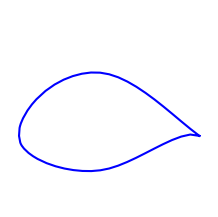

airfoils_img/naca652415.png
data_airfoils/naca652415a05.txt


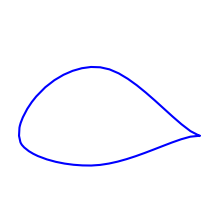

airfoils_img/naca652415a05.png
data_airfoils/naca653218.txt


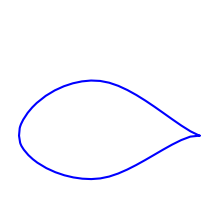

airfoils_img/naca653218.png
data_airfoils/naca65410.txt


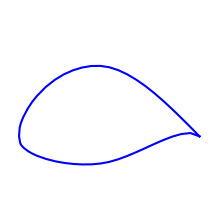

airfoils_img/naca65410.png
data_airfoils/NACA65412.txt


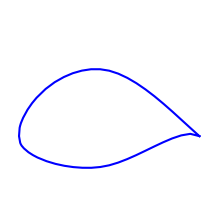

airfoils_img/NACA65412.png
data_airfoils/NACA65421.txt


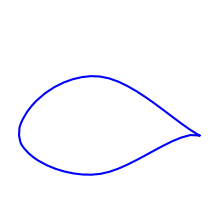

airfoils_img/NACA65421.png
data_airfoils/naca654221.txt


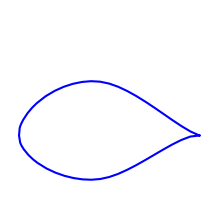

airfoils_img/naca654221.png
data_airfoils/naca654421.txt


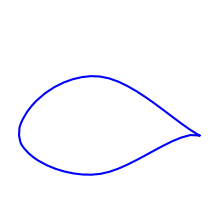

airfoils_img/naca654421.png
data_airfoils/naca654421a05.txt


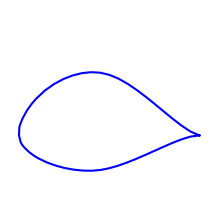

airfoils_img/naca654421a05.png
data_airfoils/NACA65618.txt


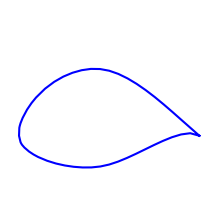

airfoils_img/NACA65618.png
data_airfoils/naca66-018.txt


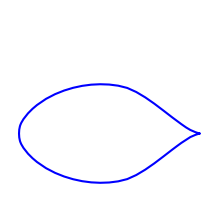

airfoils_img/naca66-018.png
data_airfoils/naca661212.txt


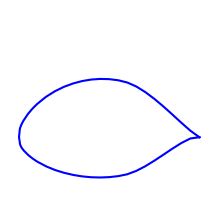

airfoils_img/naca661212.png
data_airfoils/naca66206.txt


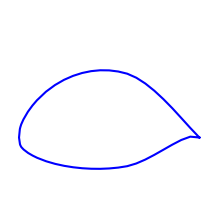

airfoils_img/naca66206.png
data_airfoils/naca66209.txt


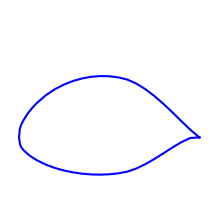

airfoils_img/naca66209.png
data_airfoils/naca66210.txt


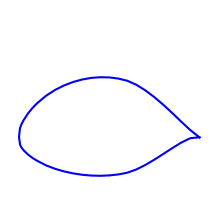

airfoils_img/naca66210.png
data_airfoils/naca662215.txt


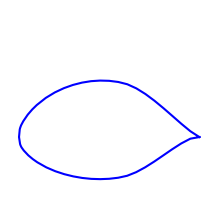

airfoils_img/naca662215.png
data_airfoils/naca662415.txt


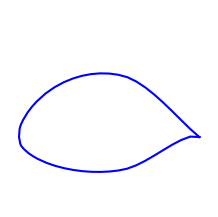

airfoils_img/naca662415.png
data_airfoils/naca663218.txt


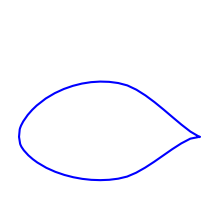

airfoils_img/naca663218.png
data_airfoils/naca663418.txt


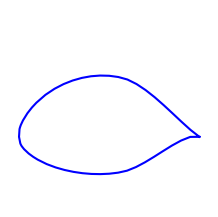

airfoils_img/naca663418.png
data_airfoils/naca664221.txt


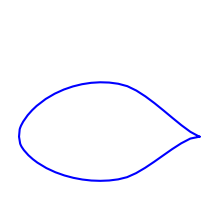

airfoils_img/naca664221.png
data_airfoils/naca671215.txt


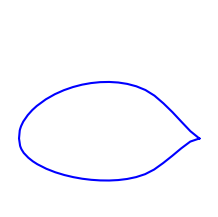

airfoils_img/naca671215.png
data_airfoils/naca747a315.txt


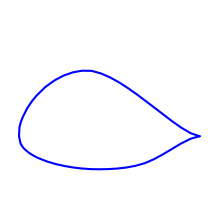

airfoils_img/naca747a315.png
data_airfoils/naca747a415.txt


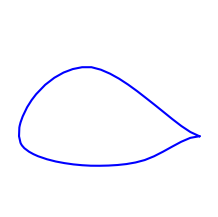

airfoils_img/naca747a415.png
data_airfoils/nacacyh.txt


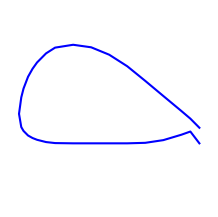

airfoils_img/nacacyh.png
data_airfoils/nacam12.txt


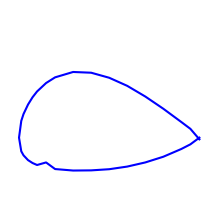

airfoils_img/nacam12.png
data_airfoils/nacam18.txt


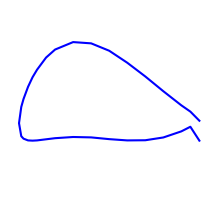

airfoils_img/nacam18.png
data_airfoils/nacam2.txt


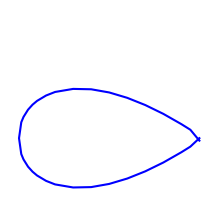

airfoils_img/nacam2.png
data_airfoils/nacam3.txt


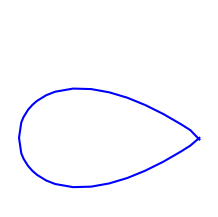

airfoils_img/nacam3.png
data_airfoils/nacam6.txt


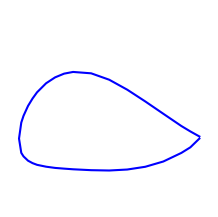

airfoils_img/nacam6.png
data_airfoils/nasasc2-0714.txt


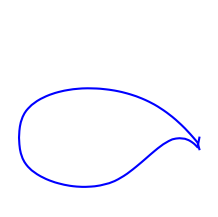

airfoils_img/nasasc2-0714.png
data_airfoils/ncambre.txt


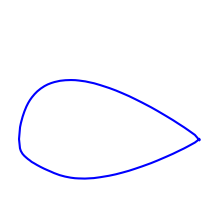

airfoils_img/ncambre.png
data_airfoils/nl722343.txt


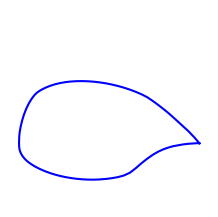

airfoils_img/nl722343.png
data_airfoils/nl722362.txt


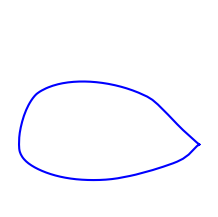

airfoils_img/nl722362.png
data_airfoils/nlf0115.txt


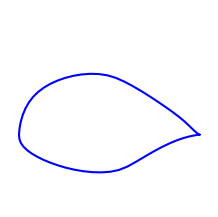

airfoils_img/nlf0115.png
data_airfoils/nlf0215f.txt


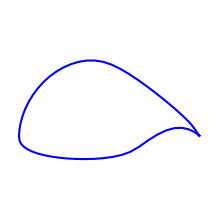

airfoils_img/nlf0215f.png
data_airfoils/nlf1015.txt


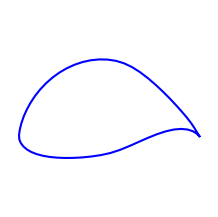

airfoils_img/nlf1015.png
data_airfoils/nlf414f.txt


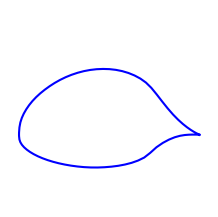

airfoils_img/nlf414f.png
data_airfoils/nlf415.txt


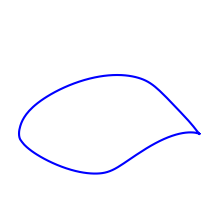

airfoils_img/nlf415.png
data_airfoils/nlf416.txt


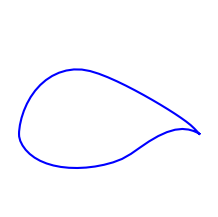

airfoils_img/nlf416.png
data_airfoils/nlr1t.txt


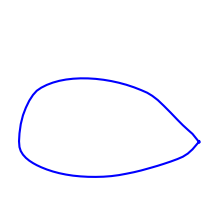

airfoils_img/nlr1t.png
data_airfoils/nlr7301.txt


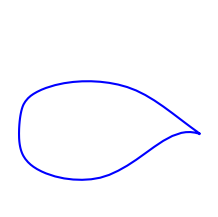

airfoils_img/nlr7301.png
data_airfoils/nn7mk20.txt


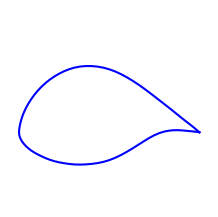

airfoils_img/nn7mk20.png
data_airfoils/npl9510.txt


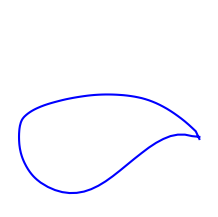

airfoils_img/npl9510.png
data_airfoils/npl9615.txt


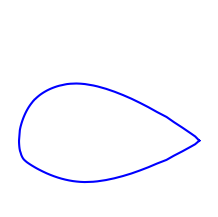

airfoils_img/npl9615.png
data_airfoils/npl9626.txt


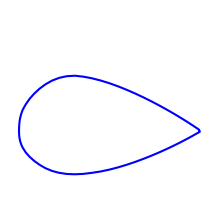

airfoils_img/npl9626.png
data_airfoils/npl9627.txt


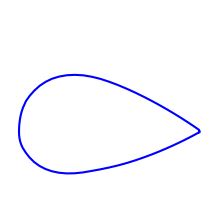

airfoils_img/npl9627.png
data_airfoils/npl9660.txt


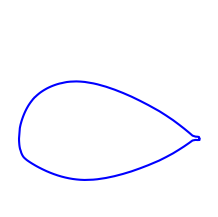

airfoils_img/npl9660.png
data_airfoils/nplx.txt


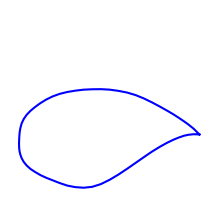

airfoils_img/nplx.png
data_airfoils/oa206.txt


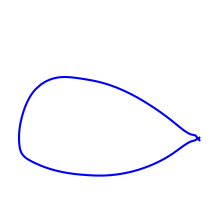

airfoils_img/oa206.png
data_airfoils/oa209.txt


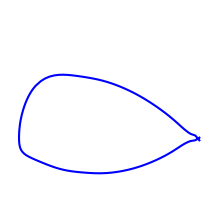

airfoils_img/oa209.png
data_airfoils/oa212.txt


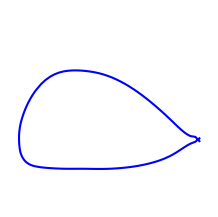

airfoils_img/oa212.png
data_airfoils/oa213.txt


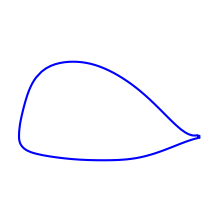

airfoils_img/oa213.png
data_airfoils/oaf095.txt


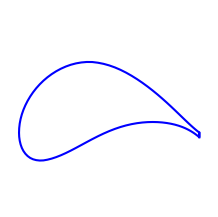

airfoils_img/oaf095.png
data_airfoils/oaf102.txt


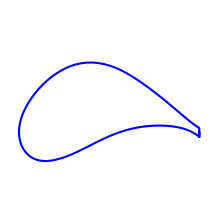

airfoils_img/oaf102.png
data_airfoils/oaf117.txt


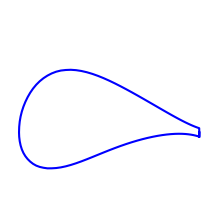

airfoils_img/oaf117.png
data_airfoils/oaf128.txt


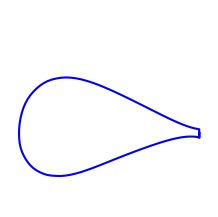

airfoils_img/oaf128.png
data_airfoils/oaf139.txt


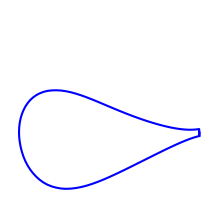

airfoils_img/oaf139.png
data_airfoils/p51droot.txt


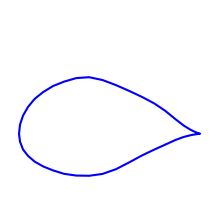

airfoils_img/p51droot.png
data_airfoils/p51dtip.txt


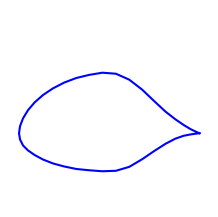

airfoils_img/p51dtip.png
data_airfoils/p51hroot.txt


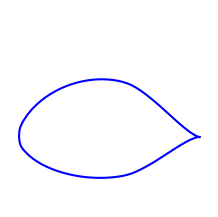

airfoils_img/p51hroot.png
data_airfoils/p51htip.txt


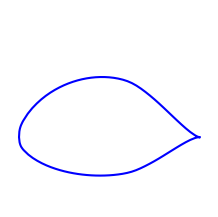

airfoils_img/p51htip.png
data_airfoils/pfcm.txt


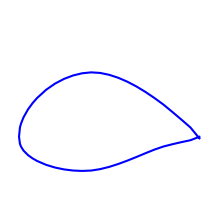

airfoils_img/pfcm.png
data_airfoils/pmc19sm.txt


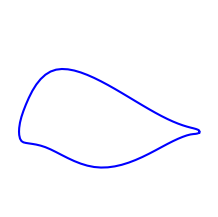

airfoils_img/pmc19sm.png
data_airfoils/psu-90-125wl.txt


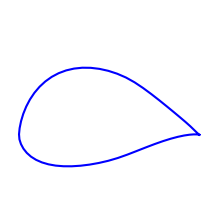

airfoils_img/psu-90-125wl.png
data_airfoils/psu94097.txt


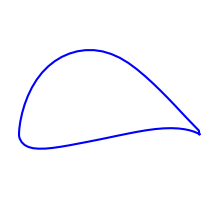

airfoils_img/psu94097.png
data_airfoils/pt40.txt


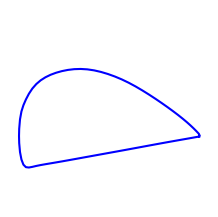

airfoils_img/pt40.png
data_airfoils/r1046.txt


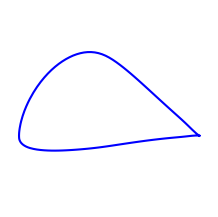

airfoils_img/r1046.png
data_airfoils/r1080.txt


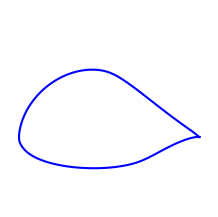

airfoils_img/r1080.png
data_airfoils/r1082.txt


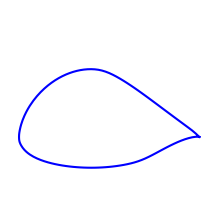

airfoils_img/r1082.png
data_airfoils/r1082t.txt


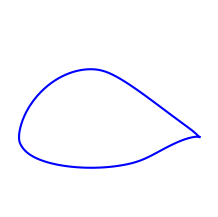

airfoils_img/r1082t.png
data_airfoils/r140.txt


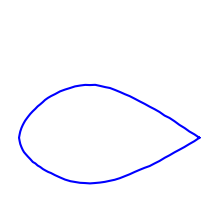

airfoils_img/r140.png
data_airfoils/r140sm.txt


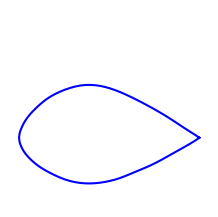

airfoils_img/r140sm.png
data_airfoils/rae100.txt


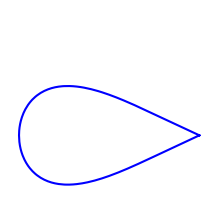

airfoils_img/rae100.png
data_airfoils/rae101.txt


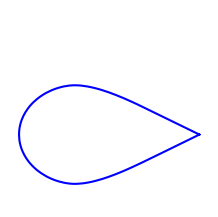

airfoils_img/rae101.png
data_airfoils/rae102.txt


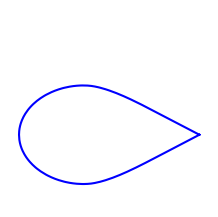

airfoils_img/rae102.png
data_airfoils/rae103.txt


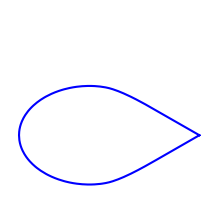

airfoils_img/rae103.png
data_airfoils/rae104.txt


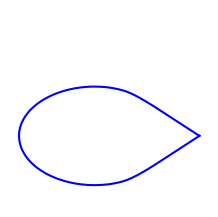

airfoils_img/rae104.png
data_airfoils/RAE2822.txt


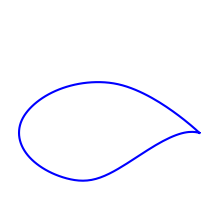

airfoils_img/RAE2822.png
data_airfoils/rae5212.txt


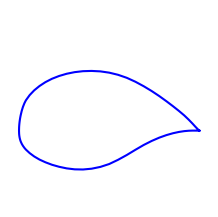

airfoils_img/rae5212.png
data_airfoils/rae5213.txt


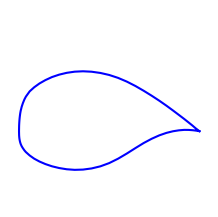

airfoils_img/rae5213.png
data_airfoils/rae5214.txt


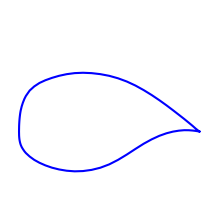

airfoils_img/rae5214.png
data_airfoils/rae5215.txt


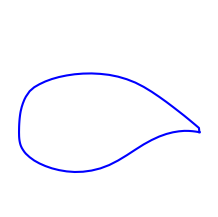

airfoils_img/rae5215.png
data_airfoils/rae69ck.txt


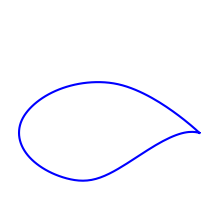

airfoils_img/rae69ck.png
data_airfoils/raf15.txt


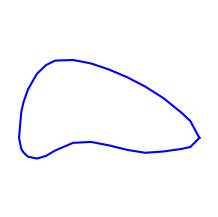

airfoils_img/raf15.png
data_airfoils/raf19.txt


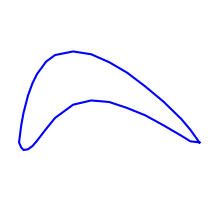

airfoils_img/raf19.png
data_airfoils/raf25.txt


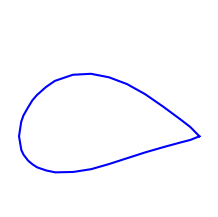

airfoils_img/raf25.png
data_airfoils/raf26.txt


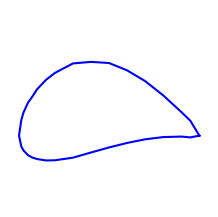

airfoils_img/raf26.png
data_airfoils/raf27.txt


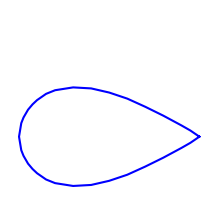

airfoils_img/raf27.png
data_airfoils/raf28.txt


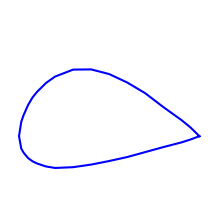

airfoils_img/raf28.png
data_airfoils/raf30.txt


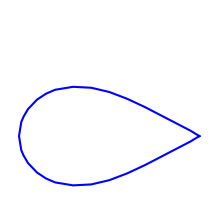

airfoils_img/raf30.png
data_airfoils/raf30md.txt


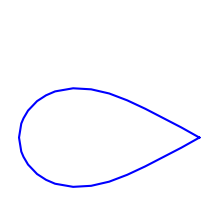

airfoils_img/raf30md.png
data_airfoils/raf31.txt


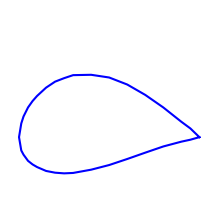

airfoils_img/raf31.png
data_airfoils/raf32.txt


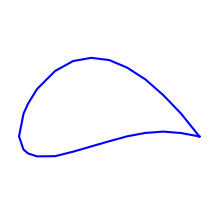

airfoils_img/raf32.png
data_airfoils/raf32md.txt


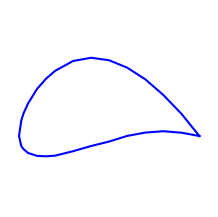

airfoils_img/raf32md.png
data_airfoils/raf33.txt


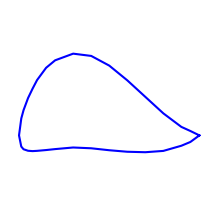

airfoils_img/raf33.png
data_airfoils/raf34.txt


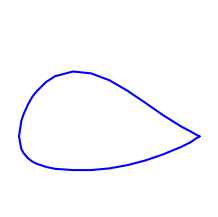

airfoils_img/raf34.png
data_airfoils/raf38.txt


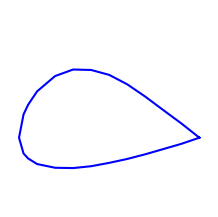

airfoils_img/raf38.png
data_airfoils/raf48.txt


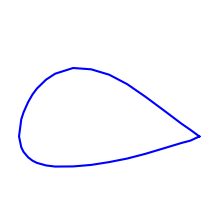

airfoils_img/raf48.png
data_airfoils/raf6.txt


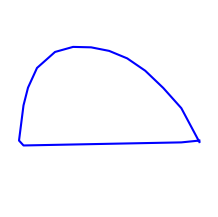

airfoils_img/raf6.png
data_airfoils/raf69.txt


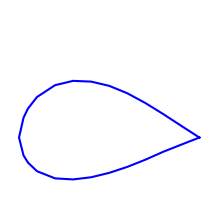

airfoils_img/raf69.png
data_airfoils/raf89.txt


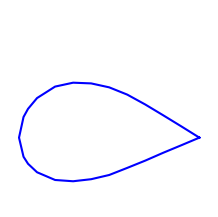

airfoils_img/raf89.png
data_airfoils/rc0864c.txt


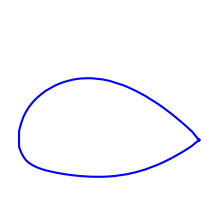

airfoils_img/rc0864c.png
data_airfoils/rc08b3.txt


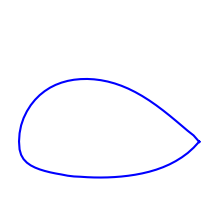

airfoils_img/rc08b3.png
data_airfoils/rc08n1.txt


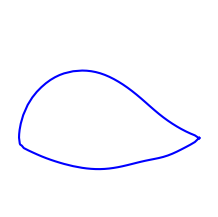

airfoils_img/rc08n1.png
data_airfoils/rc1064c.txt


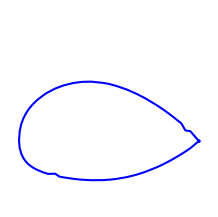

airfoils_img/rc1064c.png
data_airfoils/rc10b3.txt


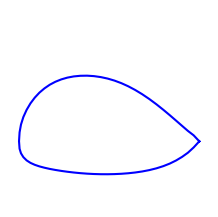

airfoils_img/rc10b3.png
data_airfoils/rc10n1.txt


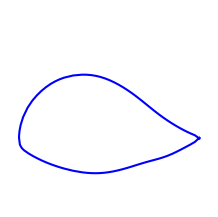

airfoils_img/rc10n1.png
data_airfoils/rc1264c.txt


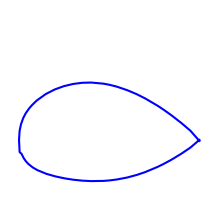

airfoils_img/rc1264c.png
data_airfoils/rc12b3.txt


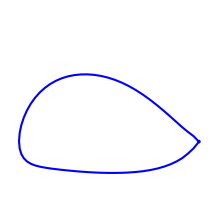

airfoils_img/rc12b3.png
data_airfoils/rc12n1.txt


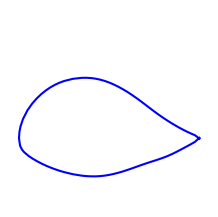

airfoils_img/rc12n1.png
data_airfoils/rc410.txt


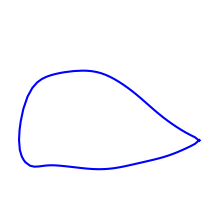

airfoils_img/rc410.png
data_airfoils/rc510.txt


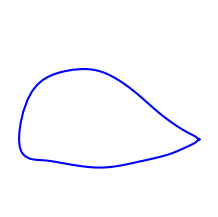

airfoils_img/rc510.png
data_airfoils/rcsc2.txt


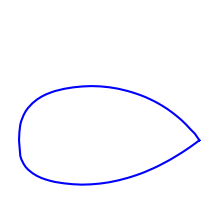

airfoils_img/rcsc2.png
data_airfoils/rg12.txt


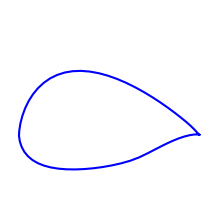

airfoils_img/rg12.png
data_airfoils/rg12a.txt


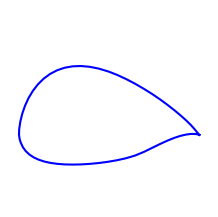

airfoils_img/rg12a.png
data_airfoils/rg12a189.txt


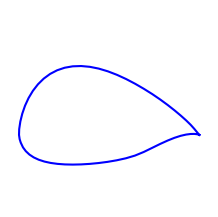

airfoils_img/rg12a189.png
data_airfoils/rg14.txt


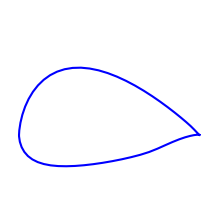

airfoils_img/rg14.png
data_airfoils/rg1410.txt


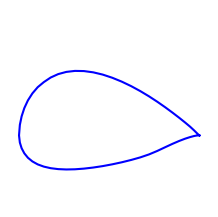

airfoils_img/rg1410.png
data_airfoils/rg149.txt


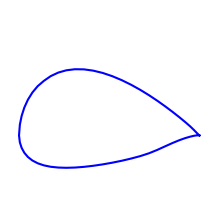

airfoils_img/rg149.png
data_airfoils/rg1495.txt


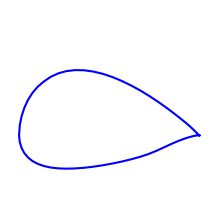

airfoils_img/rg1495.png
data_airfoils/rg14a147.txt


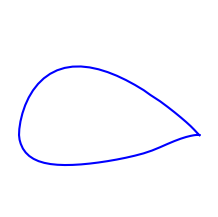

airfoils_img/rg14a147.png
data_airfoils/rg15.txt


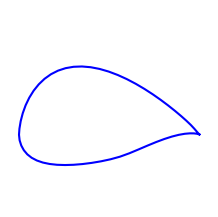

airfoils_img/rg15.png
data_airfoils/rg15a111.txt


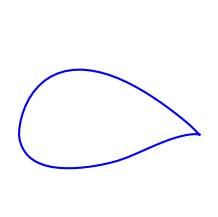

airfoils_img/rg15a111.png
data_airfoils/rg15a213.txt


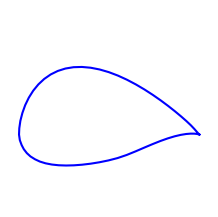

airfoils_img/rg15a213.png
data_airfoils/rg8.txt


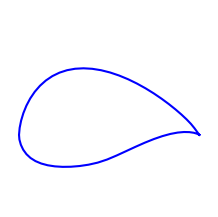

airfoils_img/rg8.png
data_airfoils/rhodesg30.txt


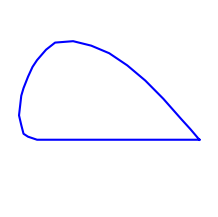

airfoils_img/rhodesg30.png
data_airfoils/rhodesg32.txt


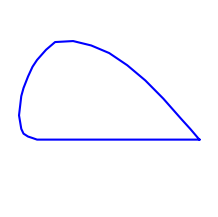

airfoils_img/rhodesg32.png
data_airfoils/rhodesg34.txt


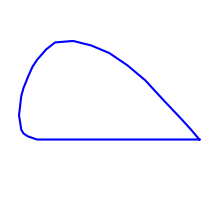

airfoils_img/rhodesg34.png
data_airfoils/rhodesg36.txt


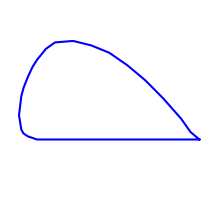

airfoils_img/rhodesg36.png
data_airfoils/RONCZ1046.txt


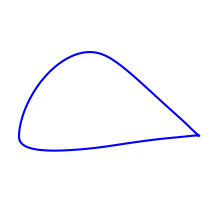

airfoils_img/RONCZ1046.png
data_airfoils/RONCZ1080.txt


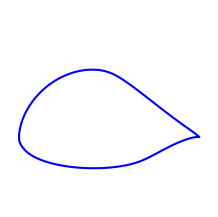

airfoils_img/RONCZ1080.png
data_airfoils/s1010.txt


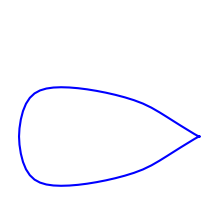

airfoils_img/s1010.png
data_airfoils/s1012.txt


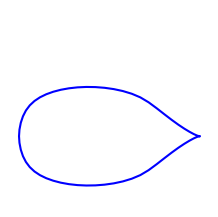

airfoils_img/s1012.png
data_airfoils/s1014.txt


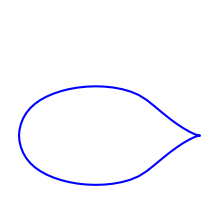

airfoils_img/s1014.png
data_airfoils/s1016.txt


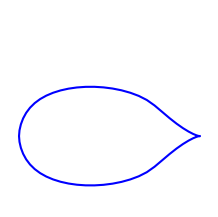

airfoils_img/s1016.png
data_airfoils/s1020.txt


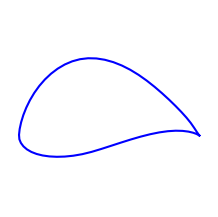

airfoils_img/s1020.png
data_airfoils/s1046.txt


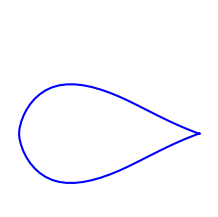

airfoils_img/s1046.png
data_airfoils/s1048.txt


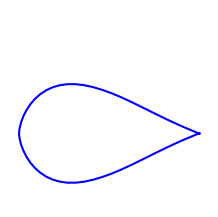

airfoils_img/s1048.png
data_airfoils/s1091.txt


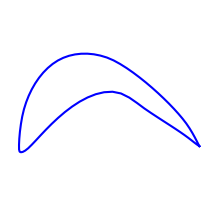

airfoils_img/s1091.png
data_airfoils/s1210.txt


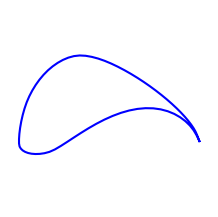

airfoils_img/s1210.png
data_airfoils/s1221.txt


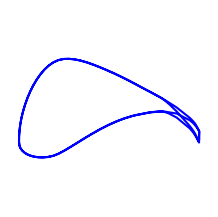

airfoils_img/s1221.png
data_airfoils/s1223.txt


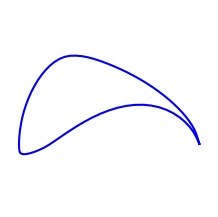

airfoils_img/s1223.png
data_airfoils/s1223rtl.txt


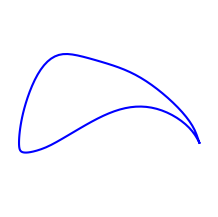

airfoils_img/s1223rtl.png
data_airfoils/s2027.txt


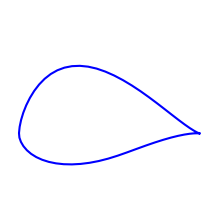

airfoils_img/s2027.png
data_airfoils/s2046.txt


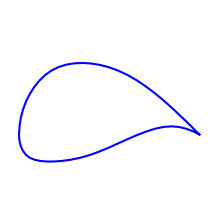

airfoils_img/s2046.png
data_airfoils/s2048.txt


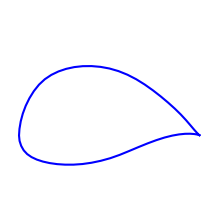

airfoils_img/s2048.png
data_airfoils/s2050.txt


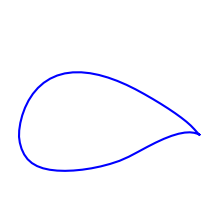

airfoils_img/s2050.png
data_airfoils/s2055.txt


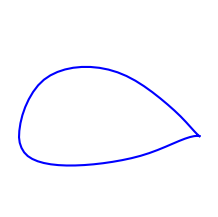

airfoils_img/s2055.png
data_airfoils/s2060.txt


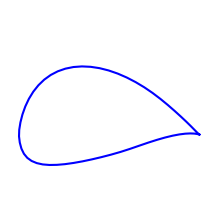

airfoils_img/s2060.png
data_airfoils/s2062.txt


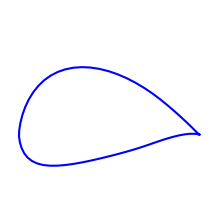

airfoils_img/s2062.png
data_airfoils/s2091.txt


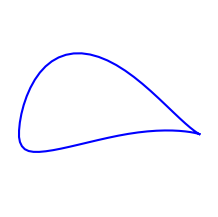

airfoils_img/s2091.png
data_airfoils/s3.txt


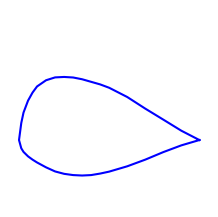

airfoils_img/s3.png
data_airfoils/s3002.txt


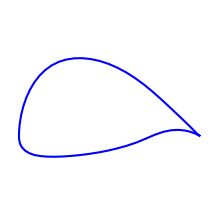

airfoils_img/s3002.png
data_airfoils/s3010.txt


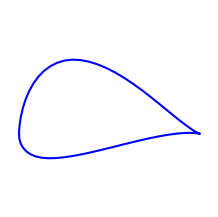

airfoils_img/s3010.png
data_airfoils/s3014.txt


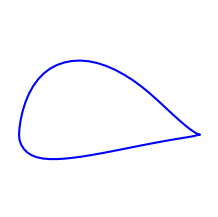

airfoils_img/s3014.png
data_airfoils/s3016.txt


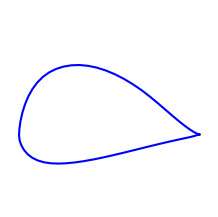

airfoils_img/s3016.png
data_airfoils/s3021.txt


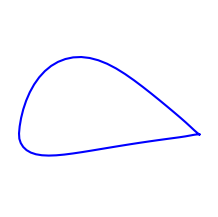

airfoils_img/s3021.png
data_airfoils/s3024.txt


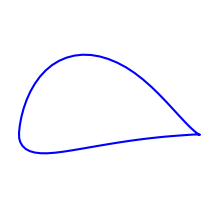

airfoils_img/s3024.png
data_airfoils/s3025.txt


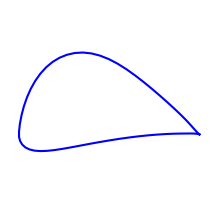

airfoils_img/s3025.png
data_airfoils/s4022.txt


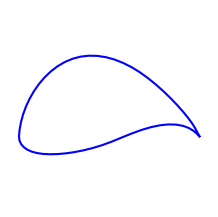

airfoils_img/s4022.png
data_airfoils/s4053.txt


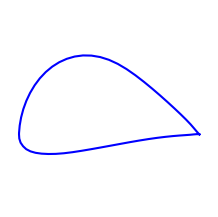

airfoils_img/s4053.png
data_airfoils/s4061.txt


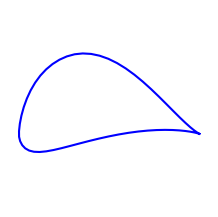

airfoils_img/s4061.png
data_airfoils/s4062.txt


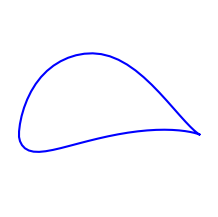

airfoils_img/s4062.png
data_airfoils/s4083.txt


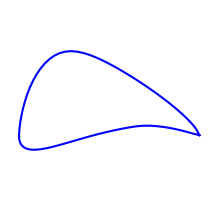

airfoils_img/s4083.png
data_airfoils/s4110.txt


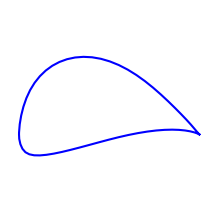

airfoils_img/s4110.png
data_airfoils/s4158.txt


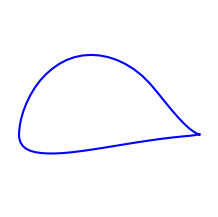

airfoils_img/s4158.png
data_airfoils/s4180.txt


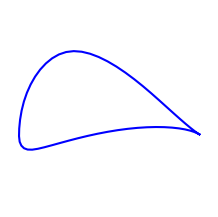

airfoils_img/s4180.png
data_airfoils/s4233.txt


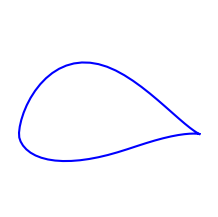

airfoils_img/s4233.png
data_airfoils/s4310.txt


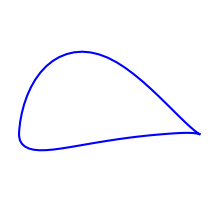

airfoils_img/s4310.png
data_airfoils/s4320.txt


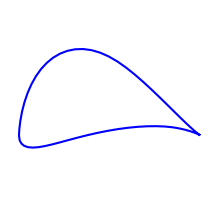

airfoils_img/s4320.png
data_airfoils/s5010.txt


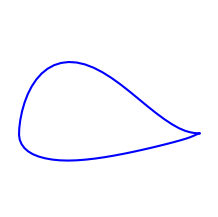

airfoils_img/s5010.png
data_airfoils/s5020.txt


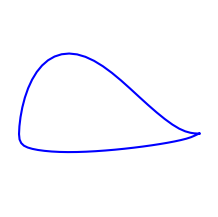

airfoils_img/s5020.png
data_airfoils/s6061.txt


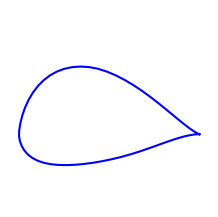

airfoils_img/s6061.png
data_airfoils/s6062.txt


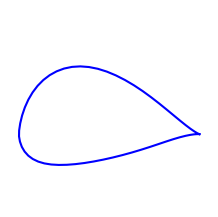

airfoils_img/s6062.png
data_airfoils/s6063.txt


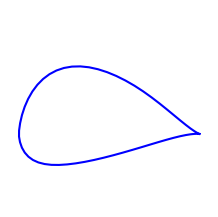

airfoils_img/s6063.png
data_airfoils/s7012.txt


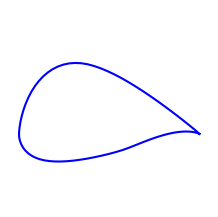

airfoils_img/s7012.png
data_airfoils/s7055.txt


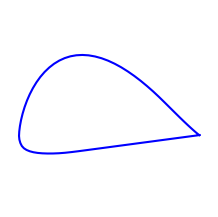

airfoils_img/s7055.png
data_airfoils/s7075.txt


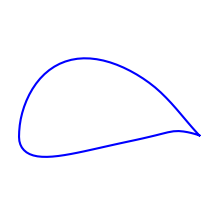

airfoils_img/s7075.png
data_airfoils/s8025.txt


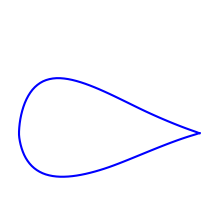

airfoils_img/s8025.png
data_airfoils/s8035.txt


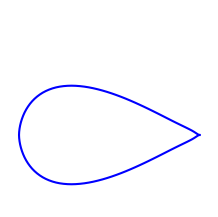

airfoils_img/s8035.png
data_airfoils/s8036.txt


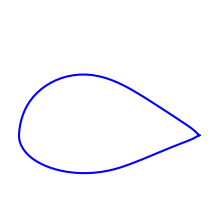

airfoils_img/s8036.png
data_airfoils/s8037.txt


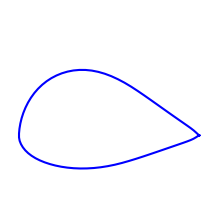

airfoils_img/s8037.png
data_airfoils/s8038.txt


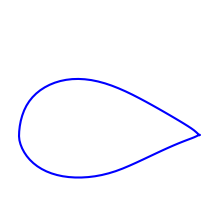

airfoils_img/s8038.png
data_airfoils/s8052.txt


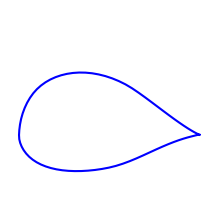

airfoils_img/s8052.png
data_airfoils/s8055.txt


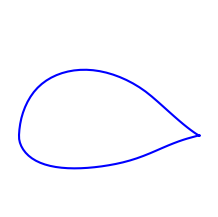

airfoils_img/s8055.png
data_airfoils/s9000.txt


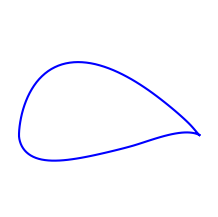

airfoils_img/s9000.png
data_airfoils/s9026.txt


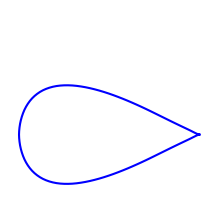

airfoils_img/s9026.png
data_airfoils/s9027.txt


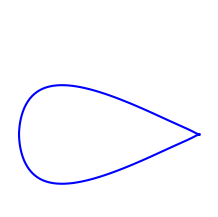

airfoils_img/s9027.png
data_airfoils/s9032.txt


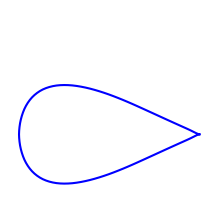

airfoils_img/s9032.png
data_airfoils/s9033.txt


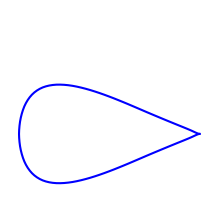

airfoils_img/s9033.png
data_airfoils/s9037.txt


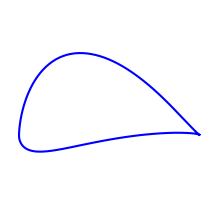

airfoils_img/s9037.png
data_airfoils/sa7035.txt


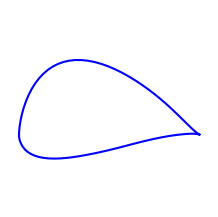

airfoils_img/sa7035.png
data_airfoils/sa7036.txt


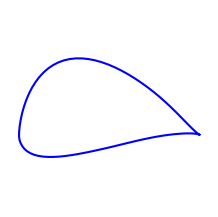

airfoils_img/sa7036.png
data_airfoils/sa7038.txt


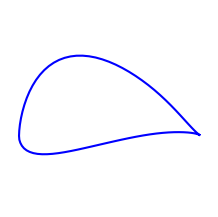

airfoils_img/sa7038.png
data_airfoils/saratov.txt


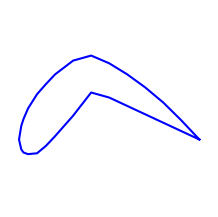

airfoils_img/saratov.png
data_airfoils/sc1012r8.txt


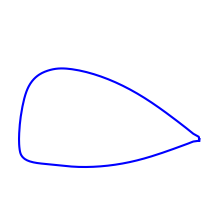

airfoils_img/sc1012r8.png
data_airfoils/sc1094r8.txt


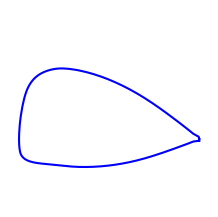

airfoils_img/sc1094r8.png
data_airfoils/sc1095.txt


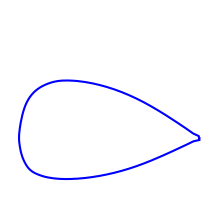

airfoils_img/sc1095.png
data_airfoils/sc1095r8.txt


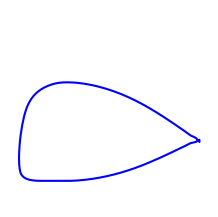

airfoils_img/sc1095r8.png
data_airfoils/sc20010.txt


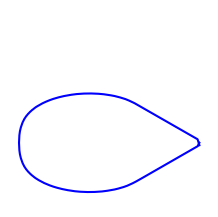

airfoils_img/sc20010.png
data_airfoils/sc20012.txt


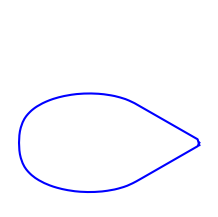

airfoils_img/sc20012.png
data_airfoils/sc20402.txt


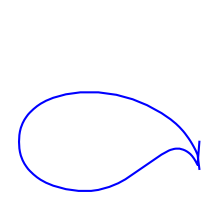

airfoils_img/sc20402.png
data_airfoils/sc20403.txt


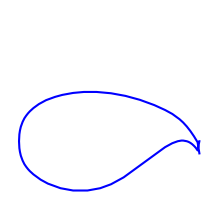

airfoils_img/sc20403.png
data_airfoils/sc20404.txt


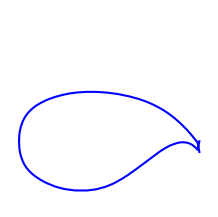

airfoils_img/sc20404.png
data_airfoils/sc20406.txt


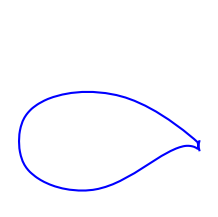

airfoils_img/sc20406.png
data_airfoils/sc20410.txt


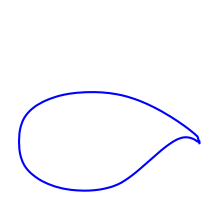

airfoils_img/sc20410.png
data_airfoils/sc20412.txt


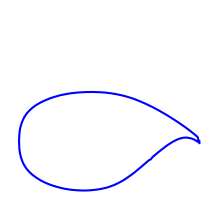

airfoils_img/sc20412.png
data_airfoils/sc20414.txt


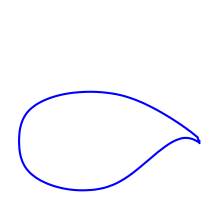

airfoils_img/sc20414.png
data_airfoils/sc20503.txt


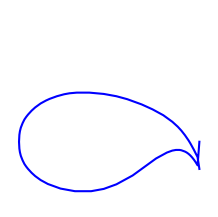

airfoils_img/sc20503.png
data_airfoils/sc20518.txt


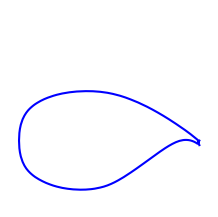

airfoils_img/sc20518.png
data_airfoils/sc20606.txt


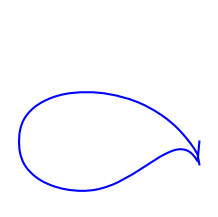

airfoils_img/sc20606.png
data_airfoils/sc20610.txt


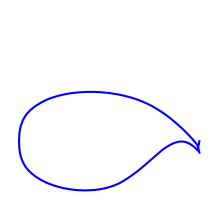

airfoils_img/sc20610.png
data_airfoils/sc20612.txt


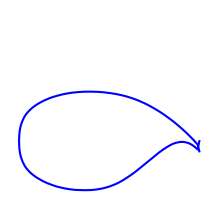

airfoils_img/sc20612.png
data_airfoils/sc20614.txt


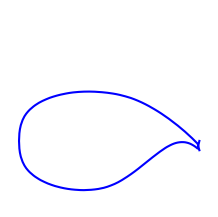

airfoils_img/sc20614.png
data_airfoils/sc20706.txt


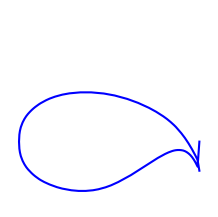

airfoils_img/sc20706.png
data_airfoils/sc20710.txt


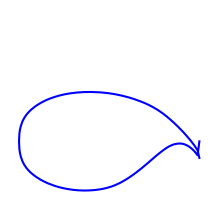

airfoils_img/sc20710.png
data_airfoils/sc20712.txt


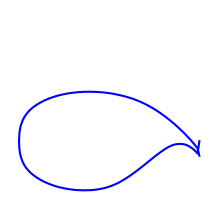

airfoils_img/sc20712.png
data_airfoils/sc20714.txt


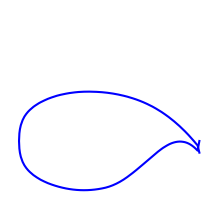

airfoils_img/sc20714.png
data_airfoils/sc21006.txt


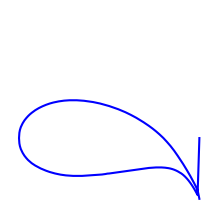

airfoils_img/sc21006.png
data_airfoils/sc21010.txt


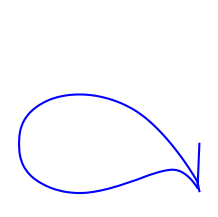

airfoils_img/sc21010.png
data_airfoils/sc2110.txt


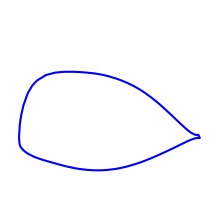

airfoils_img/sc2110.png
data_airfoils/sd2030.txt


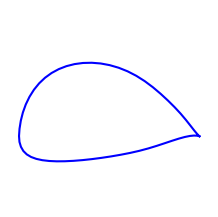

airfoils_img/sd2030.png
data_airfoils/sd2083.txt


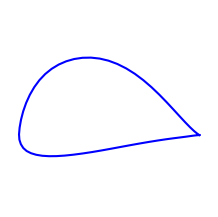

airfoils_img/sd2083.png
data_airfoils/sd5060.txt


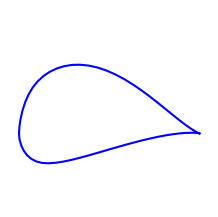

airfoils_img/sd5060.png
data_airfoils/sd6060.txt


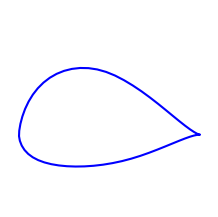

airfoils_img/sd6060.png
data_airfoils/sd6080.txt


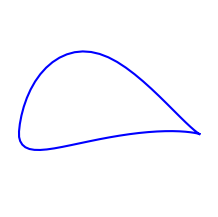

airfoils_img/sd6080.png
data_airfoils/sd7003.txt


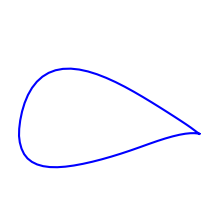

airfoils_img/sd7003.png
data_airfoils/sd7032.txt


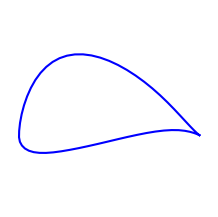

airfoils_img/sd7032.png
data_airfoils/sd7034.txt


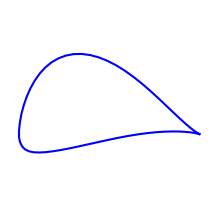

airfoils_img/sd7034.png
data_airfoils/sd7037.txt


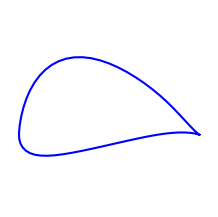

airfoils_img/sd7037.png
data_airfoils/sd7043.txt


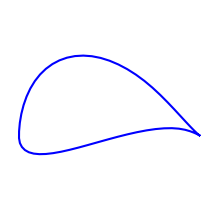

airfoils_img/sd7043.png
data_airfoils/sd7062.txt


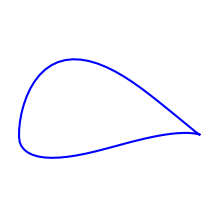

airfoils_img/sd7062.png
data_airfoils/sd7080.txt


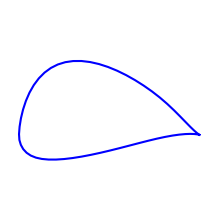

airfoils_img/sd7080.png
data_airfoils/sd7084.txt


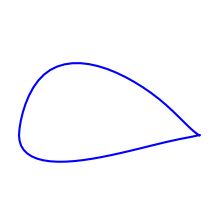

airfoils_img/sd7084.png
data_airfoils/sd7090.txt


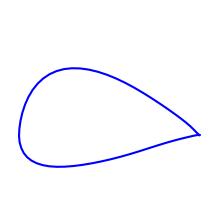

airfoils_img/sd7090.png
data_airfoils/sd8000.txt


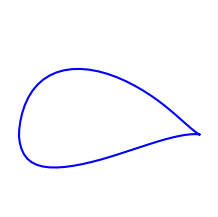

airfoils_img/sd8000.png
data_airfoils/sd8020.txt


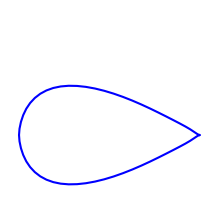

airfoils_img/sd8020.png
data_airfoils/sd8040.txt


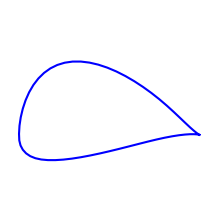

airfoils_img/sd8040.png
data_airfoils/sg6040.txt


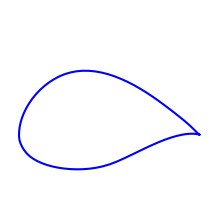

airfoils_img/sg6040.png
data_airfoils/sg6041.txt


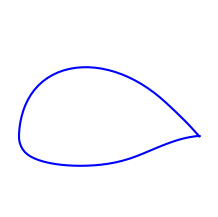

airfoils_img/sg6041.png
data_airfoils/sg6042.txt


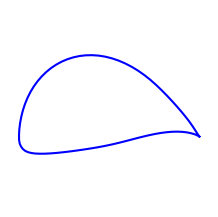

airfoils_img/sg6042.png
data_airfoils/sg6043.txt


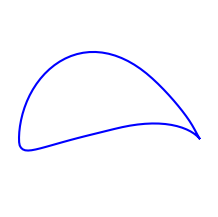

airfoils_img/sg6043.png
data_airfoils/sg6050.txt


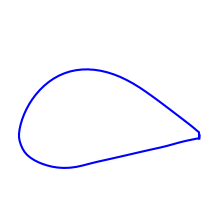

airfoils_img/sg6050.png
data_airfoils/sg6051.txt


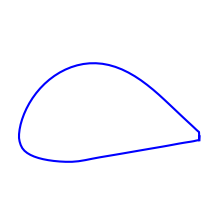

airfoils_img/sg6051.png
data_airfoils/sm701.txt


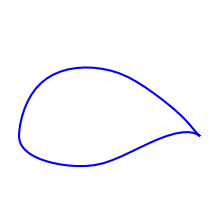

airfoils_img/sm701.png
data_airfoils/sokolov.txt


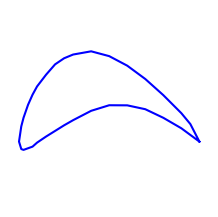

airfoils_img/sokolov.png
data_airfoils/spicasm.txt


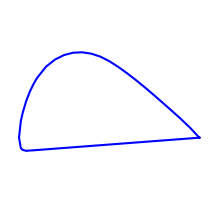

airfoils_img/spicasm.png
data_airfoils/ssca07.txt


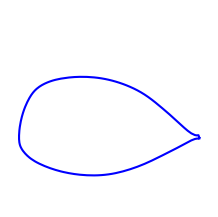

airfoils_img/ssca07.png
data_airfoils/ssca09.txt


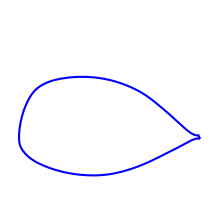

airfoils_img/ssca09.png
data_airfoils/stcyr171.txt


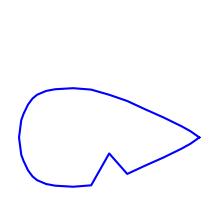

airfoils_img/stcyr171.png
data_airfoils/stcyr172.txt


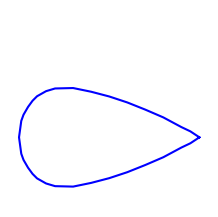

airfoils_img/stcyr172.png
data_airfoils/stcyr234.txt


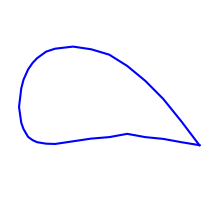

airfoils_img/stcyr234.png
data_airfoils/stcyr24.txt


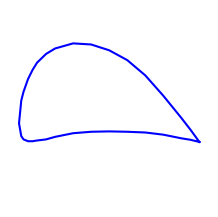

airfoils_img/stcyr24.png
data_airfoils/ste87151.txt


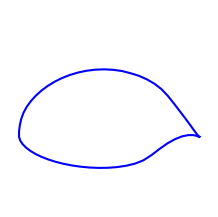

airfoils_img/ste87151.png
data_airfoils/ste87391.txt


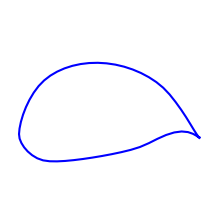

airfoils_img/ste87391.png
data_airfoils/stf86361.txt


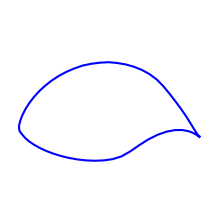

airfoils_img/stf86361.png
data_airfoils/strand.txt


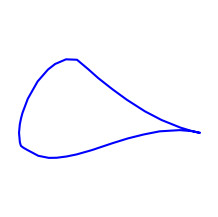

airfoils_img/strand.png
data_airfoils/tempest1.txt


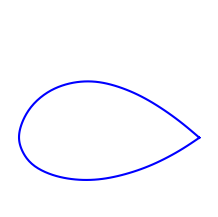

airfoils_img/tempest1.png
data_airfoils/tempest2.txt


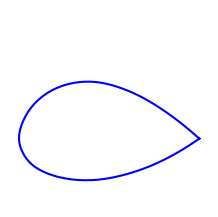

airfoils_img/tempest2.png
data_airfoils/tempest3.txt


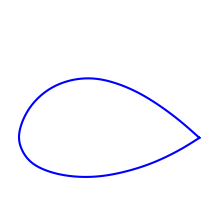

airfoils_img/tempest3.png
data_airfoils/th25816.txt


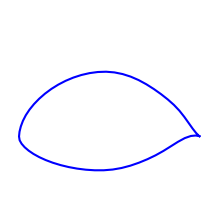

airfoils_img/th25816.png
data_airfoils/trainer60.txt


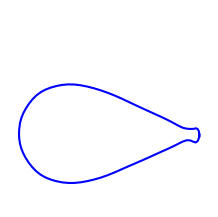

airfoils_img/trainer60.png
data_airfoils/tsagi12.txt


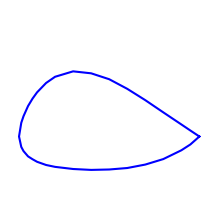

airfoils_img/tsagi12.png
data_airfoils/tsagi8.txt


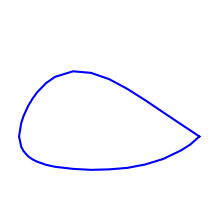

airfoils_img/tsagi8.png
data_airfoils/ua2-180.txt


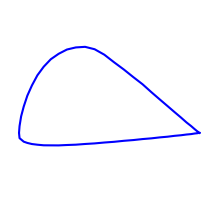

airfoils_img/ua2-180.png
data_airfoils/ua2-180sm.txt


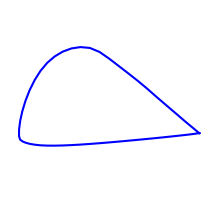

airfoils_img/ua2-180sm.png
data_airfoils/ua79sf18.txt


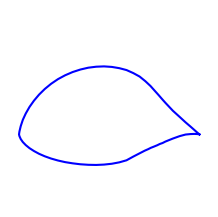

airfoils_img/ua79sf18.png
data_airfoils/ua79sff.txt


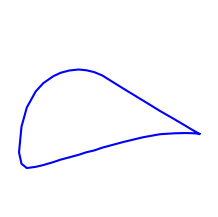

airfoils_img/ua79sff.png
data_airfoils/ua79sfm.txt


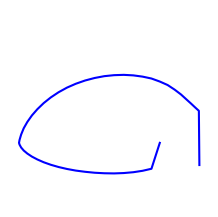

airfoils_img/ua79sfm.png
data_airfoils/uag8814320.txt


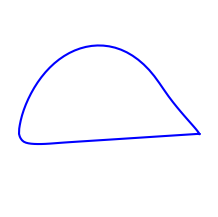

airfoils_img/uag8814320.png
data_airfoils/ui1720.txt


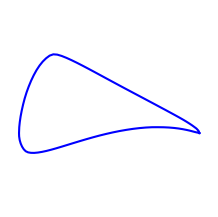

airfoils_img/ui1720.png
data_airfoils/ultimate.txt


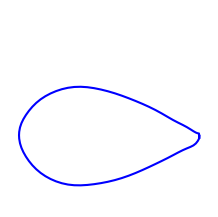

airfoils_img/ultimate.png
data_airfoils/us1000root.txt


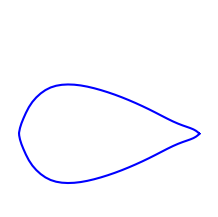

airfoils_img/us1000root.png
data_airfoils/usa22.txt


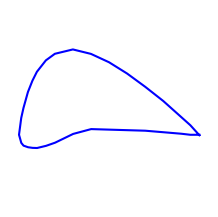

airfoils_img/usa22.png
data_airfoils/usa25.txt


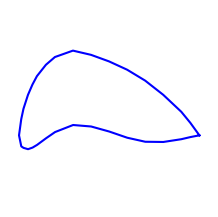

airfoils_img/usa25.png
data_airfoils/usa26.txt


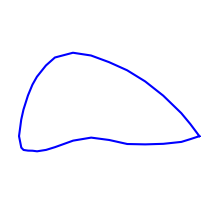

airfoils_img/usa26.png
data_airfoils/usa27.txt


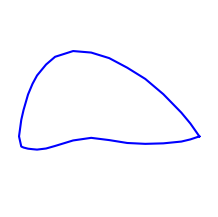

airfoils_img/usa27.png
data_airfoils/usa27m2.txt


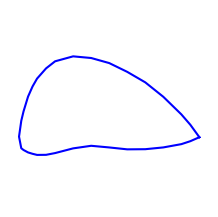

airfoils_img/usa27m2.png
data_airfoils/usa28.txt


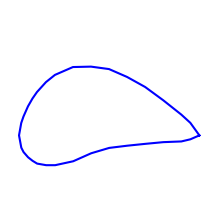

airfoils_img/usa28.png
data_airfoils/usa29.txt


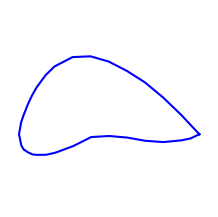

airfoils_img/usa29.png
data_airfoils/usa31.txt


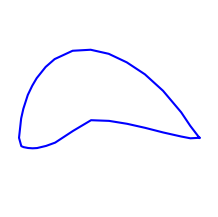

airfoils_img/usa31.png
data_airfoils/usa32.txt


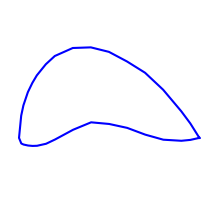

airfoils_img/usa32.png
data_airfoils/usa33.txt


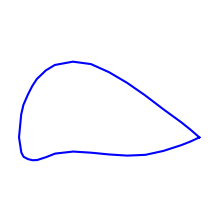

airfoils_img/usa33.png
data_airfoils/usa34.txt


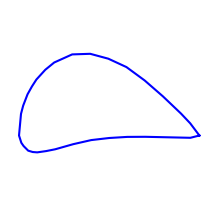

airfoils_img/usa34.png
data_airfoils/usa35.txt


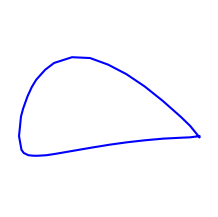

airfoils_img/usa35.png
data_airfoils/usa35a.txt


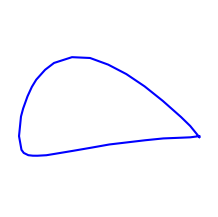

airfoils_img/usa35a.png
data_airfoils/usa35b.txt


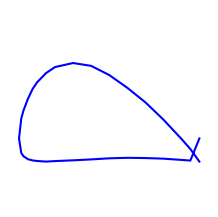

airfoils_img/usa35b.png
data_airfoils/usa40.txt


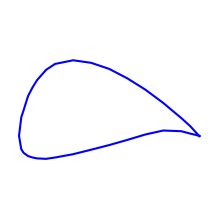

airfoils_img/usa40.png
data_airfoils/usa40b.txt


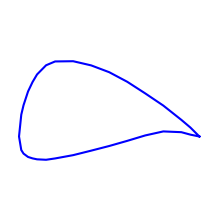

airfoils_img/usa40b.png
data_airfoils/usa41.txt


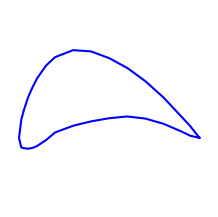

airfoils_img/usa41.png
data_airfoils/usa45.txt


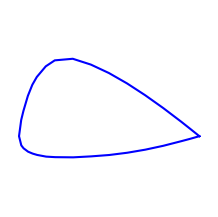

airfoils_img/usa45.png
data_airfoils/usa45m.txt


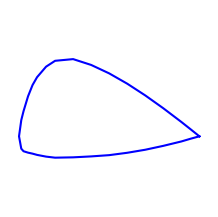

airfoils_img/usa45m.png
data_airfoils/usa46.txt


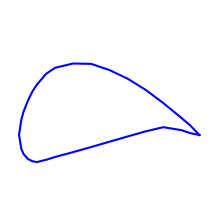

airfoils_img/usa46.png
data_airfoils/usa48.txt


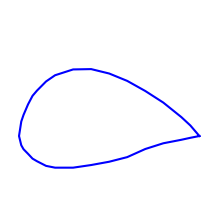

airfoils_img/usa48.png
data_airfoils/usa49.txt


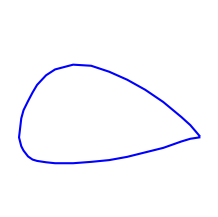

airfoils_img/usa49.png
data_airfoils/usa5.txt


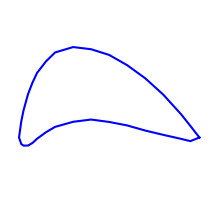

airfoils_img/usa5.png
data_airfoils/usa50.txt


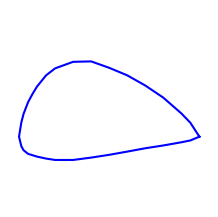

airfoils_img/usa50.png
data_airfoils/usa51.txt


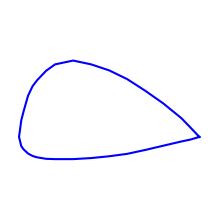

airfoils_img/usa51.png
data_airfoils/usa98.txt


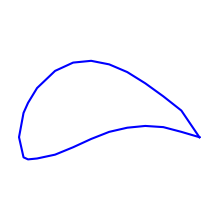

airfoils_img/usa98.png
data_airfoils/usnps4.txt


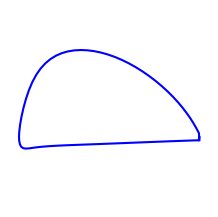

airfoils_img/usnps4.png
data_airfoils/v13006.txt


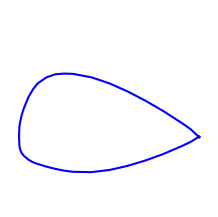

airfoils_img/v13006.png
data_airfoils/v13009.txt


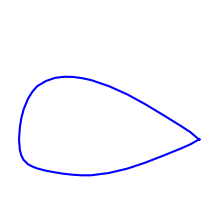

airfoils_img/v13009.png
data_airfoils/v23010.txt


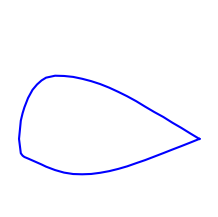

airfoils_img/v23010.png
data_airfoils/v43012.txt


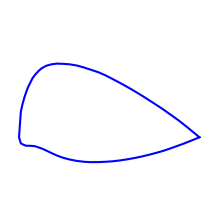

airfoils_img/v43012.png
data_airfoils/v43015.txt


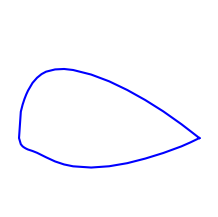

airfoils_img/v43015.png
data_airfoils/vr1.txt


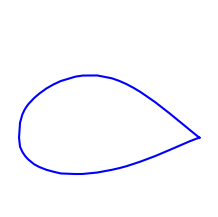

airfoils_img/vr1.png
data_airfoils/vr11x.txt


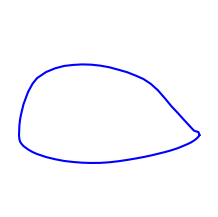

airfoils_img/vr11x.png
data_airfoils/vr12.txt


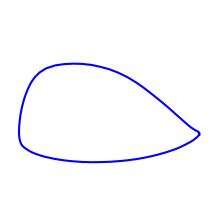

airfoils_img/vr12.png
data_airfoils/vr13.txt


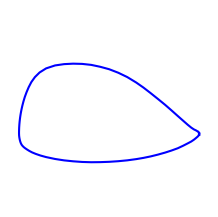

airfoils_img/vr13.png
data_airfoils/vr14.txt


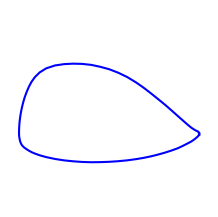

airfoils_img/vr14.png
data_airfoils/vr15.txt


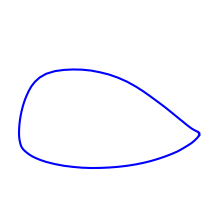

airfoils_img/vr15.png
data_airfoils/vr5.txt


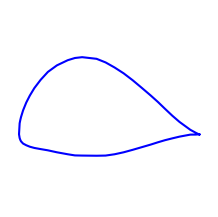

airfoils_img/vr5.png
data_airfoils/vr7.txt


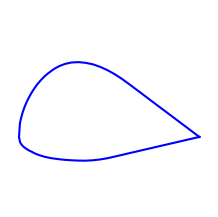

airfoils_img/vr7.png
data_airfoils/vr7b.txt


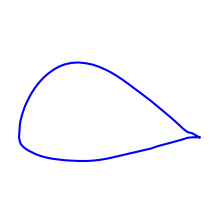

airfoils_img/vr7b.png
data_airfoils/vr8.txt


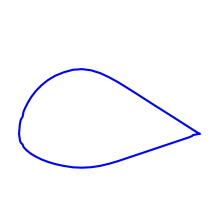

airfoils_img/vr8.png
data_airfoils/vr8b.txt


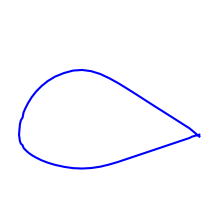

airfoils_img/vr8b.png
data_airfoils/vr9.txt


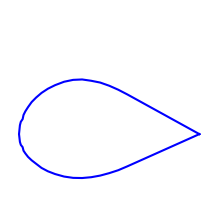

airfoils_img/vr9.png
data_airfoils/waspsm.txt


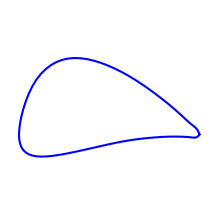

airfoils_img/waspsm.png
data_airfoils/wb13535sm.txt


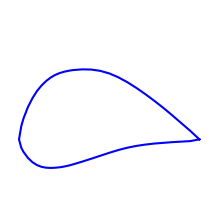

airfoils_img/wb13535sm.png
data_airfoils/wb140.txt


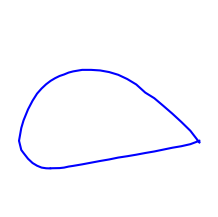

airfoils_img/wb140.png
data_airfoils/whitcomb.txt


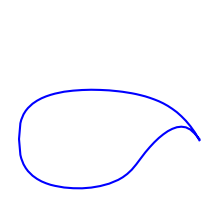

airfoils_img/whitcomb.png
data_airfoils/ys900.txt


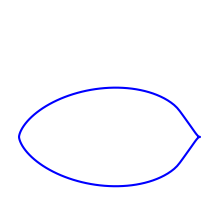

airfoils_img/ys900.png
data_airfoils/ys915.txt


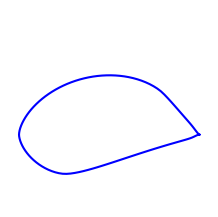

airfoils_img/ys915.png
data_airfoils/ys930.txt


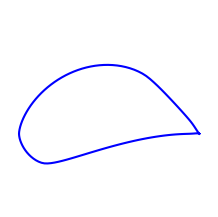

airfoils_img/ys930.png


In [8]:
for index,item in enumerate(file_path):
    try:
        print(item)
        img_path = DataShapeSet(item)
        print(img_path)
        SaveGrayImg(img_path)
    except ValueError:
        # 如果转换失败，则跳过
        continue

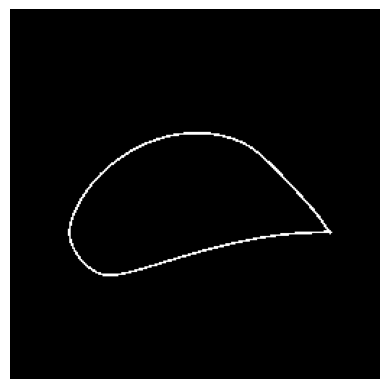

In [9]:
img = mpimg.imread(img_path)
imgplot = plt.imshow(img)
plt.axis('off')
plt.grid(False)
plt.show()